# Russian Wholesale Electricity Market

## Context

On 1st September 2006, the Wholesale Electricity and Capacity Market was launched in Russia. The nodal pricing system is applied to the wholesale market: each node gets an individual price value for a certain hour. For the price analysis and forecast problem, the analyst uses the weighted average of the nodal prices for certain territory such as price zone, united energy system and others. More details about the Wholesale Electricity and Capacity Market of Russia you will find in my latest paper The Three-Headed Dragon: Electricity, Trading, Analysis.﻿

## Content

The data files include

* the weighted average of the nodal day ahead prices for the European and Siberian price zones of the market;
* the weighted average of the nodal day ahead prices for six United Energy Systems: NorthWest, Centre, Ural, South, Middle Volga and Siberia;
* the day ahead scheduled volume for the European and Siberian price zones;
* the weighted average of the nodal intraday prices for three United Energy Systems: NorthWest, Centre and Siberia

Time stamps are in Europe/Moscow timezone.

For more details, please see [The Three-Headed Dragon: Electricity, Trading, Analysis](https://www.mbureau.energy/articles/three-headed-dragon-electricity-trading-analysis-first-head-electricity).

## CHALLENGES
Electricity is a commodity capable of being bought, sold, and traded. All nations are moving towards a
Deregulated Electricity Market System where the competitors are allowed to buy and sell electricity by
permitting market participants to invest in power plants and transmission lines. Also, it offers a broader
range of renewable energy options - the need of the hour.
This system has paved the way for Data Scientists/ Machine Learning Engineers to extensively participate in
the growing dynamic energy management systems. The spectrum includes predicting energy requirements,
prices, network grid analysis, etc.

## PROJECT DESCRIPTION: WHOLESALE ELECTRICITY MARKET DATASET
Addressing the high demand for power, on the 1st of September 2006, the Wholesale Electricity and
Capacity Market was launched in Russia. Now, both the price and electricity consumption forecast problem
is highly important on the Wholesale Electricity Market. Thus, the questions:

* What price should we expect tomorrow, next week, next year?
* What electricity consumption should we expect tomorrow, next week, next year?

It is important to employ analysts, ML Engineers, and Data Scientists to extract patterns from data to derive
insights that could help different aspects of the operation.

Reference : https://machinelearningmastery.com/autoregression-models-time-series-forecasting-python/

# Exploratory Data Analysis

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import os

sns.set()
pd.set_option('display.max_rows', None) 

In [3]:
#fetch files from directory
pathcwd = os.getcwd()
path = pathcwd + "/Project data/Russian Electricity Data 2006"
files = glob.glob(path + "/*.csv")
files

['/Users/user/Documents/Data Science/Hamoye/Project data/Russian Electricity Data 2006/RU_Electricity_Market_UES_intraday_price.csv',
 '/Users/user/Documents/Data Science/Hamoye/Project data/Russian Electricity Data 2006/RU_Electricity_Market_PZ_dayahead_price_volume.csv',
 '/Users/user/Documents/Data Science/Hamoye/Project data/Russian Electricity Data 2006/RU_Electricity_Market_UES_dayahead_price.csv']

In [4]:
for file in files:
    print(file)

/Users/user/Documents/Data Science/Hamoye/Project data/Russian Electricity Data 2006/RU_Electricity_Market_UES_intraday_price.csv
/Users/user/Documents/Data Science/Hamoye/Project data/Russian Electricity Data 2006/RU_Electricity_Market_PZ_dayahead_price_volume.csv
/Users/user/Documents/Data Science/Hamoye/Project data/Russian Electricity Data 2006/RU_Electricity_Market_UES_dayahead_price.csv


In [5]:
UES_intraday_price = pd.read_csv(files[0])
PZ_dayahead_price_volume = pd.read_csv(files[1])
UES_dayahead_price = pd.read_csv(files[2])
UES_intraday_price.head()


,timestep,UES_Northwest,UES_Siberia,UES_Center
0,2017-01-01 00:00,767,918,982
1,2017-01-01 01:00,675,889,848
2,2017-01-01 02:00,717,933,920
3,2017-01-01 03:00,683,947,885
4,2017-01-01 04:00,633,934,829


In [5]:
def data_details(data):
    head = data.head()
    info = data.info()
    describe = data.describe()
    any_null = data.isnull().any()
    
    return (print(head),
                  print(info), 
                  print(describe),
                  print(any_null))

In [6]:
data_details(UES_intraday_price)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24072 entries, 0 to 24071
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   timestep       24072 non-null  object
 1   UES_Northwest  24072 non-null  int64 
 2   UES_Siberia    24072 non-null  int64 
 3   UES_Center     24072 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 752.4+ KB
           timestep  UES_Northwest  UES_Siberia  UES_Center
0  2017-01-01 00:00            767          918         982
1  2017-01-01 01:00            675          889         848
2  2017-01-01 02:00            717          933         920
3  2017-01-01 03:00            683          947         885
4  2017-01-01 04:00            633          934         829
None
       UES_Northwest   UES_Siberia    UES_Center
count   24072.000000  24072.000000  24072.000000
mean      990.692921    794.586200   1210.754944
std       316.709637    259.351579    356.775935
min         0.000000 

(None, None, None, None)

### 0 Minimum Values ????
Notice that the minimum values for all three regions is Zero (0). Since we are talking about prices it is mostly unlikely that there are hours/periods where electricity is free. So we assume these are errors.

Or does that mean there was no power supply within those hours?? THEM DEY TAKE LIGHT FOR RUSSIA??????

Let's count the number of Zero values in each region.



In [10]:
count = 0
count1 = 0
count2 = 0
for row, i in UES_intraday_price.iterrows():
    if i[1] == 0:
        count += 1
    if i[2] == 0:
        count1 += 1
    if i[3] == 0:
        count2 += 1
print (f"There are {count} - 0 values in UES_Northwest")
print (f"There are {count1} - 0 values in UES_Siberia")
print (f"There are {count2} - 0 values in UES_Center")

There are 63 - 0 values in UES_Northwest
There are 642 - 0 values in UES_Siberia
There are 73 - 0 values in UES_Center


In [11]:
"""# print timestamp of each zero values

for row, i in UES_intraday_price.iterrows():
    if i[1] == 0:
        print (i)"""
    

timestep         2017-01-26 00:00
UES_Northwest                   0
UES_Siberia                   309
UES_Center                      0
Name: 600, dtype: object
timestep         2017-01-26 01:00
UES_Northwest                   0
UES_Siberia                   318
UES_Center                      1
Name: 601, dtype: object
timestep         2017-04-16 23:00
UES_Northwest                   0
UES_Siberia                     0
UES_Center                      1
Name: 2543, dtype: object
timestep         2017-04-21 01:00
UES_Northwest                   0
UES_Siberia                   304
UES_Center                      0
Name: 2641, dtype: object
timestep         2017-04-28 02:00
UES_Northwest                   0
UES_Siberia                   381
UES_Center                      0
Name: 2810, dtype: object
timestep         2017-05-01 03:00
UES_Northwest                   0
UES_Siberia                   381
UES_Center                      0
Name: 2883, dtype: object
timestep         2017-05-03 04

timestep         2018-11-18 02:00
UES_Northwest                   0
UES_Siberia                   833
UES_Center                    540
Name: 16466, dtype: object
timestep         2018-11-18 03:00
UES_Northwest                   0
UES_Siberia                   834
UES_Center                    538
Name: 16467, dtype: object
timestep         2019-05-12 04:00
UES_Northwest                   0
UES_Siberia                  1032
UES_Center                      0
Name: 20668, dtype: object
timestep         2019-07-02 23:00
UES_Northwest                   0
UES_Siberia                     0
UES_Center                      3
Name: 21911, dtype: object
timestep         2019-08-26 03:00
UES_Northwest                   0
UES_Siberia                   227
UES_Center                      0
Name: 23211, dtype: object
timestep         2019-09-10 02:00
UES_Northwest                   0
UES_Siberia                   117
UES_Center                      0
Name: 23570, dtype: object
timestep         2019-

In [13]:
data_details(PZ_dayahead_price_volume)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45816 entries, 0 to 45815
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   timestep         45816 non-null  object 
 1   consumption_eur  45816 non-null  float64
 2   consumption_sib  45816 non-null  float64
 3   price_eur        45816 non-null  float64
 4   price_sib        45816 non-null  float64
dtypes: float64(4), object(1)
memory usage: 1.7+ MB
           timestep  consumption_eur  consumption_sib  price_eur  price_sib
0  2006-09-01 00:00          62341.0          17916.0     275.22        0.0
1  2006-09-01 01:00          60625.0          17467.0       0.00        0.0
2  2006-09-01 02:00          59685.0          17161.0       0.00        0.0
3  2006-09-01 03:00          59500.0          17061.0       0.00        0.0
4  2006-09-01 04:00          60617.0          17074.0       0.00        0.0
None
       consumption_eur  consumption_sib     price_eur    

(None, None, None, None)

In [14]:
data_details(UES_dayahead_price)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23952 entries, 0 to 23951
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   timestep          23952 non-null  object 
 1   UES_Northwest     23952 non-null  float64
 2   UES_Siberia       23952 non-null  float64
 3   UES_Middle_Volga  23952 non-null  float64
 4   UES_Urals         23952 non-null  float64
 5   UES_Center        23952 non-null  float64
 6   UES_South         23952 non-null  float64
dtypes: float64(6), object(1)
memory usage: 1.3+ MB
           timestep  UES_Northwest  UES_Siberia  UES_Middle_Volga  UES_Urals  \
0  2017-01-01 00:00         964.67      1006.27           1032.80     953.23   
1  2017-01-01 01:00         984.79      1003.79           1033.34     946.79   
2  2017-01-01 02:00         962.54      1005.09           1029.51     944.35   
3  2017-01-01 03:00         888.44      1002.38            976.34     906.15   
4  2017-01-01 04:

(None, None, None, None)

### Zero Values Explained
After some research, I found that: 

`"If a consumer leaves the price cells empty, it declares its intention to buy electricity at any market price. This type of bid is called a price independent bid. Such bids reflect inelastic demand, as discussed earlier. In 2017 in Russia 99.5% of bids were price independent."`

This explains why there are lots of zero values, especially in 2017.

Further data exploration shows that there are values as low as 1 through 50 in the data set, especially prices. It is worthy to note that the values for each hour is a cummulative average for a particular region the said hour, hence we decide to replace all values from 0 - 50 with the mean values of each region.

### Replace Values between 0 & 50 with mean values



In [6]:
#write function to drop values below 50.0
#1. Convert timestep to datetime data type

def replace_vals(data):
    data.reset_index(drop = True, inplace = True)
    data["timestep"] = pd.to_datetime(data["timestep"])
    data.drop("timestep", axis = 1)
    data.set_index("timestep", drop = True, inplace = True)
    
    #2. replace all values between 0 & 50 with Nan
    
    for item in data:
        data[item] = data[item].mask(data[item] < 50, np.nan)
    
    #data[(data >= 0.0) & (data <= 50.0)] = np.nan
    
    #3. replace all NaN values by mean
    
    data = data.fillna(data.mean(), inplace = True)
    #data.drop("timestep", axis = 1)"""
    return data
    

In [7]:
replace_vals(UES_intraday_price)
UES_intraday_price.head()

,UES_Northwest,UES_Siberia,UES_Center
timestep,,,
2017-01-01 00:00:00,767.0,918.0,982.0
2017-01-01 01:00:00,675.0,889.0,848.0
2017-01-01 02:00:00,717.0,933.0,920.0
2017-01-01 03:00:00,683.0,947.0,885.0
2017-01-01 04:00:00,633.0,934.0,829.0


In [8]:
replace_vals(PZ_dayahead_price_volume)
PZ_dayahead_price_volume.head()

,consumption_eur,consumption_sib,price_eur,price_sib
timestep,,,,
2006-09-01 00:00:00,62341.0,17916.0,275.22000,469.245309
2006-09-01 01:00:00,60625.0,17467.0,731.45809,469.245309
2006-09-01 02:00:00,59685.0,17161.0,731.45809,469.245309
2006-09-01 03:00:00,59500.0,17061.0,731.45809,469.245309
2006-09-01 04:00:00,60617.0,17074.0,731.45809,469.245309


In [34]:
PZ_dayahead_price_volume.describe()

,consumption_eur,consumption_sib,price_eur,price_sib
count,45816.000000,45816.000000,45816.000000,45816.000000
mean,82294.752037,22297.937294,730.232149,430.219400
std,11046.135452,3035.991381,239.185651,167.183197
min,57847.000000,15328.674800,0.000000,0.000000
25%,74157.500000,19697.000000,563.472500,365.077500
50%,81194.421875,22057.000000,708.590000,470.565000
75%,90337.886718,24788.054198,902.702500,533.752500
max,111722.984400,30666.000000,2135.010000,1029.690000


In [9]:
replace_vals(UES_dayahead_price)
UES_dayahead_price.head()

,UES_Northwest,UES_Siberia,UES_Middle_Volga,UES_Urals,UES_Center,UES_South
timestep,,,,,,
2017-01-01 00:00:00,964.67,1006.27,1032.80,953.23,1050.17,1706.30
2017-01-01 01:00:00,984.79,1003.79,1033.34,946.79,1051.15,1592.17
2017-01-01 02:00:00,962.54,1005.09,1029.51,944.35,1039.84,1561.85
2017-01-01 03:00:00,888.44,1002.38,976.34,906.15,977.04,1534.37
2017-01-01 04:00:00,847.10,1002.58,945.28,894.08,938.27,1517.58


In [13]:
UES_dayahead_price.describe()

,UES_Northwest,UES_Siberia,UES_Middle_Volga,UES_Urals,UES_Center,UES_South
count,23952.000000,23952.000000,23952.000000,23952.000000,23952.000000,23952.000000
mean,1156.663633,884.747474,1250.445322,1065.649254,1320.611582,1499.861130
std,259.654809,147.955679,250.353041,158.588677,287.771912,357.372344
min,75.560000,50.440000,72.980000,92.960000,58.140000,53.650000
25%,942.770000,812.827500,1033.537500,941.230000,1059.180000,1254.120000
50%,1206.395000,907.095000,1316.360000,1079.210000,1400.825000,1605.135000
75%,1354.622500,983.747500,1440.127500,1183.322500,1551.875000,1752.300000
max,2488.860000,1229.400000,1822.970000,1518.630000,2687.760000,5039.830000


### Moving On!


# Visualization

In [10]:
dayahead_price = PZ_dayahead_price_volume
dayahead_price.head()

,consumption_eur,consumption_sib,price_eur,price_sib
timestep,,,,
2006-09-01 00:00:00,62341.0,17916.0,275.22000,469.245309
2006-09-01 01:00:00,60625.0,17467.0,731.45809,469.245309
2006-09-01 02:00:00,59685.0,17161.0,731.45809,469.245309
2006-09-01 03:00:00,59500.0,17061.0,731.45809,469.245309
2006-09-01 04:00:00,60617.0,17074.0,731.45809,469.245309


Text(0, 0.5, 'price_sib')

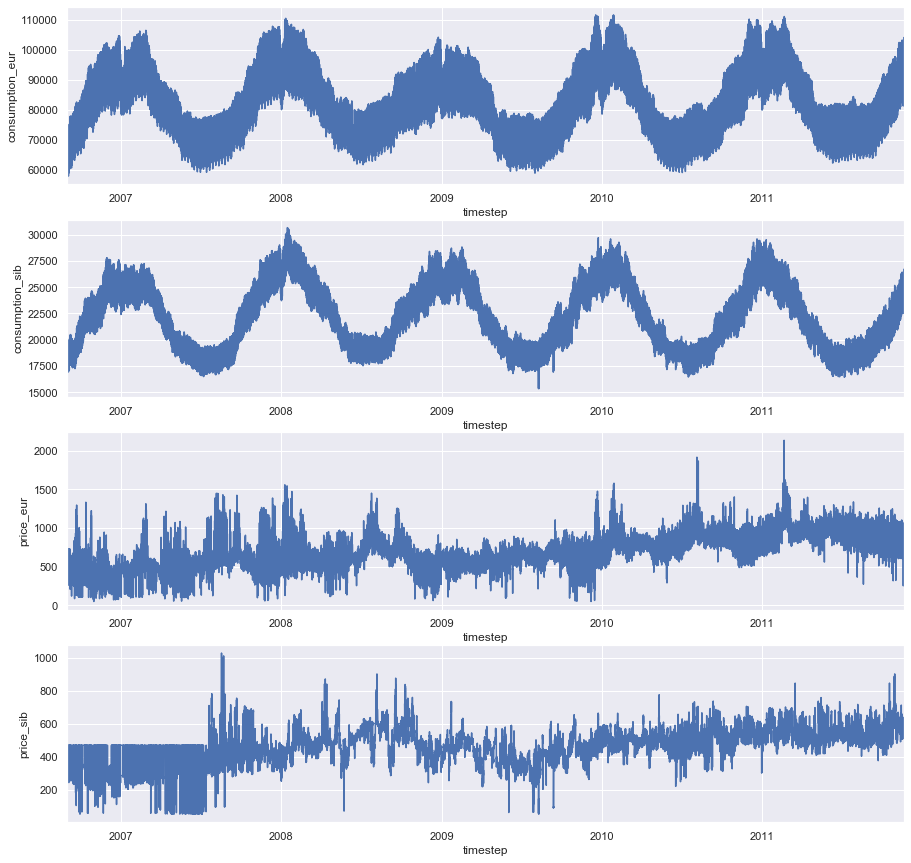

In [11]:
#Time series plot of PZ_dayahead_price_volume
plt.figure(figsize = (15,15))

ax1 = plt.subplot(4, 1, 1)
dayahead_price['consumption_eur'].plot()
ax1.set_ylabel("consumption_eur")

ax2 = plt.subplot(4, 1, 2)
dayahead_price['consumption_sib'].plot()
ax2.set_ylabel("consumption_sib")

ax3 = plt.subplot(4, 1, 3)
dayahead_price['price_eur'].plot()
ax3.set_ylabel("price_eur")

ax4 = plt.subplot(4, 1, 4)
dayahead_price['price_sib'].plot()
ax4.set_ylabel("price_sib")

In [16]:
UES_dayahead_price.head()

,UES_Northwest,UES_Siberia,UES_Middle_Volga,UES_Urals,UES_Center,UES_South
timestep,,,,,,
2017-01-01 00:00:00,964.67,1006.27,1032.80,953.23,1050.17,1706.30
2017-01-01 01:00:00,984.79,1003.79,1033.34,946.79,1051.15,1592.17
2017-01-01 02:00:00,962.54,1005.09,1029.51,944.35,1039.84,1561.85
2017-01-01 03:00:00,888.44,1002.38,976.34,906.15,977.04,1534.37
2017-01-01 04:00:00,847.10,1002.58,945.28,894.08,938.27,1517.58


Text(0, 0.5, 'UES_South')

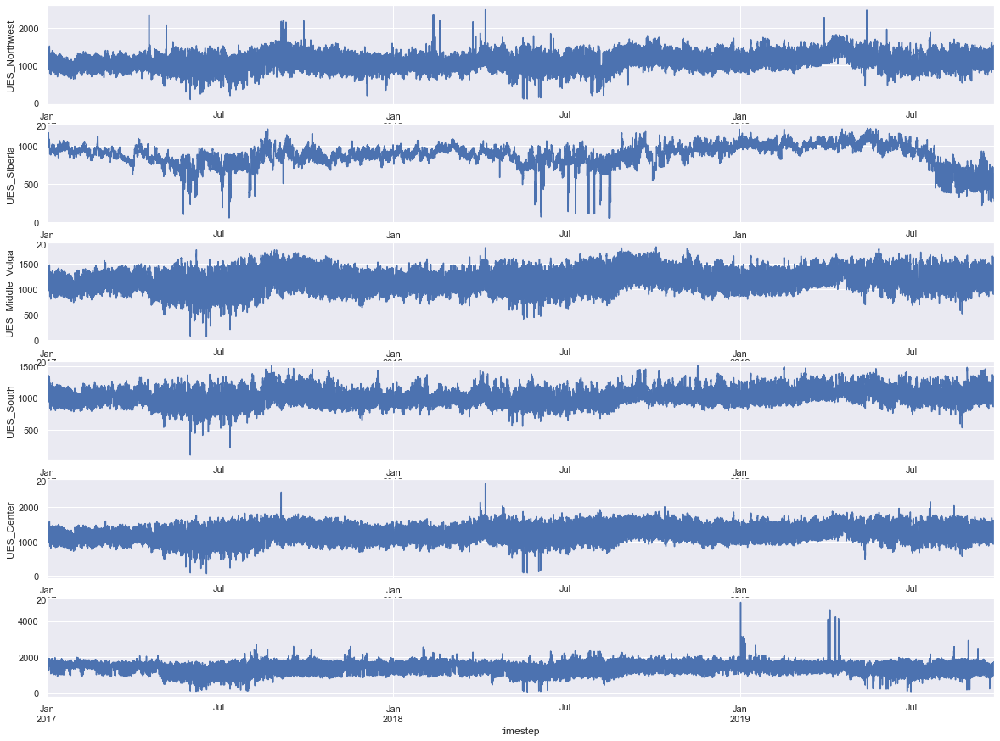

In [12]:
#time series plot for UES_dayahead_price
plt.figure(figsize = (20,15))

ax1 = plt.subplot(6, 1, 1)
UES_dayahead_price['UES_Northwest'].plot()
ax1.set_ylabel("UES_Northwest")

ax2 = plt.subplot(6, 1, 2)
UES_dayahead_price['UES_Siberia'].plot()
ax2.set_ylabel("UES_Siberia")

ax3 = plt.subplot(6, 1, 3)
UES_dayahead_price['UES_Middle_Volga'].plot()
ax3.set_ylabel("UES_Middle_Volga")

ax4 = plt.subplot(6, 1, 4)
UES_dayahead_price['UES_Urals'].plot()
ax4.set_ylabel("UES_Urals")

ax5 = plt.subplot(6, 1, 5)
UES_dayahead_price['UES_Center'].plot()
ax5.set_ylabel("UES_Center")

ax6 = plt.subplot(6, 1, 6)
UES_dayahead_price['UES_South'].plot()
ax4.set_ylabel("UES_South")

In [14]:
intraday_price = UES_intraday_price
intraday_price.head()

,UES_Northwest,UES_Siberia,UES_Center
timestep,,,
2017-01-01 00:00:00,767.0,918.0,982.0
2017-01-01 01:00:00,675.0,889.0,848.0
2017-01-01 02:00:00,717.0,933.0,920.0
2017-01-01 03:00:00,683.0,947.0,885.0
2017-01-01 04:00:00,633.0,934.0,829.0


Text(0, 0.5, 'UES_Center')

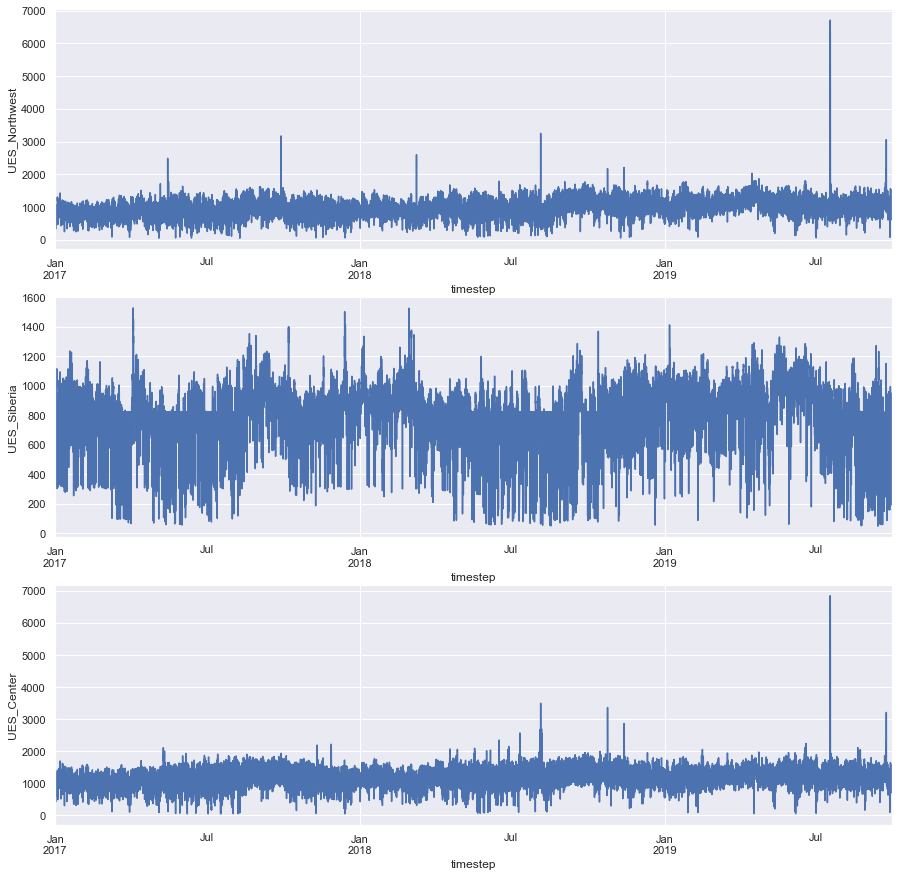

In [15]:
#time series plot for intraday_price
plt.figure(figsize = (15,15))

ax1 = plt.subplot(3, 1, 1)
intraday_price['UES_Northwest'].plot()
ax1.set_ylabel("UES_Northwest")

ax2 = plt.subplot(3, 1, 2)
intraday_price['UES_Siberia'].plot()
ax2.set_ylabel("UES_Siberia")

ax3 = plt.subplot(3, 1, 3)
intraday_price['UES_Center'].plot()
ax3.set_ylabel("UES_Center")


## THE PROPHET

In [16]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
from scipy import stats
import statsmodels.api as sm
import matplotlib.pyplot as plt

%matplotlib inline

### Modeling with `Prophet`

In [ ]:

#conda install -c conda-forge fbprophet

In [152]:
#Functions for weekly prediction

#import Prophet
from prophet import Prophet
import logging

logging.getLogger().setLevel(logging.ERROR)

#Functions to automate

#resample data by week
def resample_weekly(data):
    #data.reset_index(drop = True, inplace = True)
    #data["timestep"] = pd.to_datetime(data["timestep"])
    #data.drop("timestep", axis = 1)

    #Aggregate data
    global weekly_data 
    daily_data = data.groupby("timestep").mean()
    weekly_data = daily_data.resample("W").mean()
     
    return weekly_data

# Plot the weekly data
def plot_data(data):
    for col in data.columns:
        plt.figure(figsize=(17, 8))
        plt.plot(data[col])
        plt.xlabel('timestep')
        plt.ylabel(col)
        plt.title(f"Weekly Data for {col}")
        plt.grid(False)
        plt.show()
    


#Modeling

#Create single dataset & Change columns
def single_data(data):
    global wd_cons
    global lst
    lst = []
    for col in data:
        wd_con = pd.DataFrame(data[col], index = data.index)
        wd_cons = wd_con.reset_index()
        wd_cons.columns = ["ds", "y"]
        lst.append(wd_cons)

    return lst

#split into test train data (last 30 values), Train & Predict model

def split(lst):
    global my_model
    global fut
    global split_data
    fcst_size = 30
    split_data = []
    for dt in lst:
        data = dt.copy() 
        splited = data[: - fcst_size]
        split_data.append(splited)
        
    return split_data

def train_predict(split_data):
    global model_lst
    global forcast_lst
    global fcst_size
    fcst_size = 20
    forcast_lst = []
    model_lst = []
    for tr in split_data:
        my_model = Prophet().fit(tr)
        model_lst.append(my_model)
        fut = my_model.make_future_dataframe(periods = fcst_size, freq = "W")
        forcast = my_model.predict(fut)
        forcast_lst.append(forcast)
        
    return forcast_lst
    

#plot Prediction
def plot_prediction(pred_lst, weekly_data):
    for fcst, mod, col in zip(forcast_lst, model_lst, weekly_data):
        mod.plot(fcst)
        plt.title(f"Prediction plot for {col}")

#plot forcast components
def plot_pred_comp(pred_lst, weekly_data):
    for fcst, mod, col in zip(forcast_lst, model_lst, weekly_data):
        mod.plot_components(pd.DataFrame(fcst))
        plt.title(f"Prediction Components plot for {col}")

#evaluate Model
def evaluate(historical, predicted):
        eval_data = predicted.set_index("ds")[["yhat", "yhat_lower", "yhat_upper"]].join(historical.set_index("ds"))
        return eval_data 
    
    
#eval_data = evaluate(wd_cons, prediction)
#eval_data.head()

def pred_errors(df, prediction_size):
    #df = df.copy()
    
    df['e'] = df['y'] - df['yhat']
    df['p'] = 100 * df['e'] / df['y']
    
    predicted_part = df[- fcst_size:]
    
    error_mean = lambda error_name: np.mean(np.abs(predicted_part[error_name]))
    
    return {'MAPE': error_mean('p'), 'MAE': error_mean('e')}

#for err_name, err_value in pred_errors(eval_data, pred_size).items():
   # print(err_name, err_value)


"""# Plot forecast with upper and lower bounds
plt.figure(figsize=(17, 8))
plt.plot(eval_data['yhat'], label = "prediction")
plt.plot(eval_data['yhat_lower'], label = "pred_lower")
plt.plot(eval_data['yhat_upper'], label = "pred_high")
plt.plot(eval_data['y'], label = "Actual Value")
plt.xlabel('Timestep')
plt.ylabel(wd_con.columns.values)
plt.title(f"prediction for {wd_con.columns.values}")
plt.grid(False)
plt.legend()
plt.show()"""

#print Prediction table
def pred_table(data):
    table = pd.DataFrame(data, columns = ["y", "yhat", "yhat_lower", "yhat_upper"], index = data.index)
    return table.tail(fcst_size)

### Prediction for Weekly `UES_intraday_price`

In [153]:
UES_intraday_price.head()

,UES_Northwest,UES_Siberia,UES_Center
timestep,,,
2017-01-01 00:00:00,767.0,918.0,982.0
2017-01-01 01:00:00,675.0,889.0,848.0
2017-01-01 02:00:00,717.0,933.0,920.0
2017-01-01 03:00:00,683.0,947.0,885.0
2017-01-01 04:00:00,633.0,934.0,829.0


In [154]:
intraday_price = UES_intraday_price.copy()

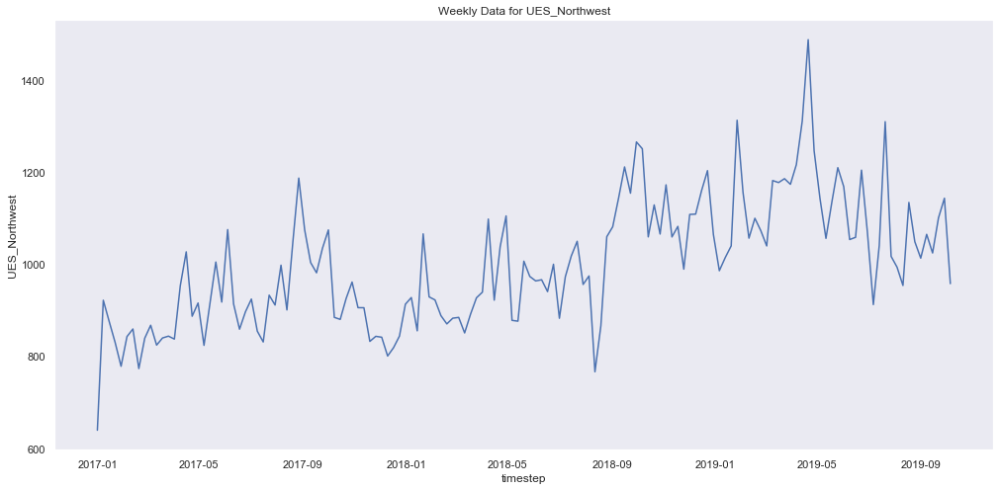

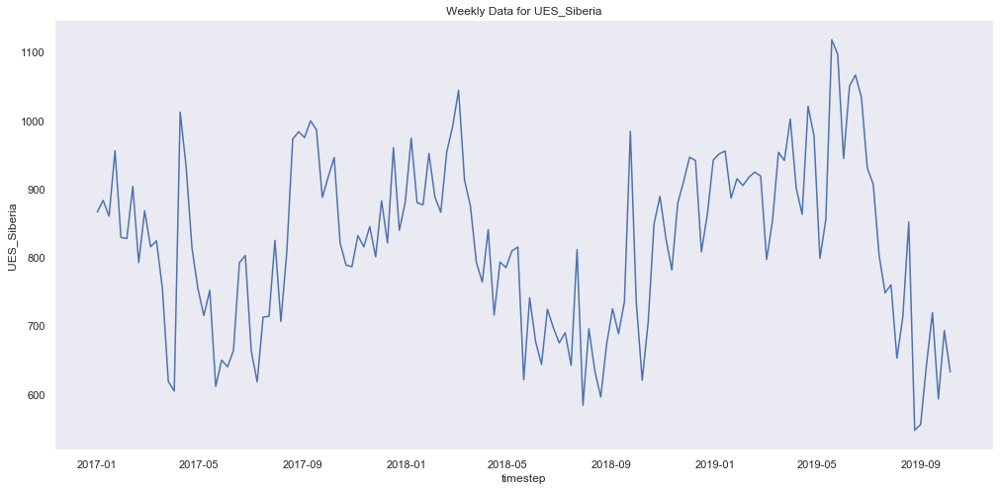

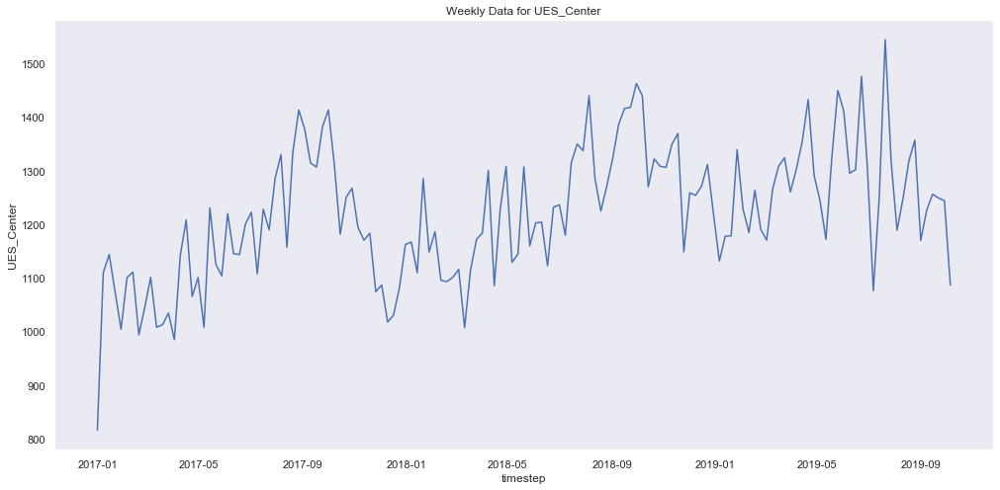

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


{'MAPE': 12.276490478427444, 'MAE': 130.9417322350809}
{'MAPE': 20.510998372689787, 'MAE': 199.48698996990132}
{'MAPE': 7.654771098306758, 'MAE': 98.53409197395203}


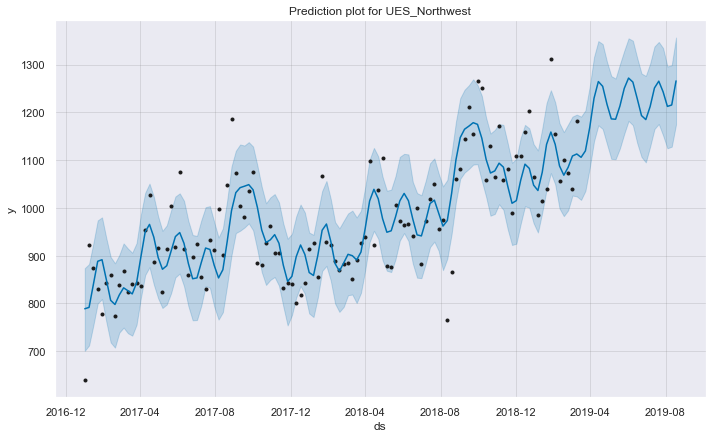

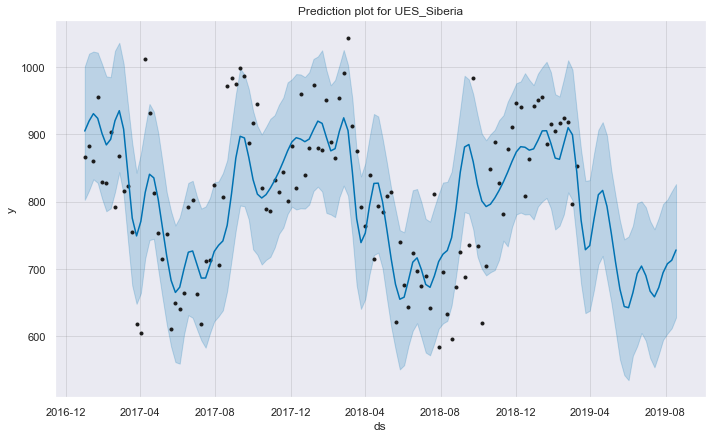

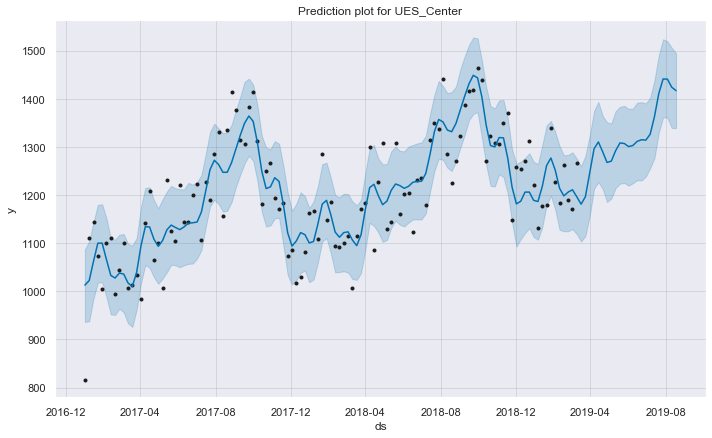

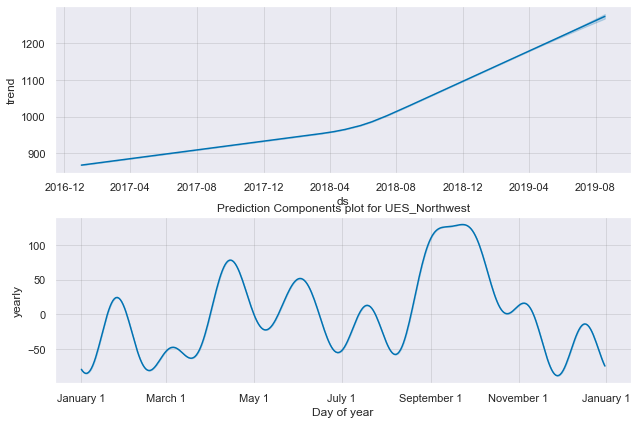

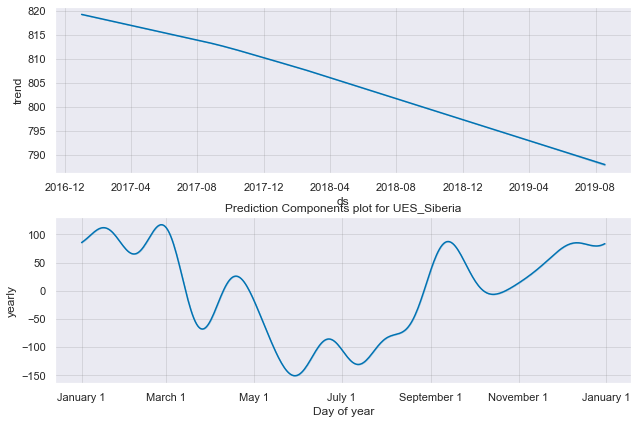

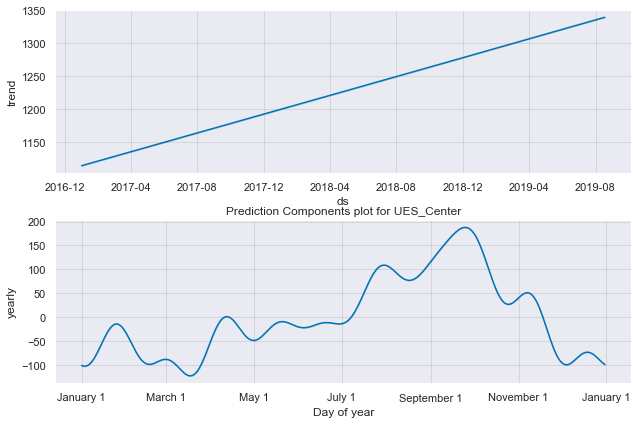

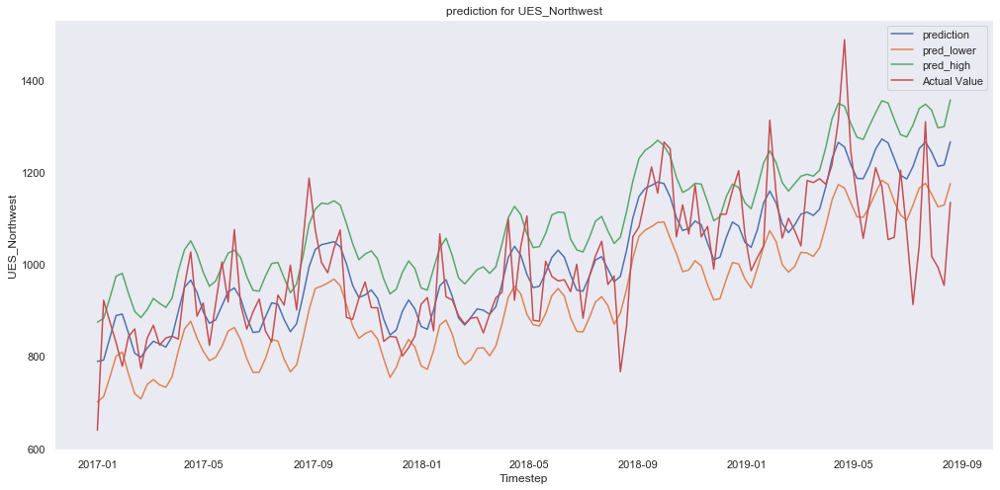

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-06-16  1058.253283  1228.961598  1135.734865  1313.902045
2019-06-23  1204.101190  1193.143213  1106.626268  1281.237740
2019-06-30  1068.827381  1184.809578  1095.271128  1276.096286
2019-07-07   912.165225  1212.125083  1128.323520  1301.913465
2019-07-14  1040.851190  1251.004377  1165.049902  1337.703844
2019-07-21  1309.351190  1265.192968  1175.580280  1347.318075
2019-07-28  1016.922619  1242.976420  1151.675361  1334.439207
2019-08-04   993.491378  1212.403675  1124.755150  1295.885459
2019-08-11   953.690476  1215.368659  1128.068123  1298.685135
2019-08-18  1133.991378  1265.745590  1174.761250  1356.542575


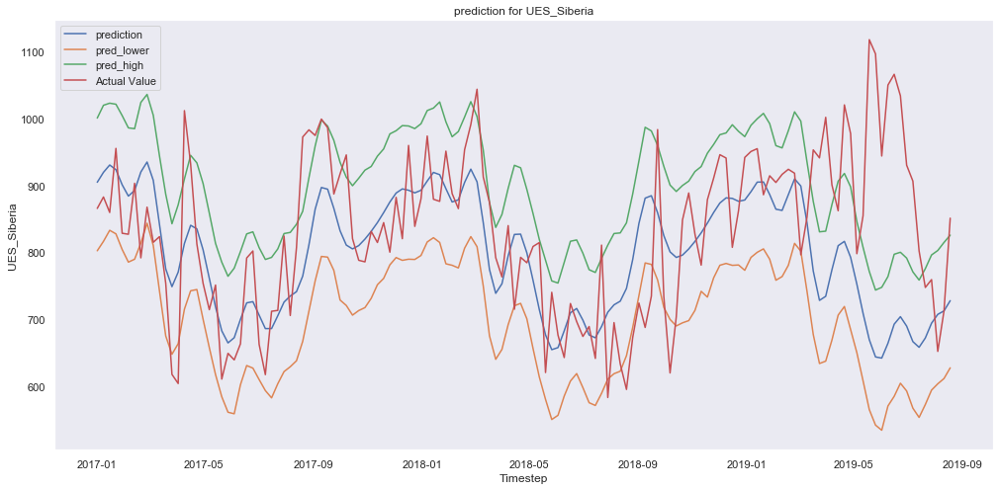

                      y        yhat  yhat_lower  yhat_upper
ds                                                         
2019-06-16  1065.970238  693.117323  585.417827  797.454415
2019-06-23  1033.898810  704.252682  604.939260  800.383348
2019-06-30   930.346176  690.184315  593.386434  791.695072
2019-07-07   906.604635  667.013235  567.729326  771.089147
2019-07-14   802.279762  658.580131  553.897573  758.883040
2019-07-21   747.882827  672.461515  573.156567  775.938813
2019-07-28   759.586778  694.537460  594.694655  796.383839
2019-08-04   652.435461  707.706801  604.066950  803.030556
2019-08-11   712.807954  712.887698  611.973776  815.050164
2019-08-18   851.261905  728.173905  627.949659  825.961971


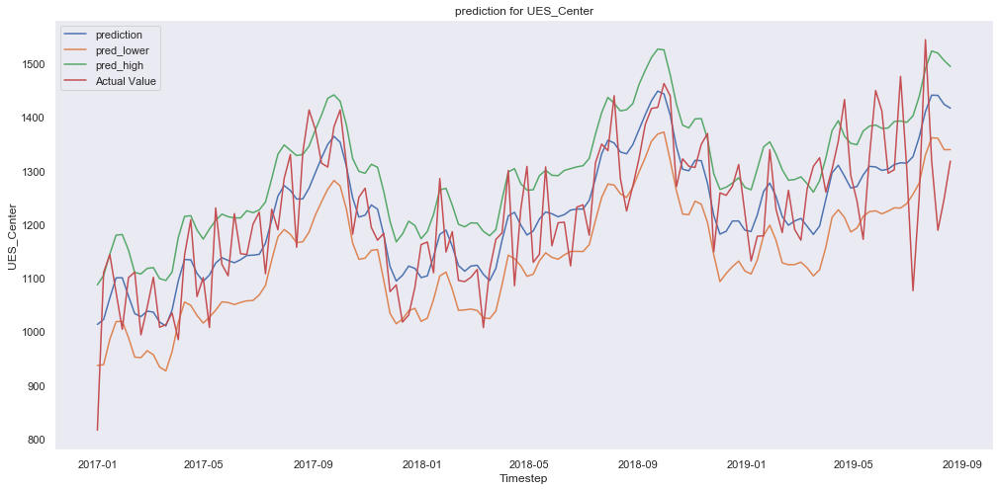

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-06-16  1301.917515  1311.436689  1230.645945  1391.785856
2019-06-23  1476.154762  1314.814600  1230.216483  1392.821906
2019-06-30  1304.005952  1313.981554  1238.482025  1390.129390
2019-07-07  1075.924316  1326.149262  1255.966365  1402.361040
2019-07-14  1251.279762  1362.820881  1276.869510  1438.617248
2019-07-21  1544.601190  1410.538246  1329.552653  1490.232642
2019-07-28  1317.958333  1441.034408  1361.492587  1523.466292
2019-08-04  1188.756801  1440.585668  1360.551503  1519.460192
2019-08-11  1247.517857  1423.843429  1339.175265  1505.691453
2019-08-18  1317.971086  1416.752104  1339.211344  1494.519753


In [155]:
# Merge all code in a single run

#resample to weekly data
resample_weekly(intraday_price)

#plot weekly_data
plot_data(weekly_data)

#split dataset into single data in a list
single_data(weekly_data) 

#split each dataset into individual datasets 
split(lst)

#train and predicts each dataset
train_predict(split_data)

#plot Prediction
plot_prediction(forcast_lst, weekly_data) 

#plot forcast components
plot_pred_comp(forcast_lst, weekly_data)    
    
#evaluate data
eval_data = list(map(lambda X: evaluate(X[0],X[1]), list(zip(lst, forcast_lst))))
eval_data
    
#calc prediction error
for it in eval_data:
    pred_error = pred_errors(it, fcst_size)
    print (pred_error)

# Plot forecast with upper and lower bounds
for data, col in zip(eval_data, weekly_data):      
    plt.figure(figsize=(17, 8))
    plt.plot(data['yhat'], label = "prediction")
    plt.plot(data['yhat_lower'], label = "pred_lower")
    plt.plot(data['yhat_upper'], label = "pred_high")
    plt.plot(data['y'], label = "Actual Value")
    plt.xlabel('Timestep')
    plt.ylabel(col)
    plt.title(f"prediction for {col}")
    plt.grid(False)
    plt.legend()
    plt.show() 
    print(pred_table(data).tail(10))

#print prediction table
#pred_table(eval_data)

### Prediction for Weekly `UES_dayahead_price`

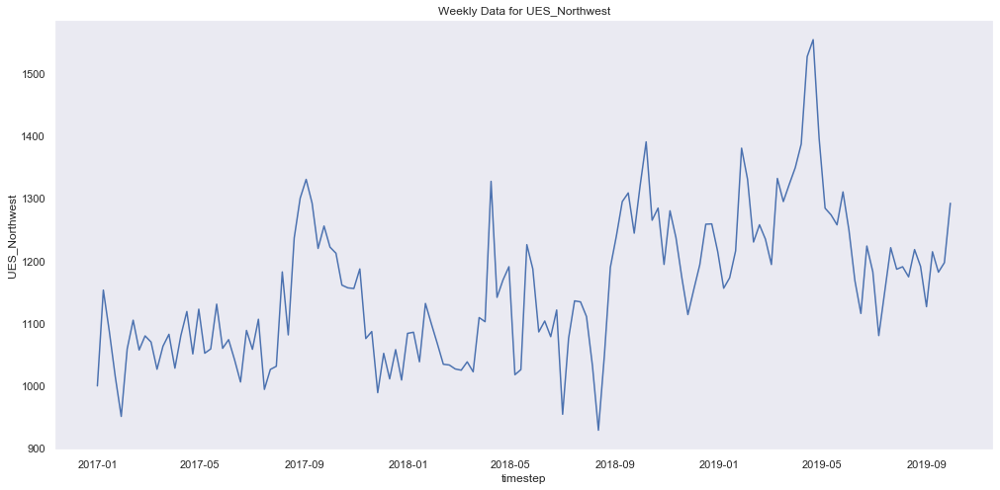

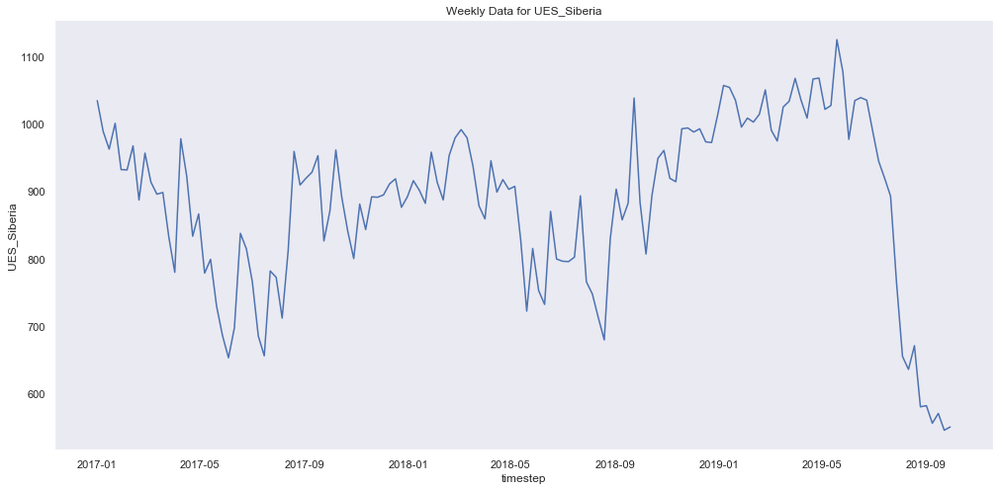

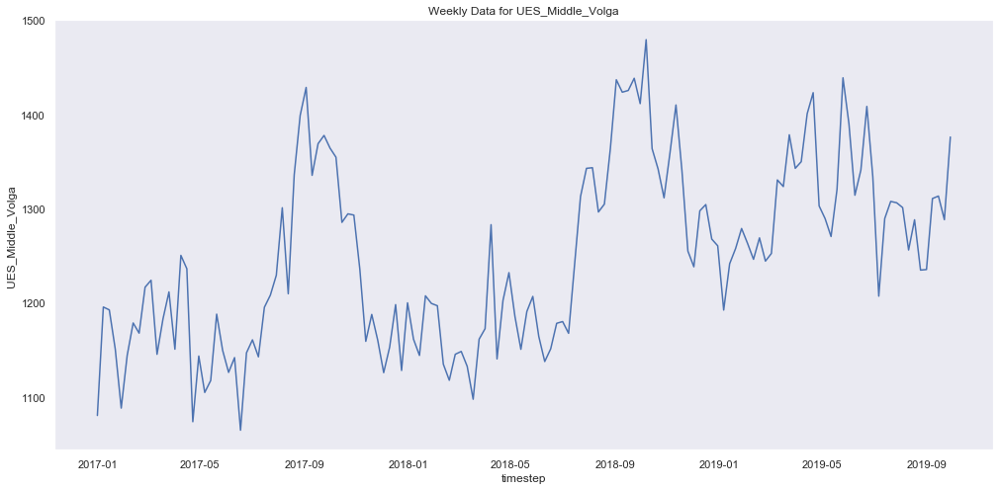

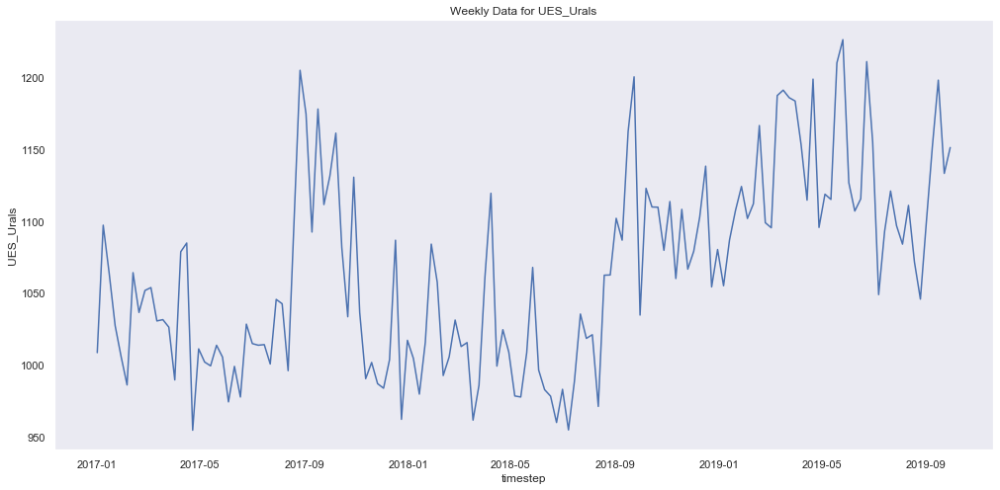

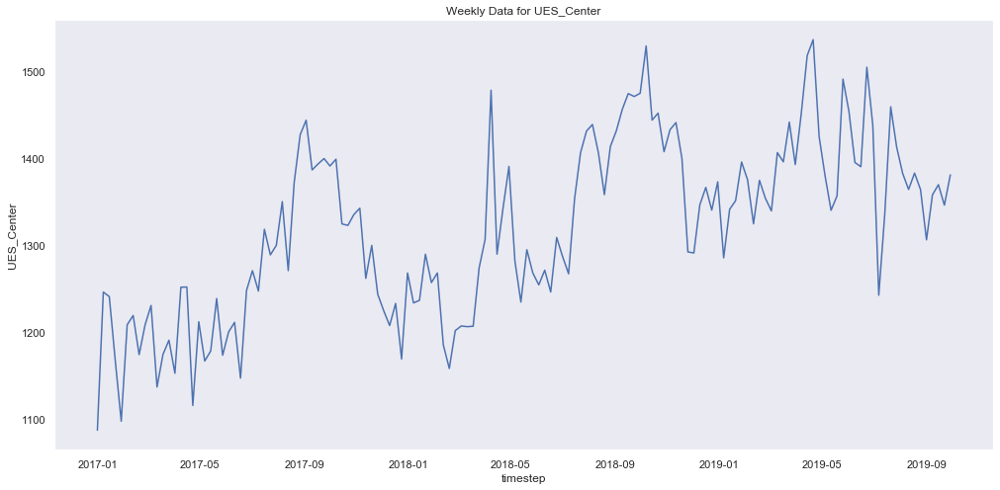

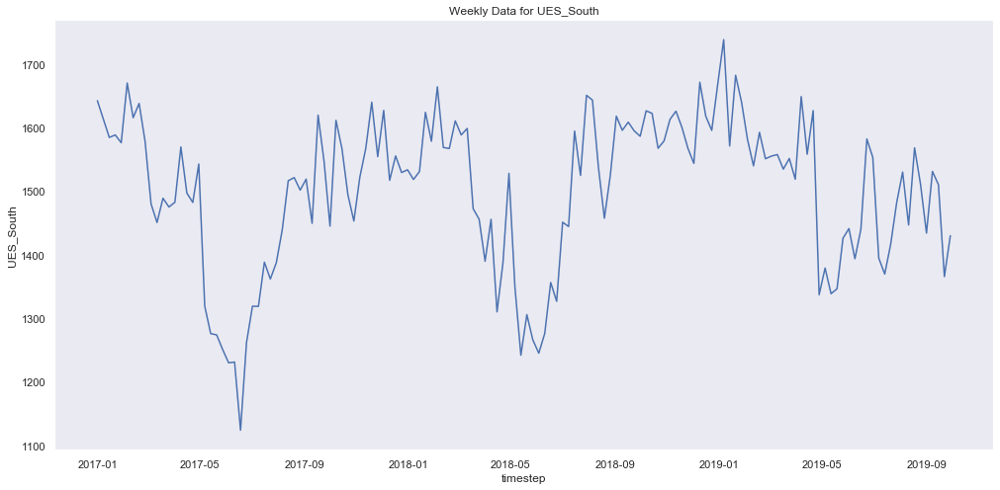

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to overr

{'MAPE': 8.216492180318738, 'MAE': 103.40022791341309}
{'MAPE': 12.539865594608779, 'MAE': 129.38053169374433}
{'MAPE': 5.420396522026096, 'MAE': 73.52266884289425}
{'MAPE': 4.359322336896482, 'MAE': 51.00113290226469}
{'MAPE': 4.545607241856617, 'MAE': 64.00921187374712}
{'MAPE': 6.333351765468669, 'MAE': 93.13669513627154}


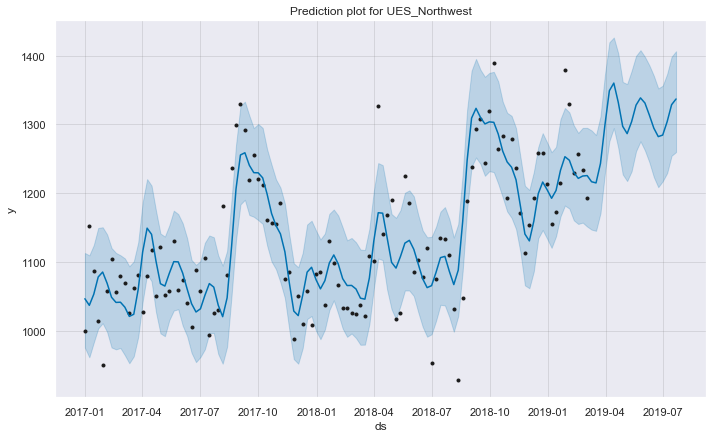

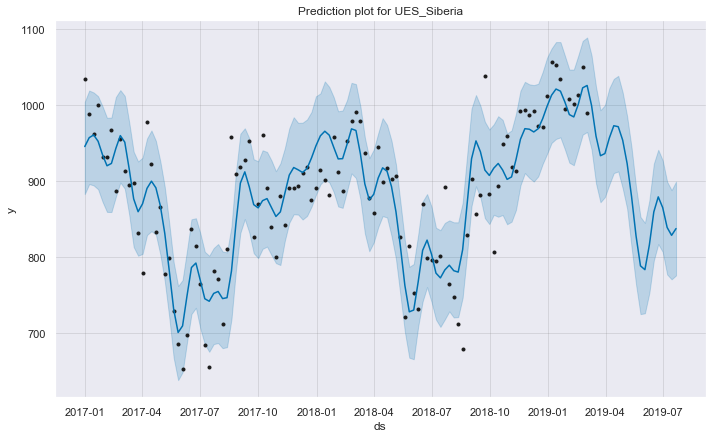

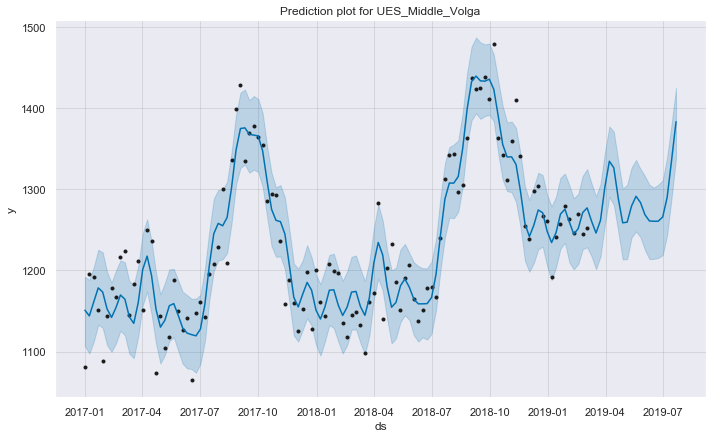

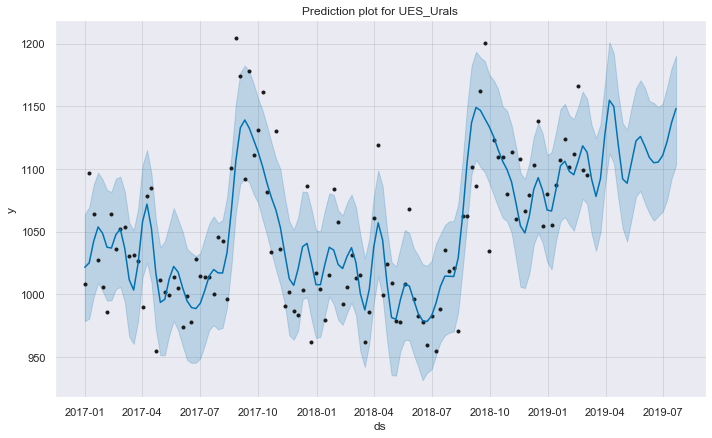

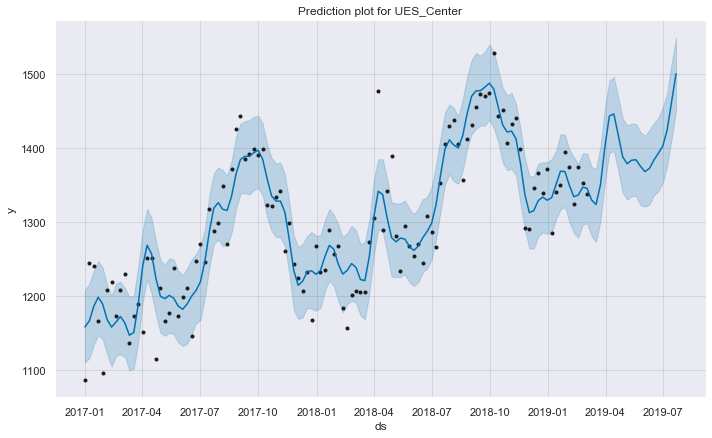

...

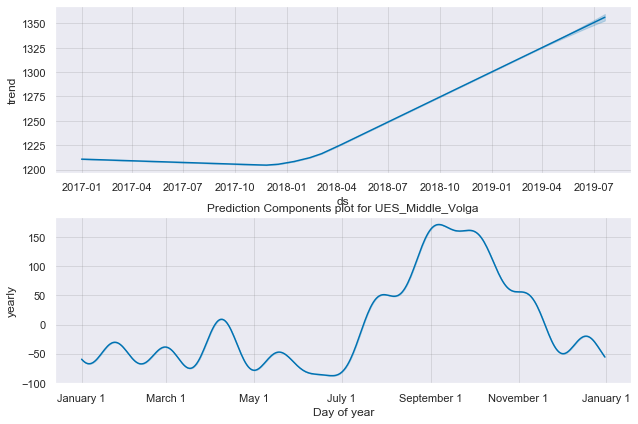

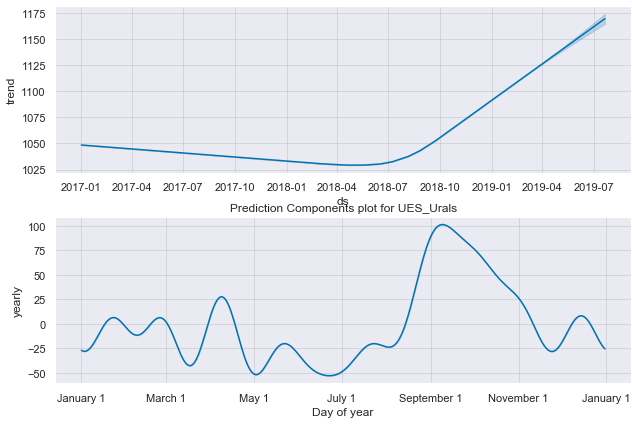

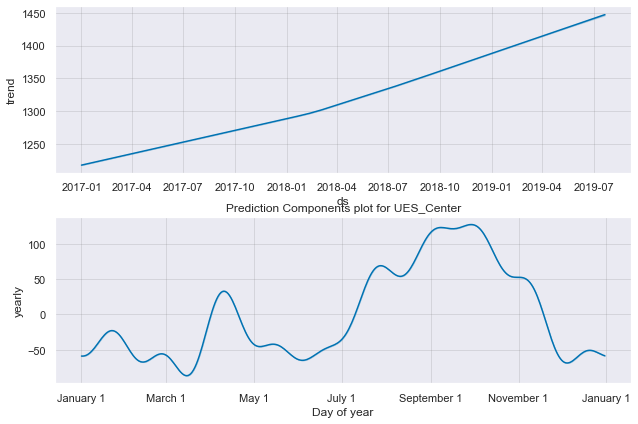

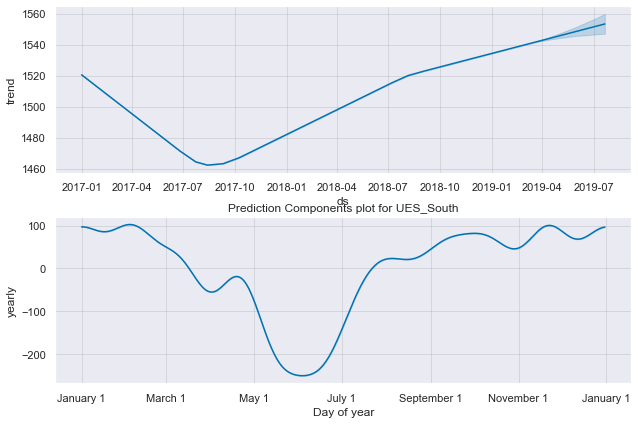

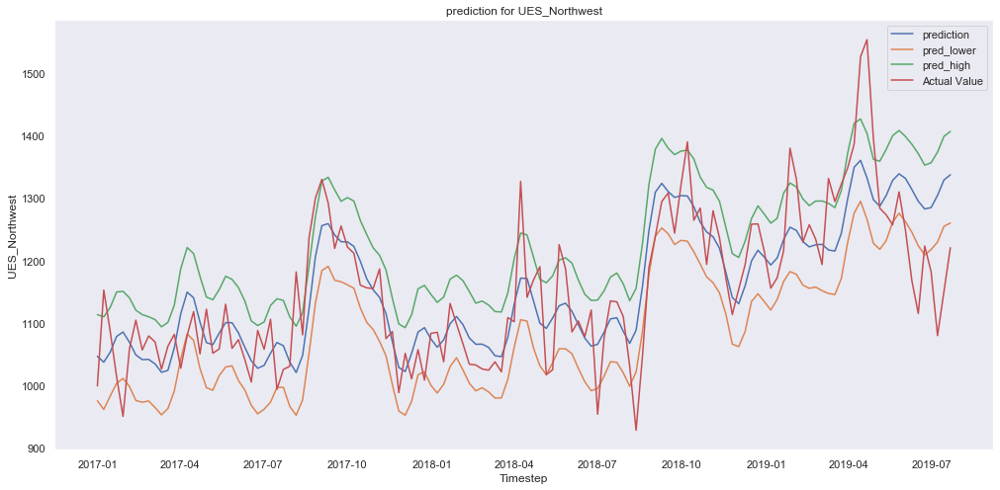

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-05-19  1257.003750  1328.146035  1261.108384  1399.689779
2019-05-26  1309.701310  1338.655428  1275.568962  1407.996011
2019-06-02  1248.559583  1331.217303  1262.278337  1398.338033
2019-06-09  1167.534881  1313.583287  1245.083374  1385.933099
2019-06-16  1115.149940  1294.734041  1223.561985  1370.884527
2019-06-23  1223.061488  1282.385785  1208.872380  1352.424156
2019-06-30  1181.916786  1284.613884  1217.481149  1356.320873
2019-07-07  1079.749226  1304.059265  1229.428424  1373.438089
2019-07-14  1149.973155  1328.764158  1254.619038  1398.434087
2019-07-21  1220.446667  1337.065552  1259.883382  1406.494177


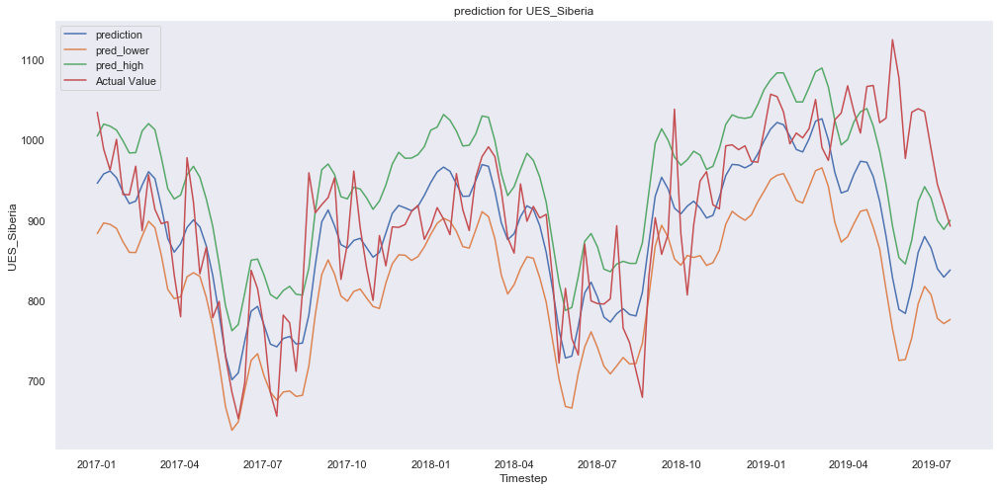

                      y        yhat  yhat_lower  yhat_upper
ds                                                         
2019-05-19  1124.400536  828.433206  764.509191  892.607732
2019-05-26  1076.868988  788.787857  725.337277  853.196723
2019-06-02   976.663750  783.789222  726.463947  845.302973
2019-06-09  1034.133274  816.299849  753.333000  874.881025
2019-06-16  1038.508869  859.745519  795.797130  923.063998
2019-06-23  1034.665119  879.523201  817.487359  941.476216
2019-06-30   988.866190  865.415581  807.225046  927.559153
2019-07-07   944.343333  839.312771  777.515892  899.440934
2019-07-14   919.135238  828.954444  771.099054  888.334187
2019-07-21   892.428869  837.841390  776.256948  899.619472


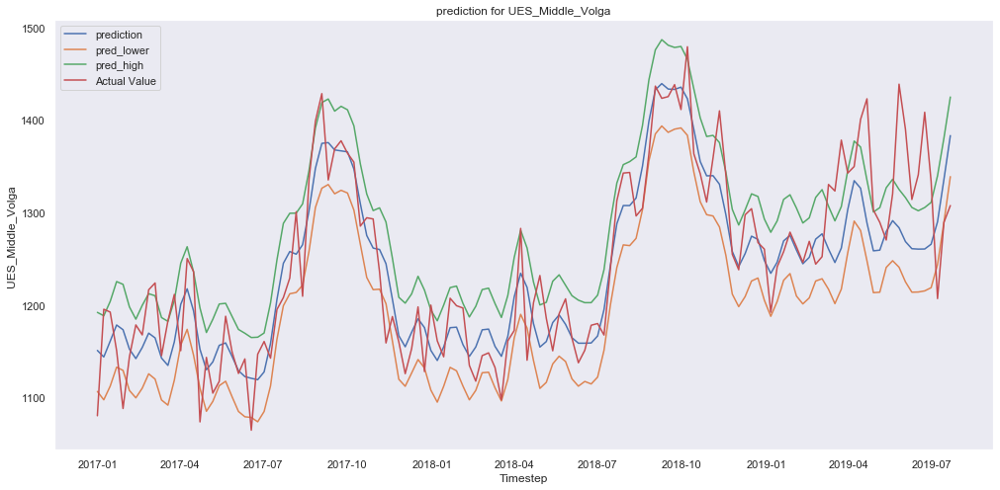

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-05-19  1320.432202  1291.392458  1248.073746  1336.086687
2019-05-26  1438.896071  1283.718491  1241.043104  1325.084189
2019-06-02  1390.080655  1268.729658  1225.200325  1316.318748
2019-06-09  1314.243214  1261.057133  1214.035317  1305.649280
2019-06-16  1340.981607  1260.607804  1214.244052  1302.067765
2019-06-23  1408.521607  1260.729801  1215.459860  1305.552213
2019-06-30  1333.931012  1265.897262  1218.925891  1311.091312
2019-07-07  1207.134821  1290.157988  1243.795461  1339.853285
2019-07-14  1289.538988  1335.987062  1289.585905  1380.706453
2019-07-21  1307.683512  1383.315408  1338.967028  1425.037020


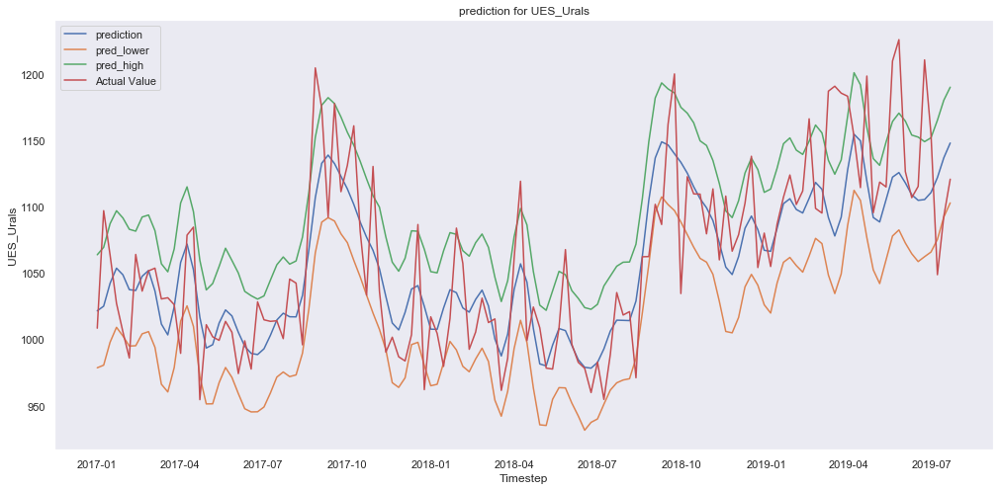

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-05-19  1209.906786  1122.359254  1077.992069  1164.329513
2019-05-26  1226.062083  1125.843243  1082.561309  1170.640955
2019-06-02  1126.613810  1118.053132  1072.688735  1164.647265
2019-06-09  1106.907917  1109.093900  1064.609929  1154.097601
2019-06-16  1115.410238  1104.881386  1058.695004  1152.585972
2019-06-23  1210.801845  1105.463412  1062.387503  1149.127449
2019-06-30  1154.867976  1110.756621  1065.887924  1152.039223
2019-07-07  1048.803869  1122.028949  1075.392442  1165.253543
2019-07-14  1092.824107  1136.969486  1092.265460  1180.404318
2019-07-21  1120.833929  1148.112610  1102.956349  1190.223211


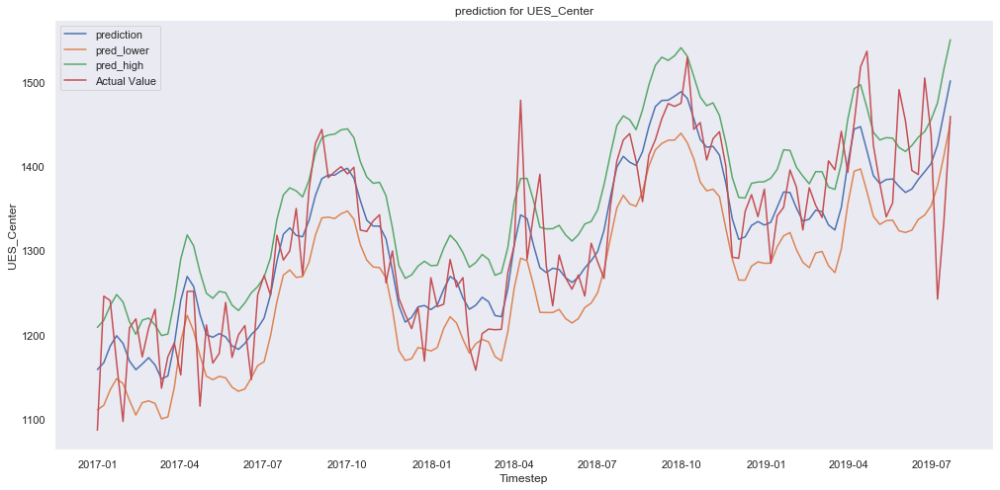

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-05-19  1356.246905  1384.648548  1335.806756  1433.141641
2019-05-26  1490.801905  1375.823602  1323.162617  1422.034872
2019-06-02  1453.618452  1368.660884  1321.199194  1417.278374
2019-06-09  1394.789881  1372.827840  1323.972813  1424.412883
2019-06-16  1389.940536  1384.039819  1336.652000  1434.232826
2019-06-23  1504.510060  1393.286067  1341.850333  1440.904354
2019-06-30  1437.514167  1402.906665  1352.942859  1455.096371
2019-07-07  1242.003988  1425.094655  1376.550602  1475.024540
2019-07-14  1334.954048  1463.155764  1412.569809  1515.122988
2019-07-21  1458.978333  1501.141958  1451.650430  1549.988378


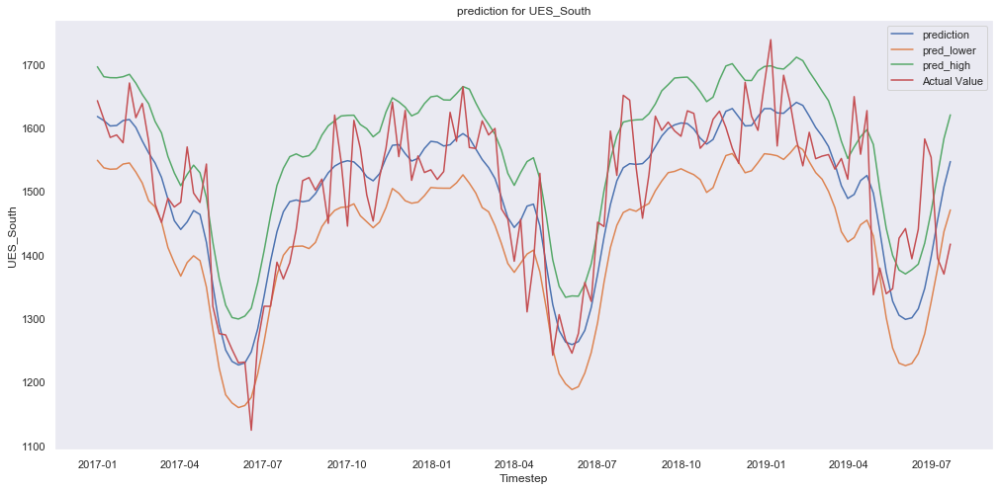

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-05-19  1346.439286  1326.919934  1253.233438  1399.071525
2019-05-26  1425.932976  1304.768310  1229.472022  1375.892304
2019-06-02  1441.119464  1298.323474  1225.601659  1369.782955
2019-06-09  1393.593036  1300.811964  1229.006992  1376.484553
2019-06-16  1439.985774  1314.944518  1244.430994  1385.154991
2019-06-23  1582.022057  1346.936064  1275.701792  1418.275945
2019-06-30  1553.085471  1396.391078  1325.527766  1467.645509
2019-07-07  1394.626350  1453.872948  1377.993415  1524.767986
2019-07-14  1369.547500  1506.900525  1436.215765  1582.535613
2019-07-21  1416.737381  1546.551781  1470.418927  1620.002263


In [102]:
# Merge all code in a single run

#resample to weekly data
resample_weekly(UES_dayahead_price)

#plot weekly_data
plot_data(weekly_data)

#split dataset into single data in a list
single_data(weekly_data) 

#split each dataset into individual datasets 
split(lst)

#train and predicts each dataset
train_predict(split_data)

#plot Prediction
plot_prediction(forcast_lst, weekly_data) 

#plot forcast components
plot_pred_comp(forcast_lst, weekly_data)    
    
#evaluate data
eval_data = list(map(lambda X: evaluate(X[0],X[1]), list(zip(lst, forcast_lst))))
eval_data
    
#calc prediction error
for it in eval_data:
    pred_error = pred_errors(it, fcst_size)
    print(pred_error)

# Plot forecast with upper and lower bounds
for data, col in zip(eval_data, weekly_data):      
    plt.figure(figsize=(17, 8))
    plt.plot(data['yhat'], label = "prediction")
    plt.plot(data['yhat_lower'], label = "pred_lower")
    plt.plot(data['yhat_upper'], label = "pred_high")
    plt.plot(data['y'], label = "Actual Value")
    plt.xlabel('Timestep')
    plt.ylabel(col)
    plt.title(f"prediction for {col}")
    plt.grid(False)
    plt.legend()
    plt.show()
    print(pred_table(data).tail(10))


### Prediction for Weekly `PZ_dayahead_price_volume`

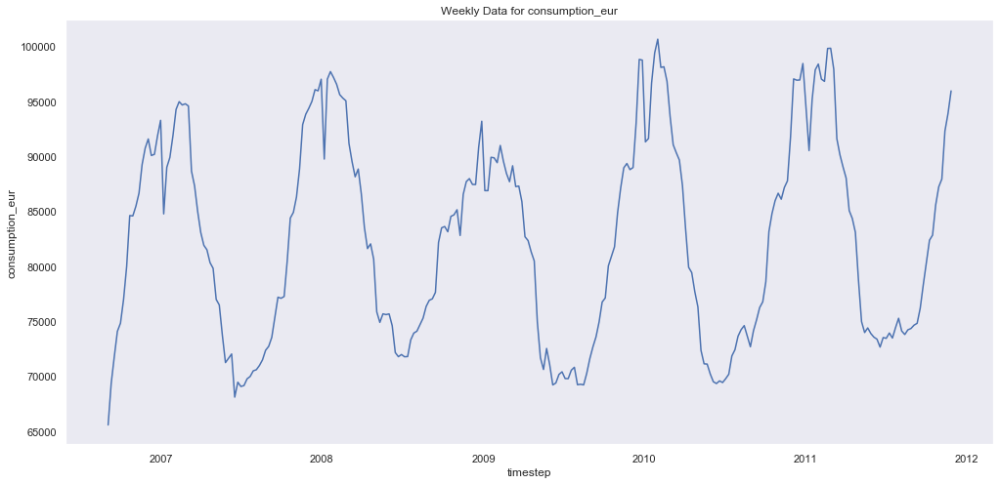

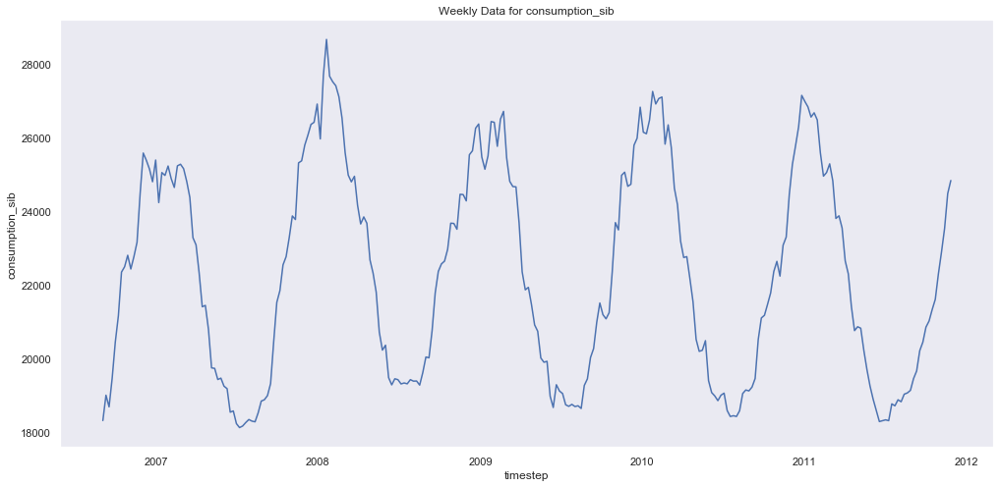

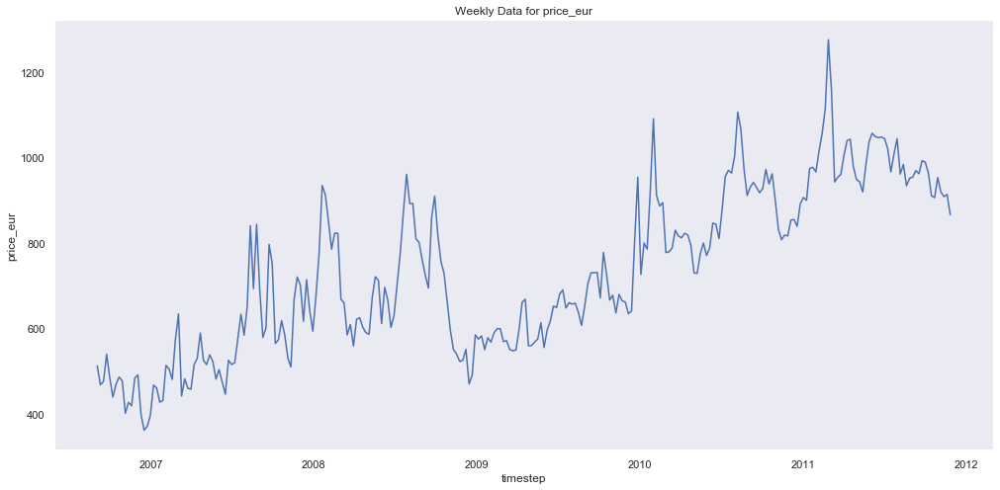

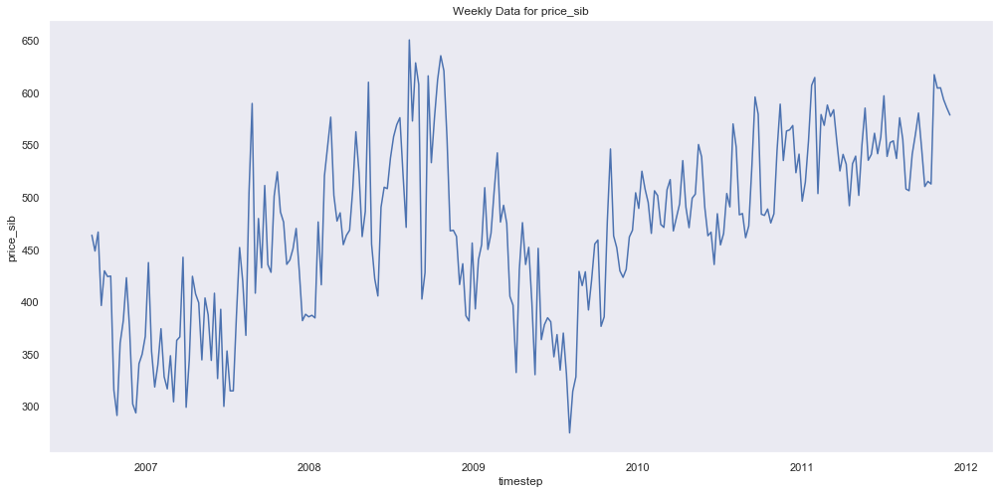

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


{'MAPE': 1.8932597176731956, 'MAE': 1409.212282284991}
{'MAPE': 2.075248902273544, 'MAE': 399.4745931798958}
{'MAPE': 12.725015386176604, 'MAE': 124.04210675923446}
{'MAPE': 6.522074084128914, 'MAE': 35.48151816246488}


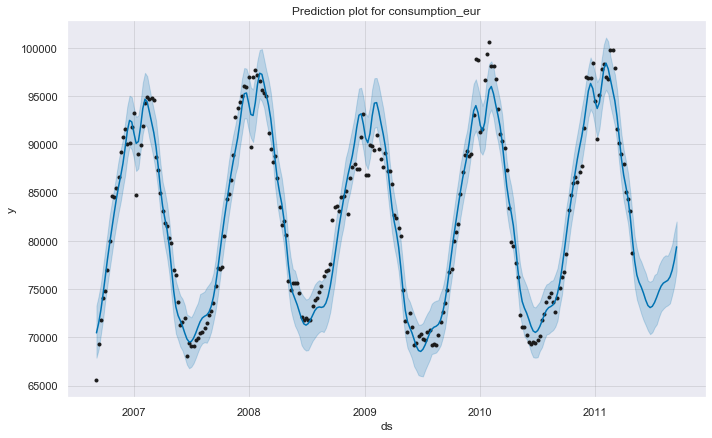

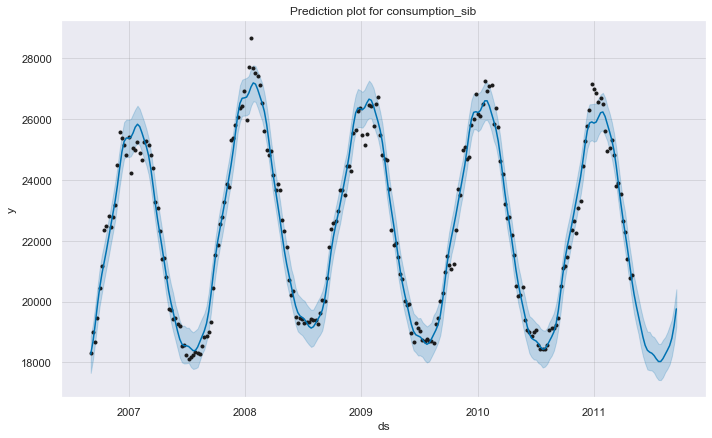

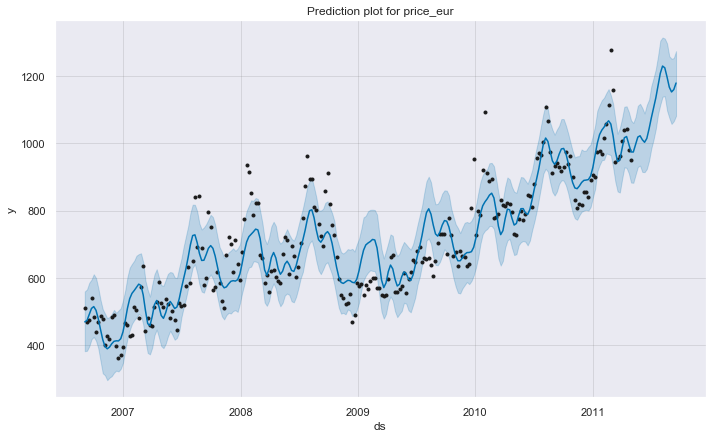

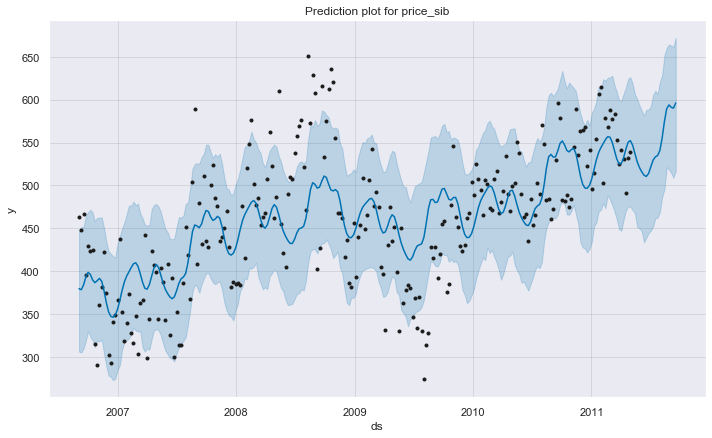

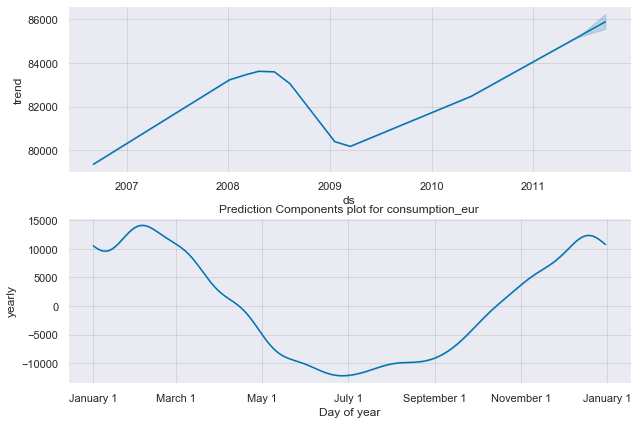

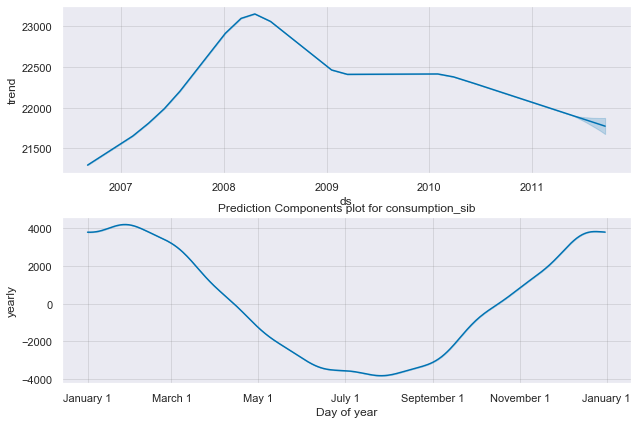

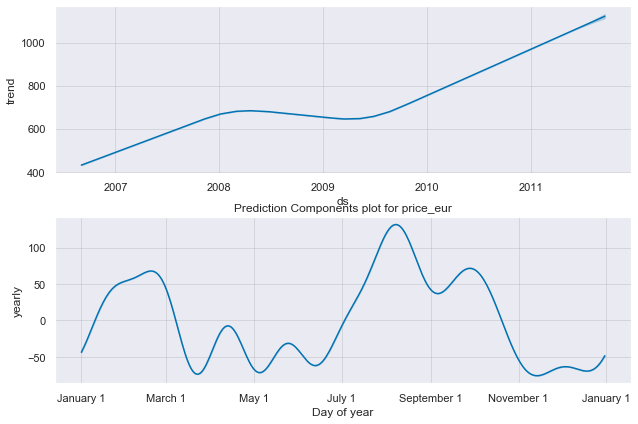

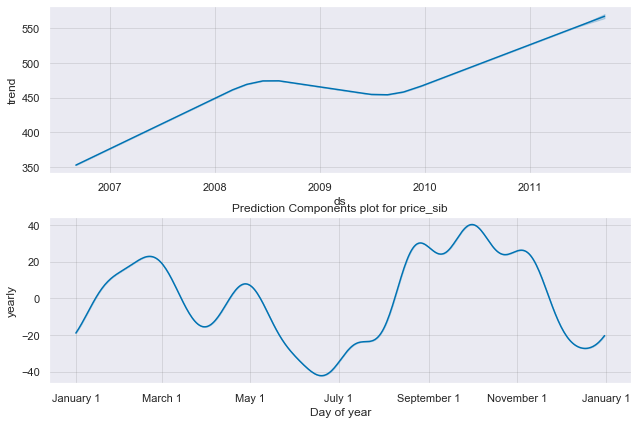

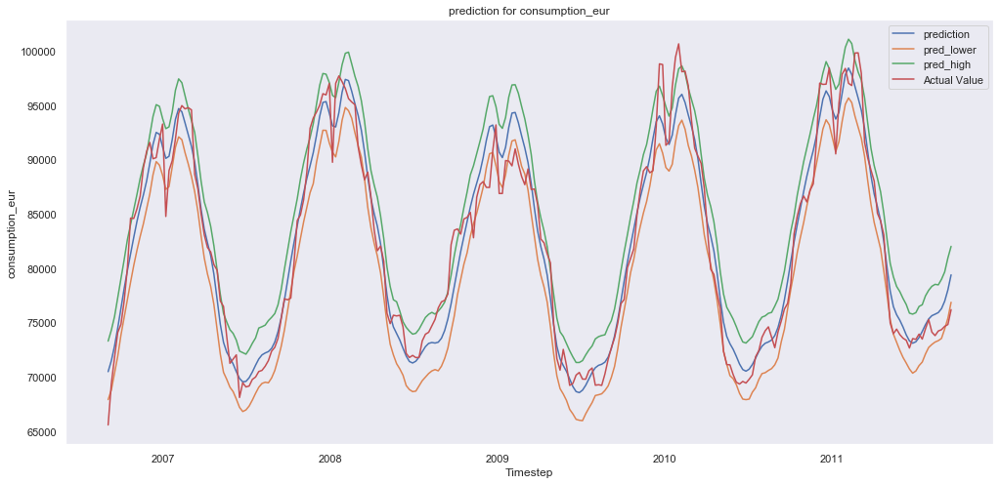

                       y          yhat    yhat_lower    yhat_upper
ds                                                                
2011-07-17  73458.000000  74165.173563  71344.450656  76621.790956
2011-07-24  74400.672619  74784.857084  72085.740027  77437.337022
2011-07-31  75256.202381  75306.221783  72688.599876  77949.009683
2011-08-07  74102.410714  75615.072737  72965.344050  78319.144812
2011-08-14  73778.934524  75750.815769  73184.975430  78499.916648
2011-08-21  74202.922619  75899.246828  73313.114876  78451.302577
2011-08-28  74325.565476  76261.962208  73518.391759  78959.267956
2011-09-04  74630.160714  76949.125118  74395.445603  79643.018112
2011-09-11  74796.690476  77988.478522  75384.172256  80931.254222
2011-09-18  76169.023810  79375.186498  76848.691650  81997.234574


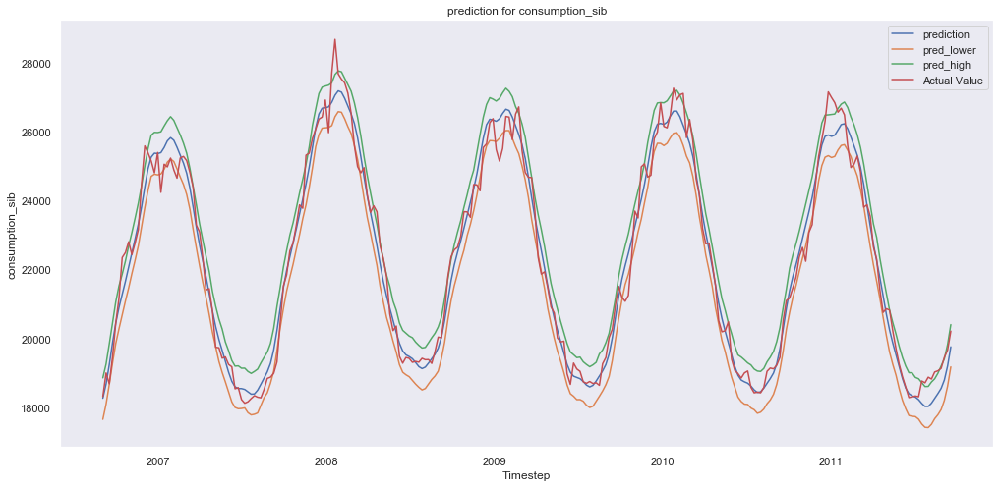

                       y          yhat    yhat_lower    yhat_upper
ds                                                                
2011-07-17  18768.011905  18116.490869  17519.860506  18721.450732
2011-07-24  18714.940476  18029.450686  17424.094569  18606.818003
2011-07-31  18879.160714  18029.796781  17415.936350  18610.825551
2011-08-07  18825.648810  18124.718762  17511.739095  18738.580007
2011-08-14  19030.904762  18264.757888  17674.274790  18832.024967
2011-08-21  19064.375000  18402.498628  17788.271661  18992.252846
2011-08-28  19134.898810  18553.625563  17938.274194  19199.418454
2011-09-04  19453.773810  18796.450166  18205.307973  19412.187331
2011-09-11  19662.053571  19202.343034  18617.682001  19828.529922
2011-09-18  20215.107143  19759.335333  19177.625406  20404.372176


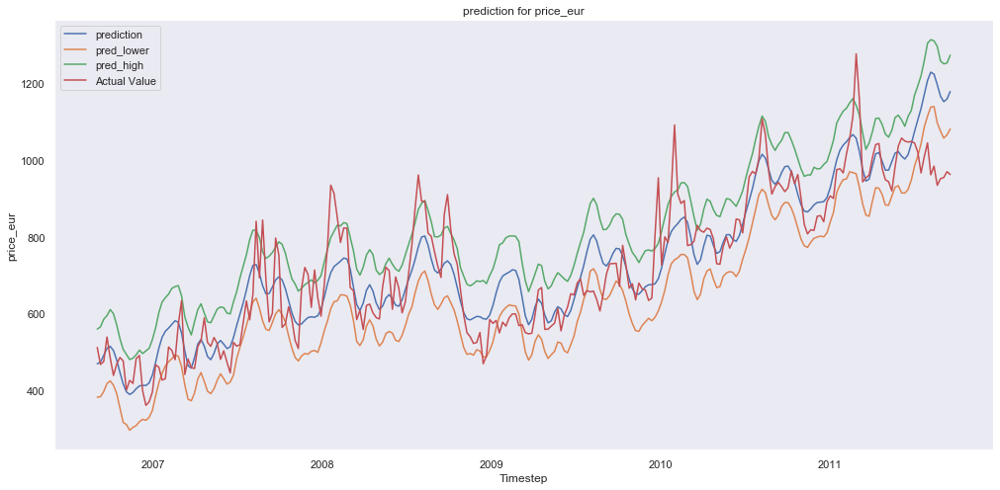

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2011-07-17   966.566905  1134.170674  1042.302151  1219.362892
2011-07-24  1008.975417  1170.498184  1086.226056  1258.499666
2011-07-31  1044.716905  1207.290001  1114.409167  1304.334183
2011-08-07   961.611250  1228.862048  1137.774104  1313.497786
2011-08-14   984.167798  1223.628371  1139.283232  1310.408712
2011-08-21   934.179940  1196.437614  1097.021472  1295.915435
2011-08-28   951.634583  1166.306760  1075.403180  1258.008446
2011-09-04   954.461071  1151.980635  1057.104840  1250.397596
2011-09-11   969.791905  1158.990309  1065.440172  1252.533643
2011-09-18   962.388095  1178.453633  1080.950566  1273.072411


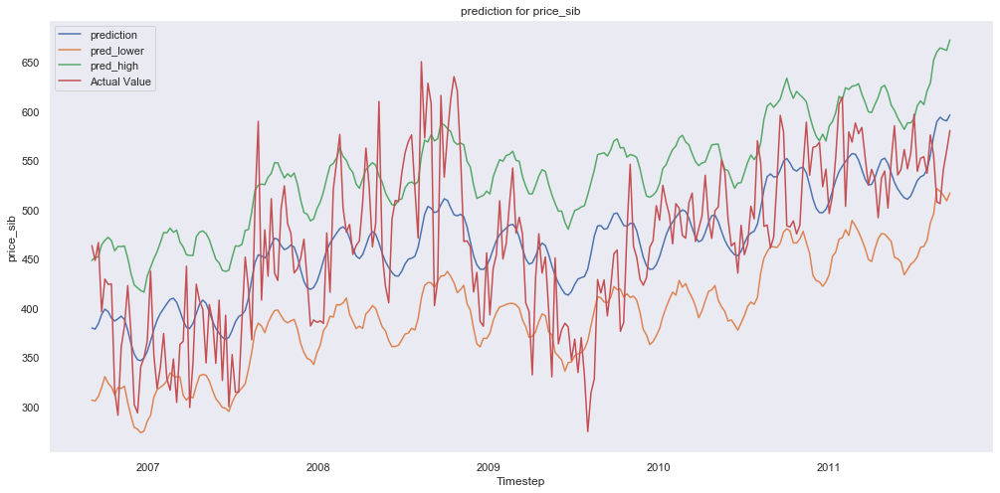

                     y        yhat  yhat_lower  yhat_upper
ds                                                        
2011-07-17  552.067679  533.220675  461.755291  610.361739
2011-07-24  553.651369  534.841412  462.371018  606.517381
2011-07-31  536.746548  540.722477  468.947950  620.635978
2011-08-07  575.741548  555.175469  486.529051  628.329004
2011-08-14  555.147500  574.483175  495.312283  651.793022
2011-08-21  507.671429  589.330532  521.142110  660.147832
2011-08-28  505.976964  593.733457  518.544468  664.166200
2011-09-04  540.851488  591.011761  514.393049  662.854436
2011-09-11  559.541071  590.102960  508.829666  661.646593
2011-09-18  580.292500  596.069993  516.812050  672.307538


In [103]:
# Merge all code in a single run

#resample to weekly data
resample_weekly(PZ_dayahead_price_volume)

#plot weekly_data
plot_data(weekly_data)

#split dataset into single data in a list
single_data(weekly_data) 

#split each dataset into individual datasets 
split(lst)

#train and predicts each dataset
train_predict(split_data)

#plot Prediction
plot_prediction(forcast_lst, weekly_data) 

#plot forcast components
plot_pred_comp(forcast_lst, weekly_data)    
    
#evaluate data
eval_data = list(map(lambda X: evaluate(X[0],X[1]), list(zip(lst, forcast_lst))))
eval_data
    
#calc prediction error
for it in eval_data:
    pred_error = pred_errors(it, fcst_size)
    print(pred_error)

# Plot forecast with upper and lower bounds
for data, col in zip(eval_data, weekly_data):      
    plt.figure(figsize=(17, 8))
    plt.plot(data['yhat'], label = "prediction")
    plt.plot(data['yhat_lower'], label = "pred_lower")
    plt.plot(data['yhat_upper'], label = "pred_high")
    plt.plot(data['y'], label = "Actual Value")
    plt.xlabel('Timestep')
    plt.ylabel(col)
    plt.title(f"prediction for {col}")
    plt.grid(False)
    plt.legend()
    plt.show()
    print(pred_table(data).tail(10))


### Functions for Daily Prediction

In [108]:
#Functions for DAILY prediction

#import Prophet
from prophet import Prophet
import logging

logging.getLogger().setLevel(logging.ERROR)

#Functions to automate

#resample data by day
def resample_daily(data):
    
    #Aggregate data
    global daily_data 
    daily_data = data.groupby("timestep").mean()
    daily_data = daily_data.resample("D").mean()
     
    return daily_data

# Plot the daily data
def plot_data(data):
    for col in data.columns:
        plt.figure(figsize=(17, 8))
        plt.plot(data[col])
        plt.xlabel('timestep')
        plt.ylabel(col)
        plt.title(f"Weekly Data for {col}")
        plt.grid(False)
        plt.show()
    


#Modeling

#Create single dataset & Change columns
def single_data(data):
    global wd_cons
    global lst
    lst = []
    for col in data:
        wd_con = pd.DataFrame(data[col], index = data.index)
        wd_cons = wd_con.reset_index()
        wd_cons.columns = ["ds", "y"]
        lst.append(wd_cons)

    return lst

#split into test train data (last 30 values), Train & Predict model

def split(lst):
    global my_model
    global fut
    global split_data
    fcst_size = 30
    split_data = []
    for dt in lst:
        data = dt.copy() 
        splited = data[: - fcst_size]
        split_data.append(splited)
        
    return split_data

def train_predict(split_data):
    global model_lst
    global forcast_lst
    global fcst_size
    fcst_size = 30
    forcast_lst = []
    model_lst = []
    for tr in split_data:
        my_model = Prophet().fit(tr)
        model_lst.append(my_model)
        fut = my_model.make_future_dataframe(periods = fcst_size, freq = "D")
        forcast = my_model.predict(fut)
        forcast_lst.append(forcast)
        
    return forcast_lst
    

#plot Prediction
def plot_prediction(pred_lst, daily_data):
    for fcst, mod, col in zip(forcast_lst, model_lst, daily_data):
        mod.plot(fcst)
        plt.title(f"Prediction plot for {col}")

#plot forcast components
def plot_pred_comp(pred_lst, daily_data):
    for fcst, mod, col in zip(forcast_lst, model_lst, daily_data):
        mod.plot_components(pd.DataFrame(fcst))
        plt.title(f"Prediction Components plot for {col}")

#evaluate Model
def evaluate(historical, predicted):
        eval_data = predicted.set_index("ds")[["yhat", "yhat_lower", "yhat_upper"]].join(historical.set_index("ds"))
        return eval_data 
    
    
#eval_data = evaluate(wd_cons, prediction)
#eval_data.head()

def pred_errors(df, prediction_size):
    #df = df.copy()
    
    df['e'] = df['y'] - df['yhat']
    df['p'] = 100 * df['e'] / df['y']
    
    predicted_part = df[- fcst_size:]
    
    error_mean = lambda error_name: np.mean(np.abs(predicted_part[error_name]))
    
    return {'MAPE': error_mean('p'), 'MAE': error_mean('e')}

#for err_name, err_value in pred_errors(eval_data, pred_size).items():
   # print(err_name, err_value)


"""# Plot forecast with upper and lower bounds
plt.figure(figsize=(17, 8))
plt.plot(eval_data['yhat'], label = "prediction")
plt.plot(eval_data['yhat_lower'], label = "pred_lower")
plt.plot(eval_data['yhat_upper'], label = "pred_high")
plt.plot(eval_data['y'], label = "Actual Value")
plt.xlabel('Timestep')
plt.ylabel(wd_con.columns.values)
plt.title(f"prediction for {wd_con.columns.values}")
plt.grid(False)
plt.legend()
plt.show()"""

#print Prediction table
def pred_table(data):
    table = pd.DataFrame(data, columns = ["y", "yhat", "yhat_lower", "yhat_upper"], index = data.index)
    return table.tail(fcst_size)

### Prediction for Daily `UES_intraday_price`

In [105]:
daily_intraday = UES_intraday_price.copy()

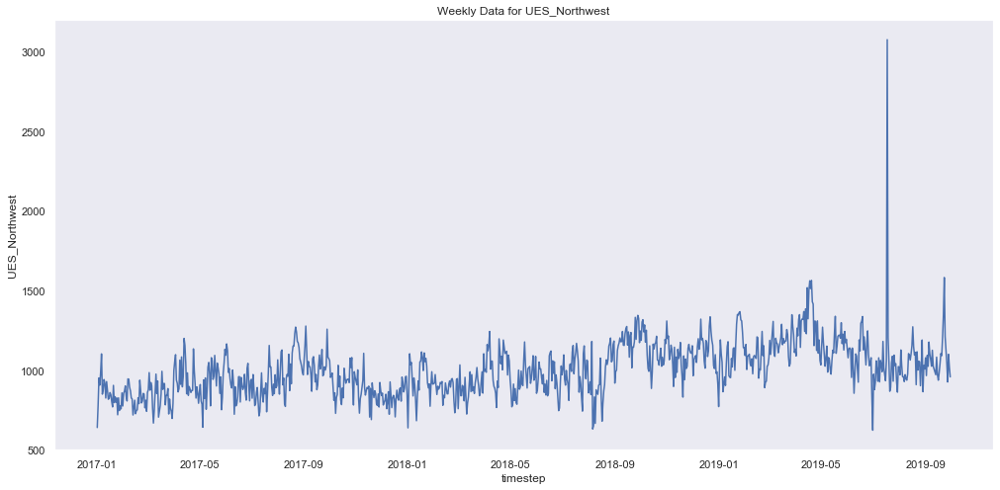

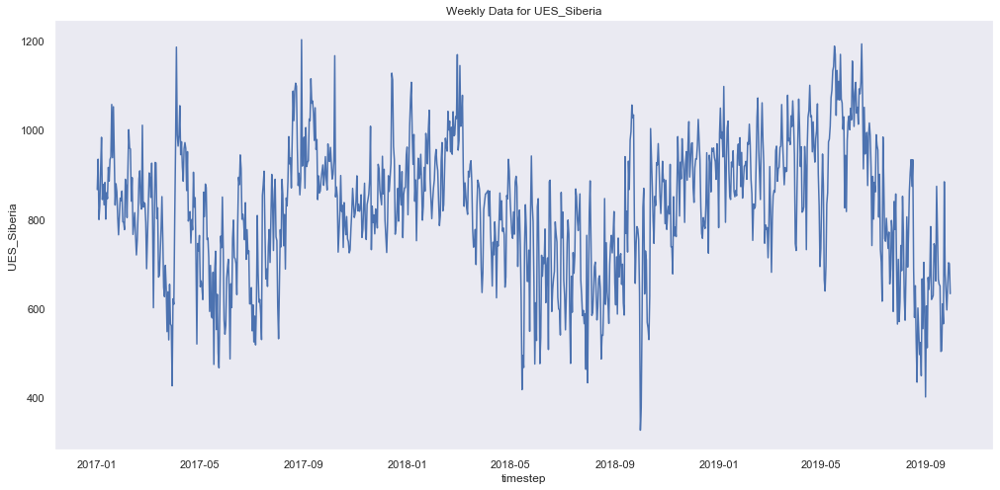

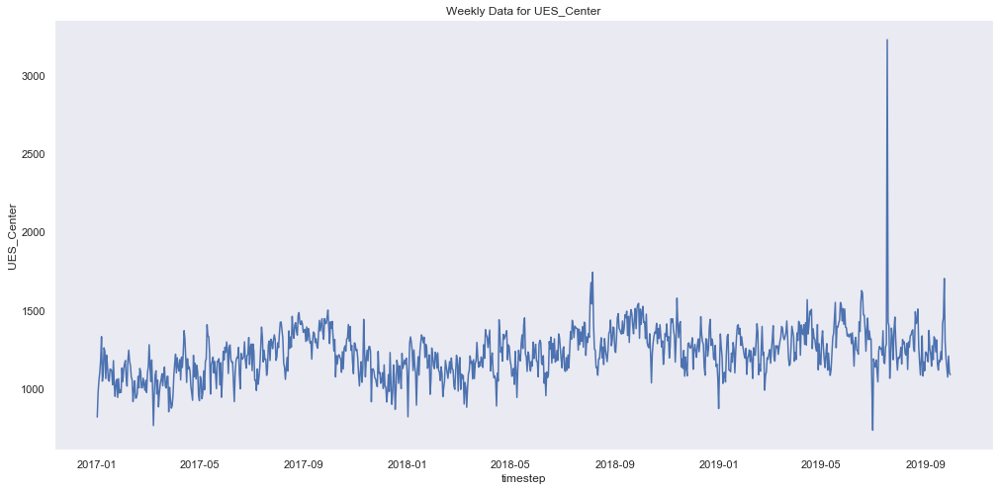

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


{'MAPE': 13.203803617742013, 'MAE': 139.96164157925378}
{'MAPE': 53.949641863071164, 'MAE': 329.8710004718218}
{'MAPE': 16.283858055810047, 'MAE': 195.0311819118071}


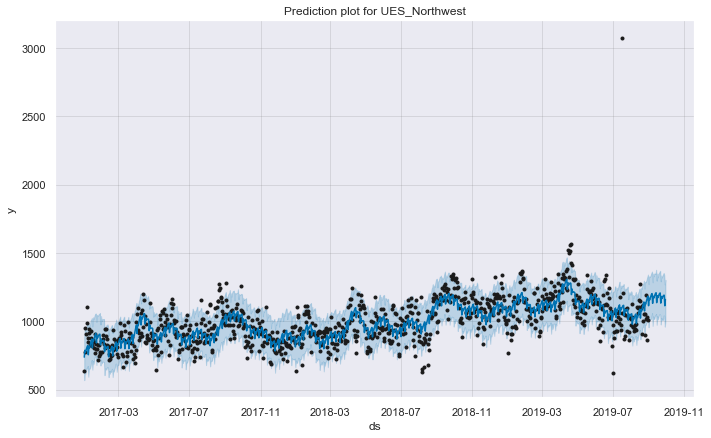

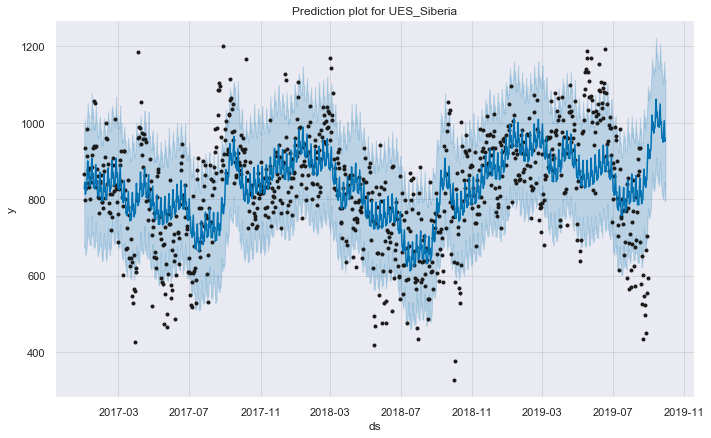

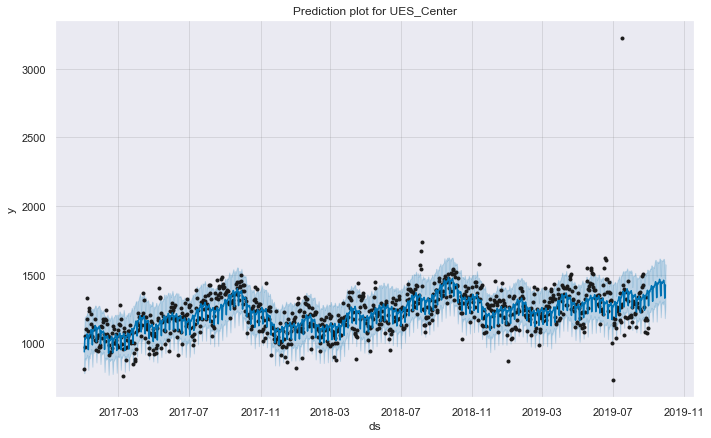

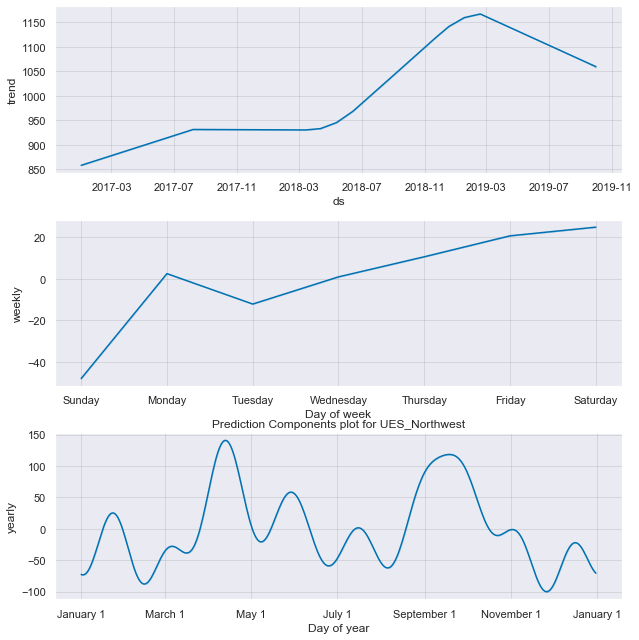

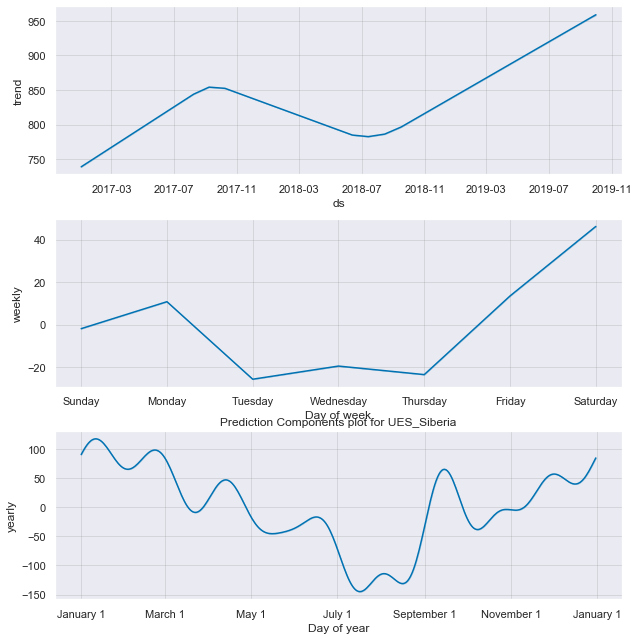

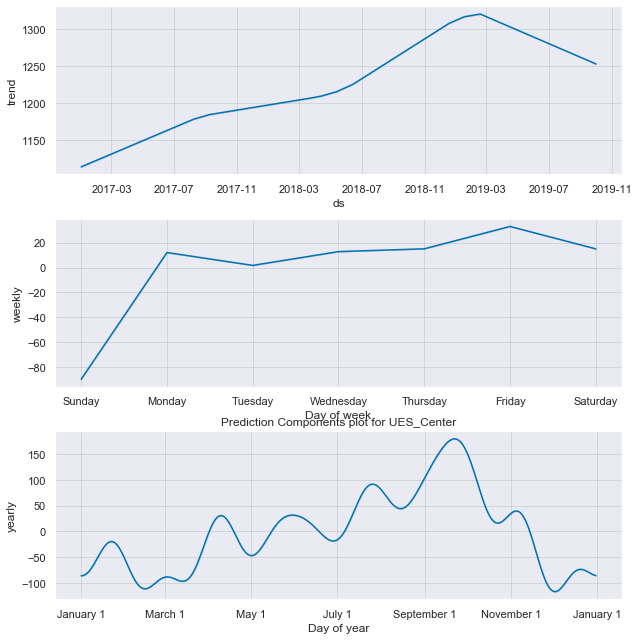

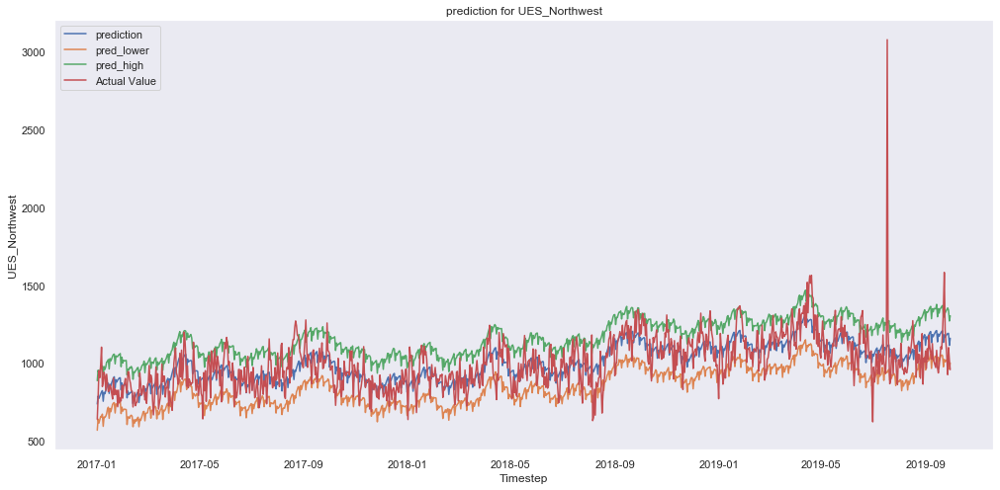

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-09-21  1203.208333  1206.930805  1047.481544  1369.464218
2019-09-22  1345.625000  1132.858552   976.222819  1292.456206
2019-09-23  1582.166667  1181.870270  1023.528188  1335.085564
2019-09-24  1212.041667  1165.343135  1008.113603  1320.635889
2019-09-25  1121.875000  1176.152923  1018.898348  1332.994012
2019-09-26  1042.875000  1183.113081  1009.450638  1343.604355
2019-09-27   925.666667  1190.032911  1042.877225  1354.076781
2019-09-28  1099.375000  1190.552586  1038.460679  1339.511136
2019-09-29  1017.939648  1113.517799   960.567673  1270.222280
2019-09-30   957.652278  1159.419553  1000.184856  1303.433930


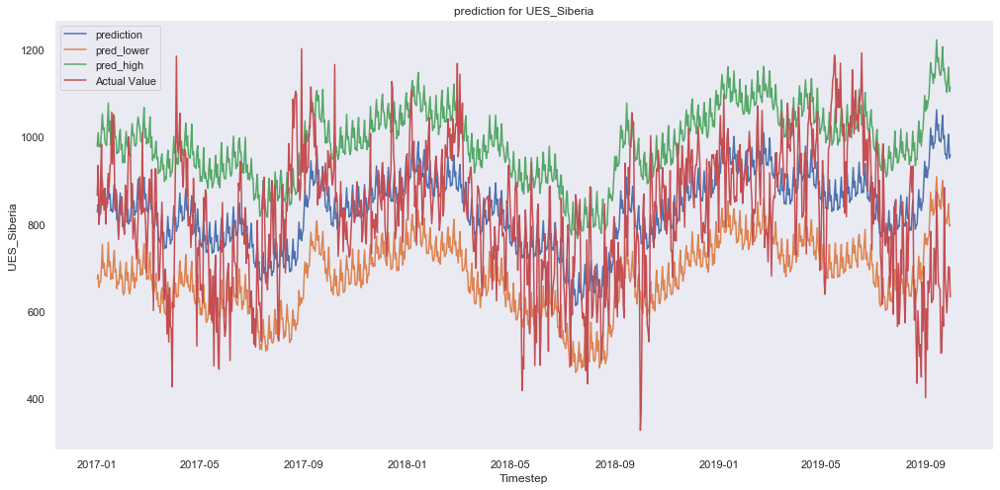

                     y         yhat  yhat_lower   yhat_upper
ds                                                          
2019-09-21  609.548229  1049.381430  899.510090  1206.950659
2019-09-22  564.811355   995.989392  841.003091  1151.852195
2019-09-23  883.482448  1002.829265  836.754404  1156.995050
2019-09-24  678.287240   960.123407  814.085944  1128.381764
2019-09-25  639.554792   959.817203  807.601085  1120.045804
2019-09-26  595.833333   949.195037  800.299514  1102.159315
2019-09-27  651.447344   979.609732  820.754097  1129.407419
2019-09-28  701.815781  1005.882987  845.916810  1160.126409
2019-09-29  699.673229   951.637855  795.307979  1104.077116
2019-09-30  632.364011   958.543574  796.790296  1113.922114


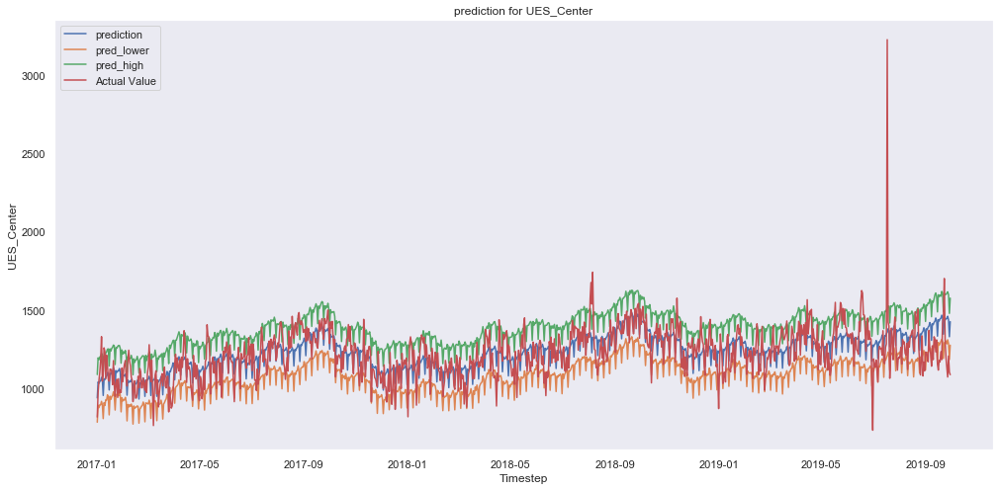

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-09-21  1414.500000  1449.349837  1297.549550  1610.370510
2019-09-22  1451.291667  1344.938834  1189.902205  1489.986191
2019-09-23  1701.375000  1446.507513  1290.988810  1606.497129
2019-09-24  1301.208333  1435.295772  1289.866768  1599.056061
2019-09-25  1195.666667  1444.818660  1302.045667  1599.662496
2019-09-26  1129.333333  1444.825979  1283.001697  1606.416753
2019-09-27  1071.375000  1459.821210  1309.650321  1615.967155
2019-09-28  1205.875000  1438.092589  1283.952622  1598.039014
2019-09-29  1101.755939  1328.899674  1183.176079  1478.306777
2019-09-30  1086.434483  1425.555765  1274.972573  1575.789378


In [109]:
# Merge all code in a single run

#resample to weekly data
resample_daily(daily_intraday)

#plot weekly_data
plot_data(daily_data)

#split dataset into single data in a list
single_data(daily_data) 

#split each dataset into individual datasets 
split(lst)

#train and predicts each dataset
train_predict(split_data)

#plot Prediction
plot_prediction(forcast_lst, daily_data) 

#plot forcast components
plot_pred_comp(forcast_lst, daily_data)    
    
#evaluate data
eval_data = list(map(lambda X: evaluate(X[0],X[1]), list(zip(lst, forcast_lst))))
eval_data
    
#calc prediction error
for it in eval_data:
    pred_error = pred_errors(it, fcst_size)
    print(pred_error)

# Plot forecast with upper and lower bounds
for data, col in zip(eval_data, daily_data):      
    plt.figure(figsize=(17, 8))
    plt.plot(data['yhat'], label = "prediction")
    plt.plot(data['yhat_lower'], label = "pred_lower")
    plt.plot(data['yhat_upper'], label = "pred_high")
    plt.plot(data['y'], label = "Actual Value")
    plt.xlabel('Timestep')
    plt.ylabel(col)
    plt.title(f"prediction for {col}")
    plt.grid(False)
    plt.legend()
    plt.show()
    print(pred_table(data).tail(10))


### Prediction for Daily `UES_dayahead_price`

In [31]:
daily_price = UES_dayahead_price.copy()

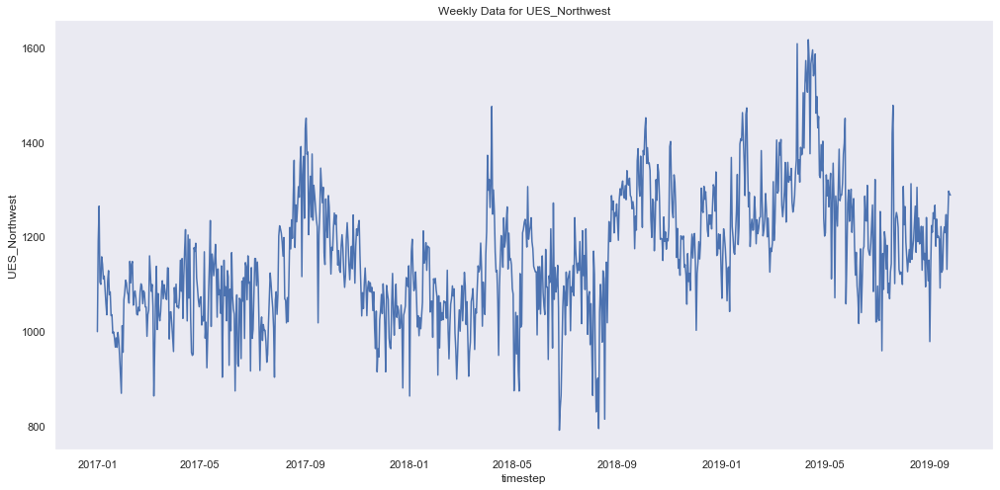

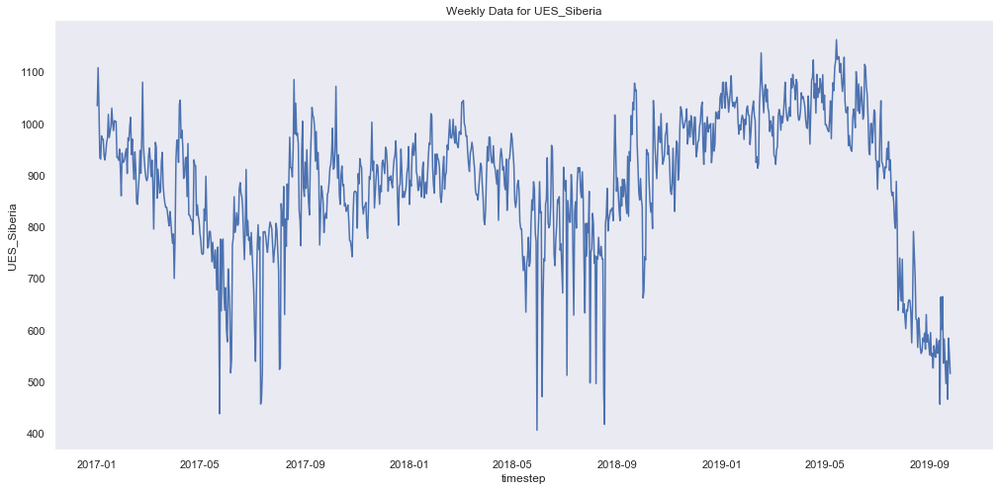

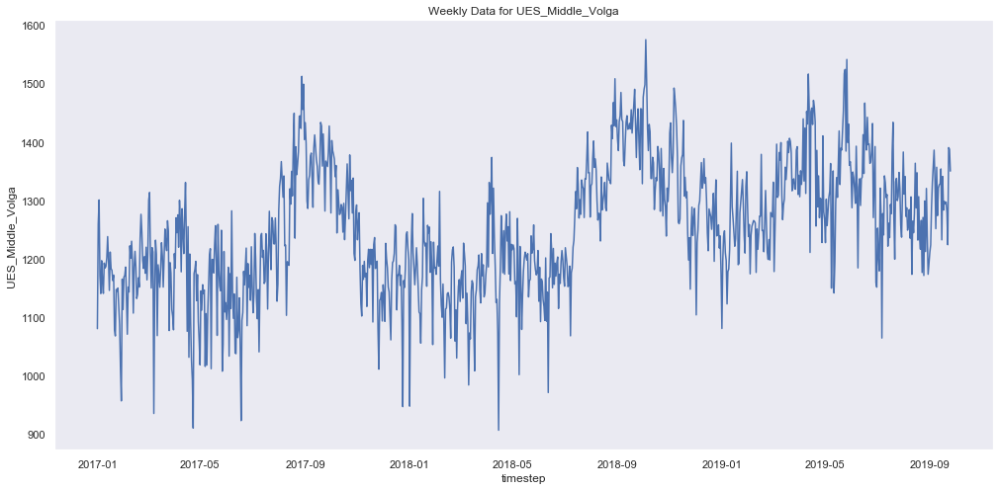

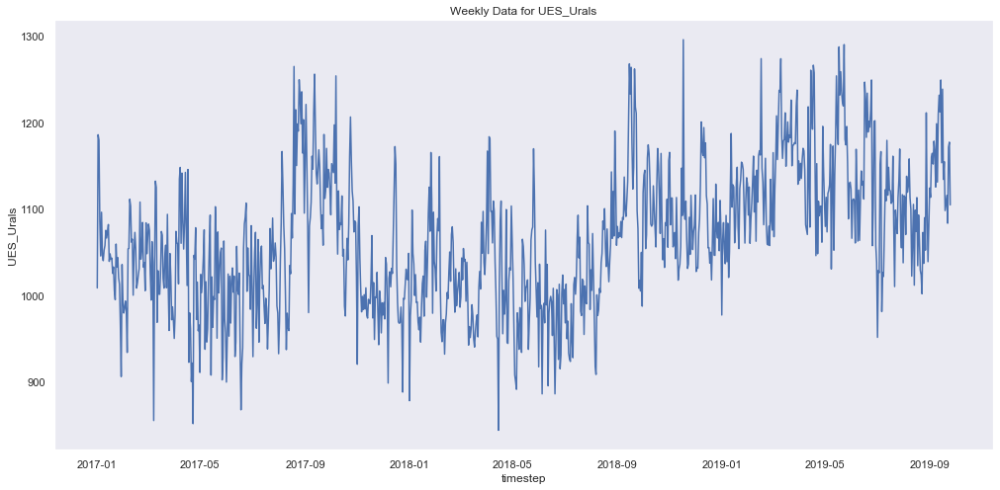

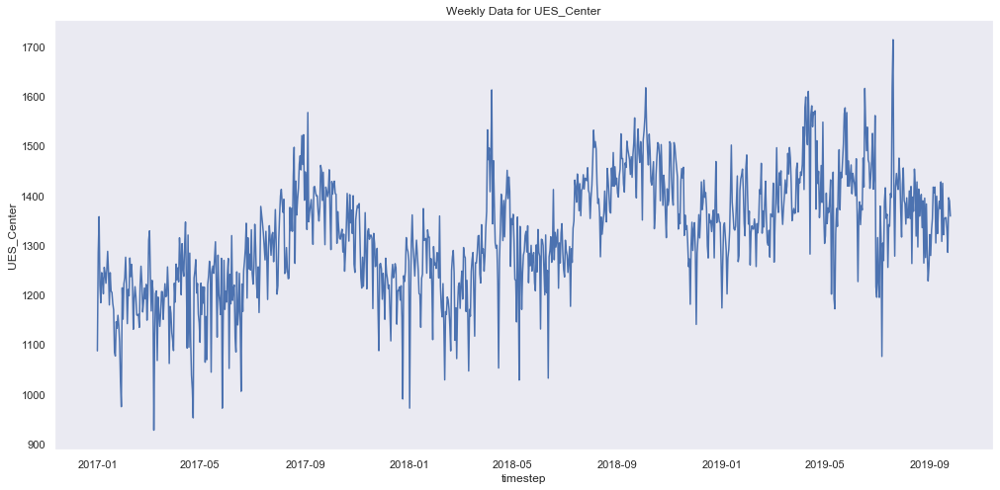

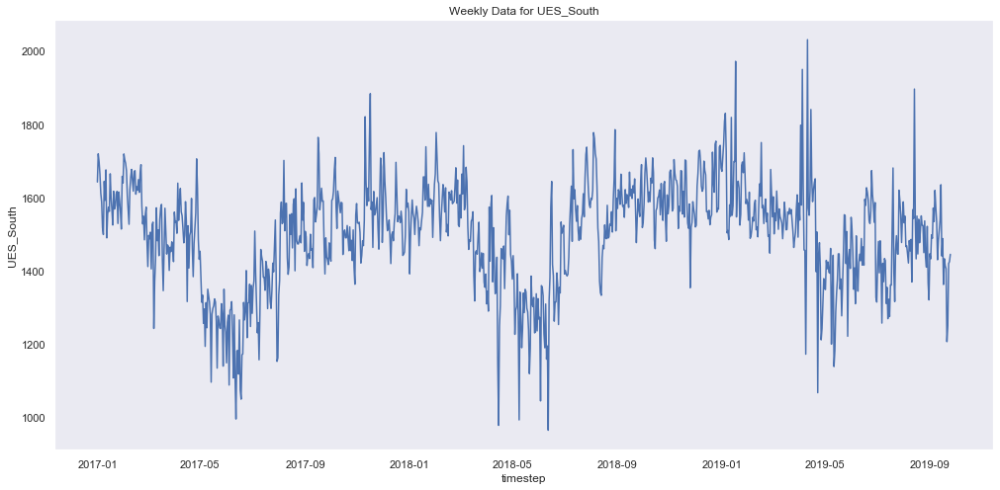

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


{'MAPE': 14.038042696533195, 'MAE': 162.4126970229257}
{'MAPE': 74.80798711041881, 'MAE': 413.2729085948115}
{'MAPE': 12.217801796215294, 'MAE': 155.88414431824037}
{'MAPE': 6.500370684108529, 'MAE': 72.60658329966894}
{'MAPE': 9.896081546607785, 'MAE': 131.47972498877272}
{'MAPE': 11.78106265773291, 'MAE': 164.52563137979425}


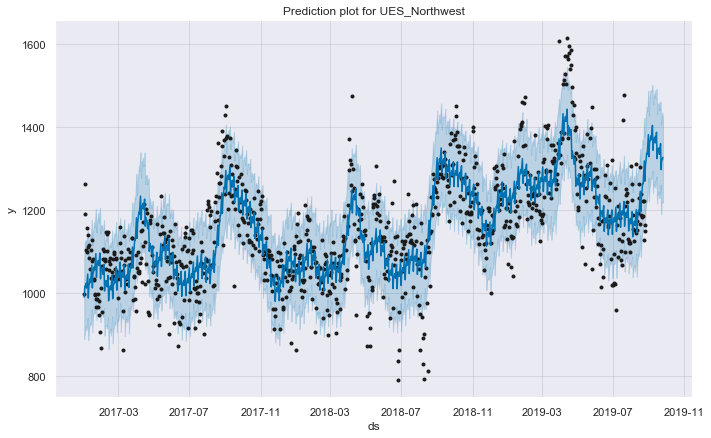

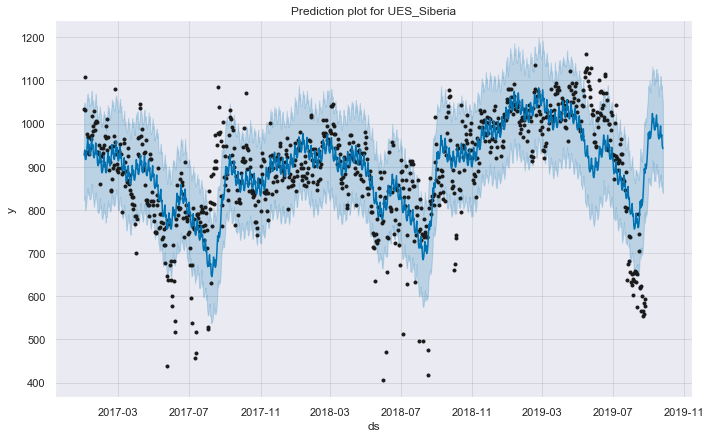

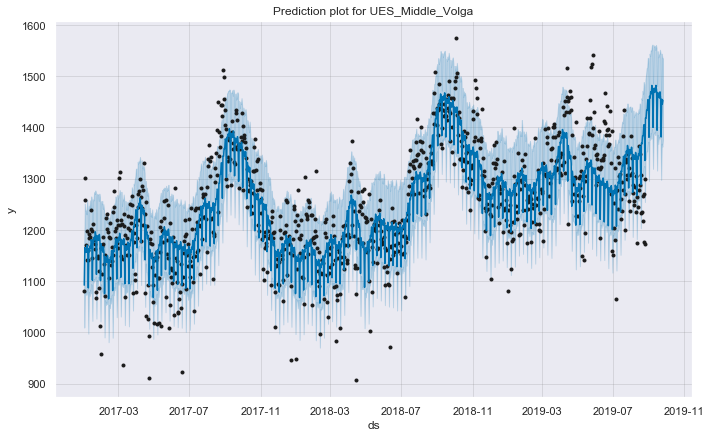

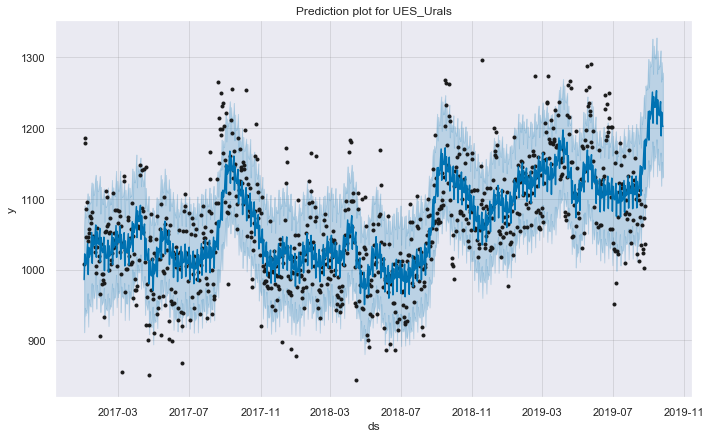

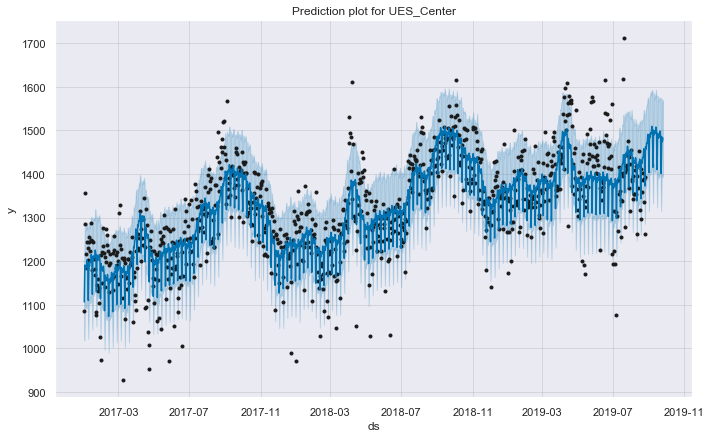

...

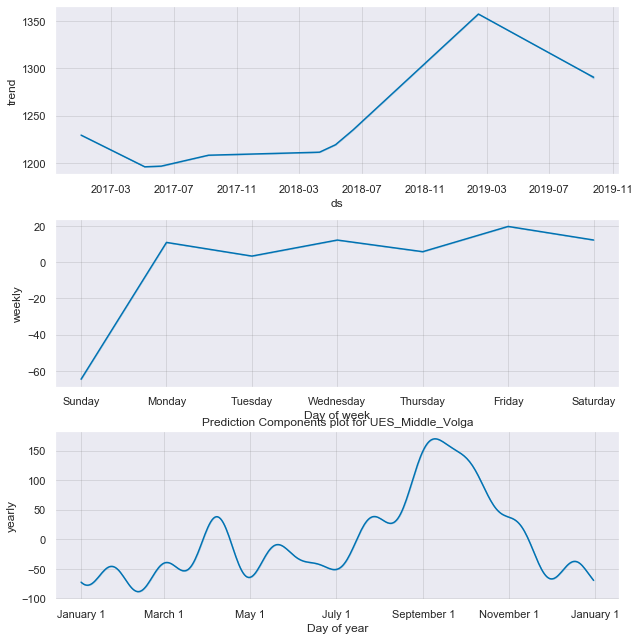

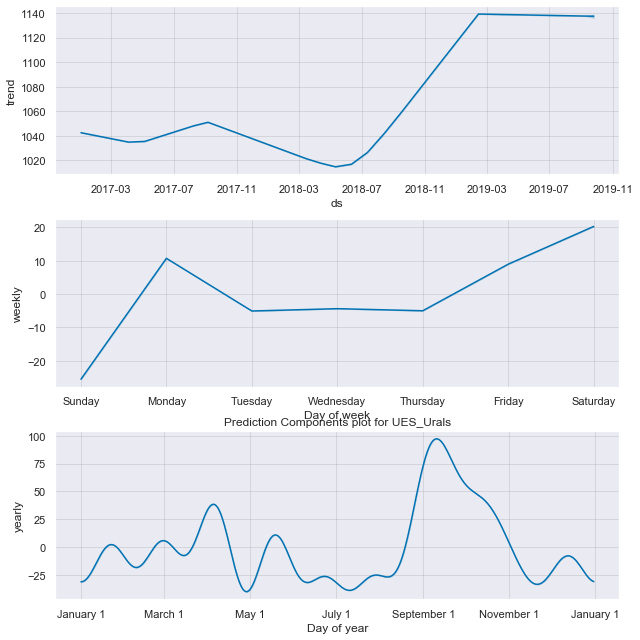

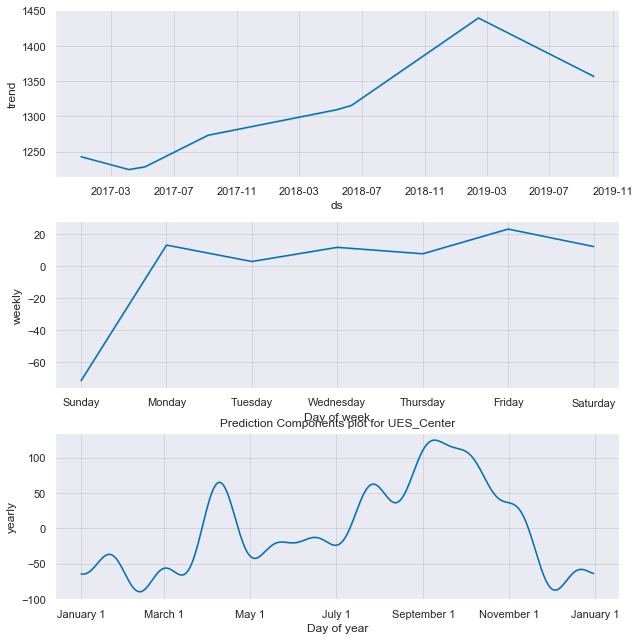

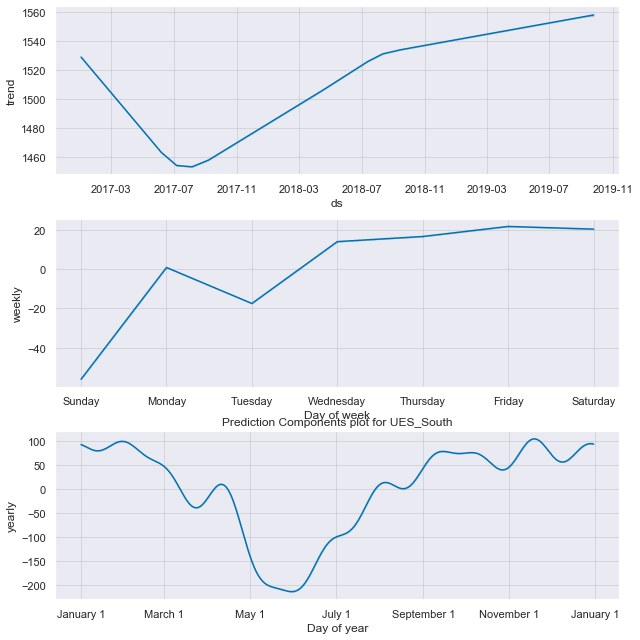

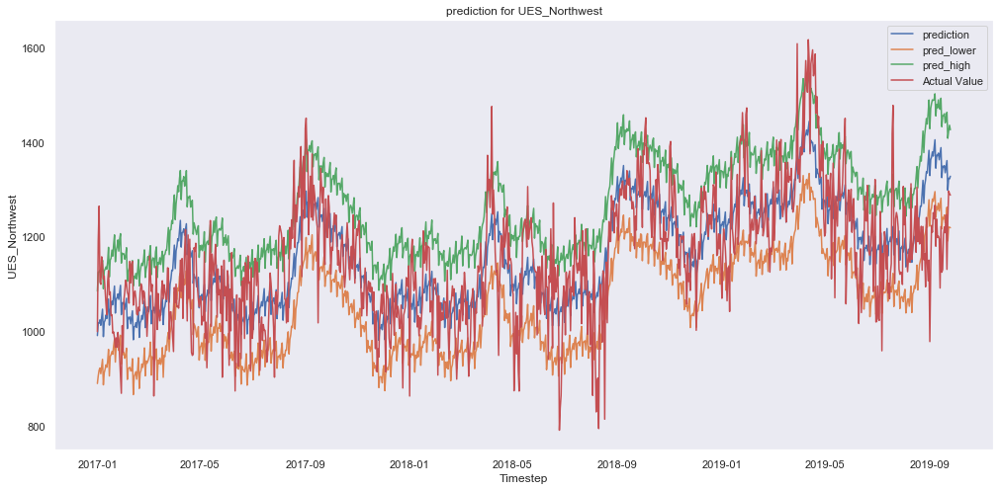

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-09-16  1130.390833  1348.845071  1240.399381  1455.238341
2019-09-17  1204.687917  1346.032922  1237.143841  1455.781662
2019-09-18  1220.509167  1349.884061  1245.584918  1459.546095
2019-09-19  1208.264167  1334.892989  1229.243216  1440.462995
2019-09-20  1246.499583  1347.625425  1237.808143  1452.476561
2019-09-21  1130.826250  1360.570531  1262.018050  1462.427121
2019-09-22  1233.817083  1297.912304  1190.881913  1407.614762
2019-09-23  1296.106250  1323.354408  1219.883385  1423.351776
2019-09-24  1290.936667  1322.007675  1219.956135  1435.254834
2019-09-25  1287.609583  1327.559546  1218.676524  1425.567348


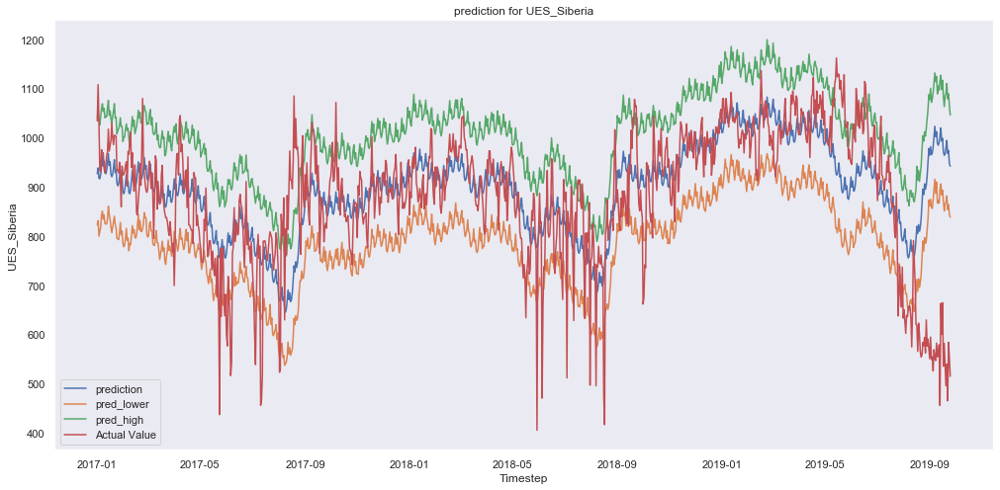

                     y        yhat  yhat_lower   yhat_upper
ds                                                         
2019-09-16  664.456250  998.842710  893.359862  1116.660984
2019-09-17  535.345417  971.240854  871.234747  1084.284364
2019-09-18  582.058333  964.131968  851.073984  1063.289278
2019-09-19  536.174583  967.100915  865.779682  1084.392625
2019-09-20  495.972917  979.177474  867.778863  1089.969379
2019-09-21  539.703750  994.551133  881.612454  1110.243922
2019-09-22  465.419167  967.899955  854.132691  1078.935982
2019-09-23  584.035417  973.937509  864.001387  1089.244832
2019-09-24  552.172917  947.497345  844.047587  1065.135270
2019-09-25  515.166250  942.083557  838.465703  1046.029243


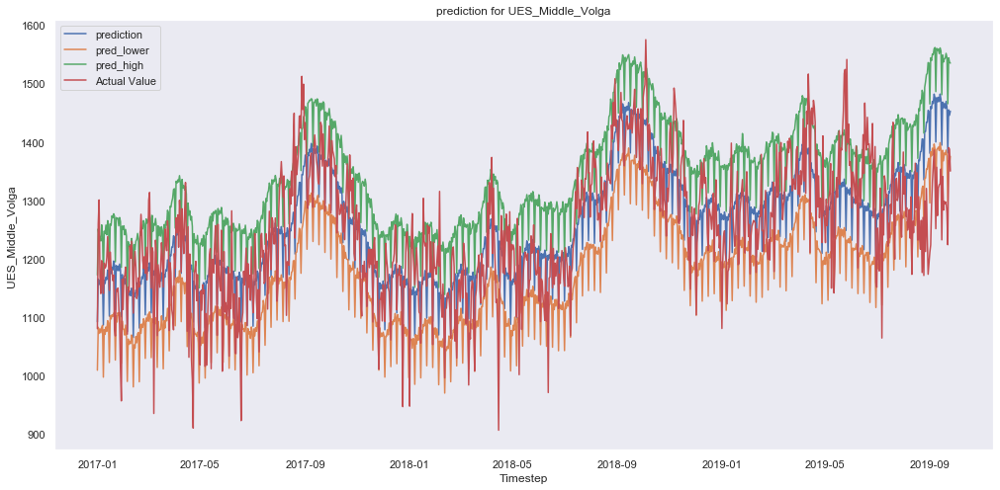

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-09-16  1340.938333  1468.326993  1385.840779  1548.822283
2019-09-17  1283.496250  1458.894434  1367.823648  1536.967926
2019-09-18  1298.322500  1465.818754  1381.170222  1542.614042
2019-09-19  1294.441667  1457.450001  1378.294471  1543.213086
2019-09-20  1297.090833  1469.476096  1386.012299  1551.657318
2019-09-21  1279.717917  1460.094959  1375.525708  1544.698397
2019-09-22  1224.147500  1381.351738  1297.657585  1465.507980
2019-09-23  1390.366250  1455.111641  1368.213959  1544.015822
2019-09-24  1387.611667  1445.787216  1362.419539  1536.760732
2019-09-25  1350.150000  1452.879283  1375.432952  1534.977094


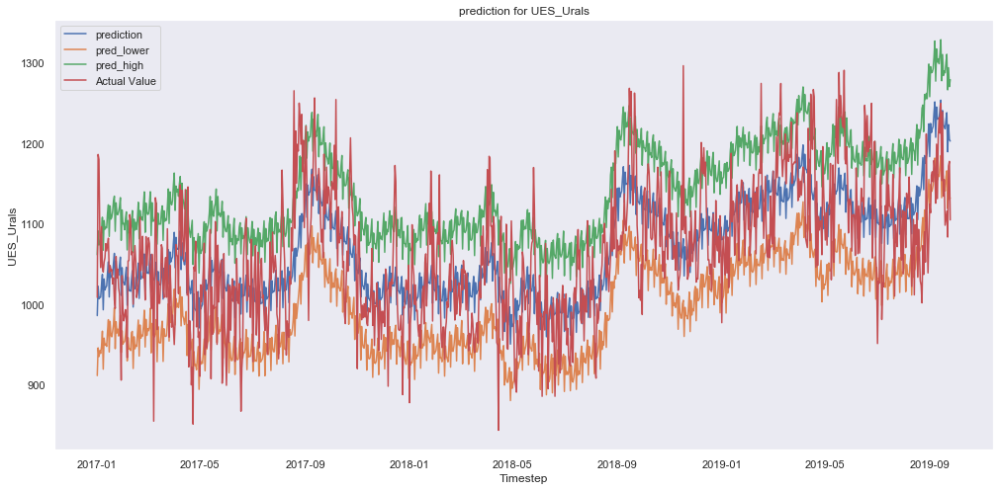

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-09-16  1238.622917  1240.265160  1171.220226  1309.777610
2019-09-17  1134.105000  1222.379428  1148.765571  1283.717404
2019-09-18  1154.685000  1220.759400  1148.523664  1289.392090
2019-09-19  1098.034583  1217.648296  1140.512036  1287.101148
2019-09-20  1107.353750  1229.007456  1158.069893  1300.073031
2019-09-21  1115.508750  1237.641230  1165.558053  1310.087993
2019-09-22  1083.300417  1189.143592  1118.706713  1265.953798
2019-09-23  1171.390000  1222.699534  1152.521588  1293.430768
2019-09-24  1177.247083  1204.281432  1130.061887  1269.953182
2019-09-25  1104.591667  1202.439405  1131.770090  1278.621194


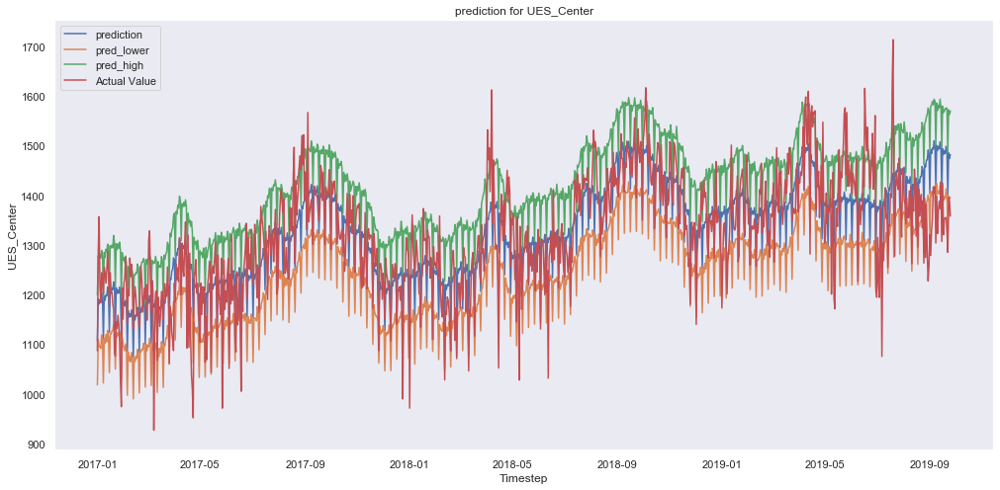

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-09-16  1424.060417  1493.829426  1404.955687  1579.325347
2019-09-17  1320.465417  1482.137541  1389.299123  1566.775603
2019-09-18  1352.412083  1489.682482  1397.624903  1569.680636
2019-09-19  1354.657083  1484.330586  1393.146102  1575.142925
2019-09-20  1354.925000  1498.616414  1412.474271  1574.826399
2019-09-21  1328.435417  1486.512639  1402.349516  1575.853850
2019-09-22  1284.949583  1401.195167  1315.132876  1485.742754
2019-09-23  1395.093333  1485.359705  1399.087701  1572.252416
2019-09-24  1388.488750  1474.128821  1392.645802  1562.594140
2019-09-25  1357.976667  1482.154628  1395.794479  1569.834802


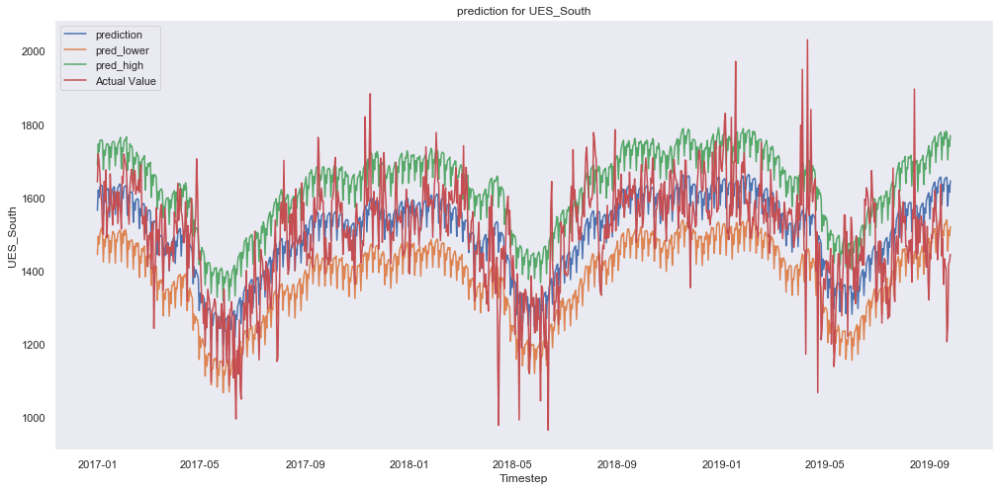

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-09-16  1487.930000  1635.833726  1509.589741  1764.257355
2019-09-17  1362.432083  1617.387261  1495.242393  1743.040661
2019-09-18  1432.897500  1648.548113  1526.639693  1777.444123
2019-09-19  1413.668333  1650.736482  1525.678952  1759.398882
2019-09-20  1405.742917  1655.355565  1535.312529  1781.421167
2019-09-21  1206.558333  1653.476473  1539.068116  1774.860478
2019-09-22  1249.834167  1576.600348  1453.652252  1702.351687
2019-09-23  1419.580833  1632.994557  1510.471008  1758.317685
2019-09-24  1425.393750  1614.322639  1495.354370  1739.345239
2019-09-25  1444.925000  1645.534758  1520.421417  1768.883562


In [110]:
# Merge all code in a single run

#resample to weekly data
resample_daily(daily_price)

#plot weekly_data
plot_data(daily_data)

#split dataset into single data in a list
single_data(daily_data) 

#split each dataset into individual datasets 
split(lst)

#train and predicts each dataset
train_predict(split_data)

#plot Prediction
plot_prediction(forcast_lst, daily_data) 

#plot forcast components
plot_pred_comp(forcast_lst, daily_data)    
    
#evaluate data
eval_data = list(map(lambda X: evaluate(X[0],X[1]), list(zip(lst, forcast_lst))))
eval_data
    
#calc prediction error
for it in eval_data:
    pred_error = pred_errors(it, fcst_size)
    print(pred_error)

# Plot forecast with upper and lower bounds
for data, col in zip(eval_data, daily_data):      
    plt.figure(figsize=(17, 8))
    plt.plot(data['yhat'], label = "prediction")
    plt.plot(data['yhat_lower'], label = "pred_lower")
    plt.plot(data['yhat_upper'], label = "pred_high")
    plt.plot(data['y'], label = "Actual Value")
    plt.xlabel('Timestep')
    plt.ylabel(col)
    plt.title(f"prediction for {col}")
    plt.grid(False)
    plt.legend()
    plt.show()
    print(pred_table(data).tail(10))

### Prediction for Daily `PZ_dayahead_price_volume`

In [33]:
price_volume = PZ_dayahead_price_volume.copy()

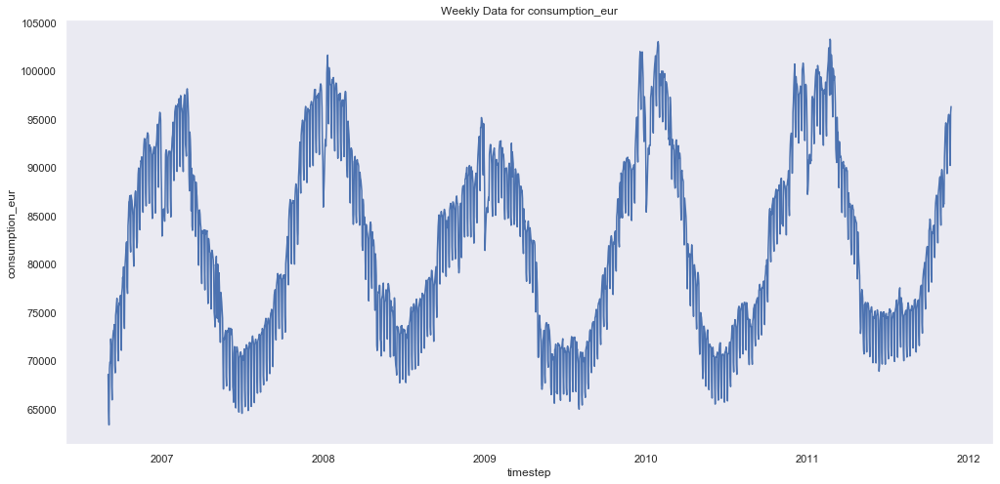

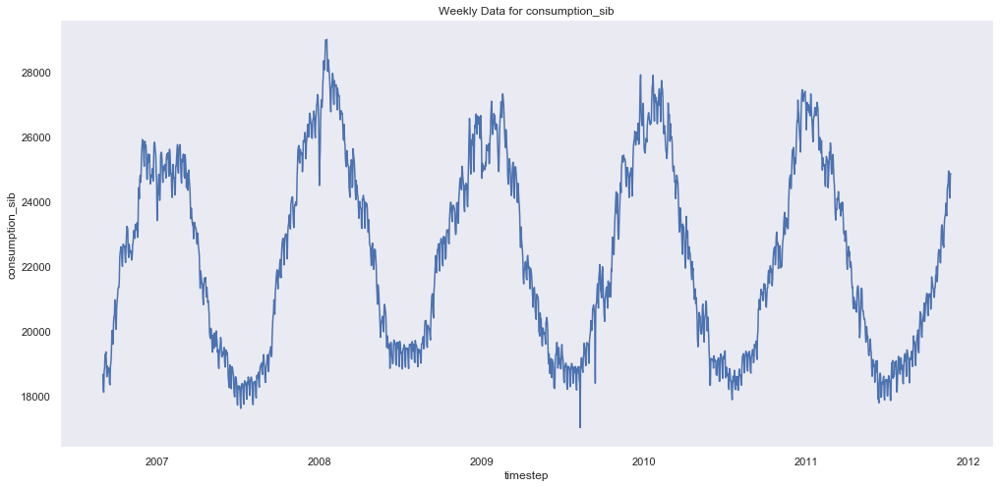

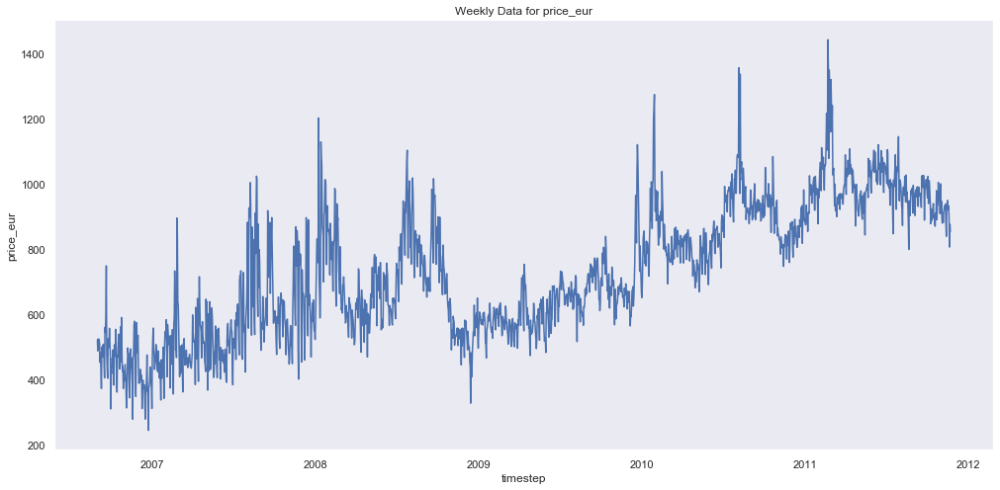

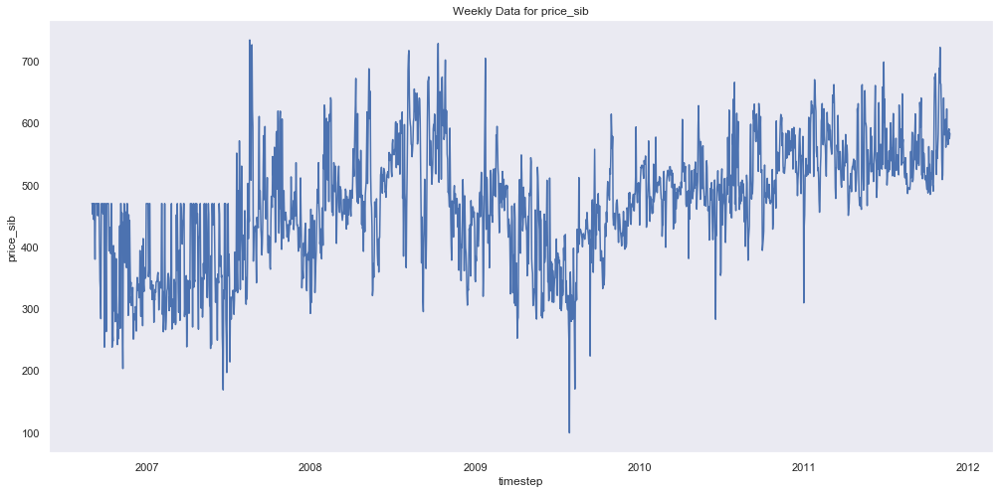

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


{'MAPE': 1.5781612759164643, 'MAE': 1447.4304533335321}
{'MAPE': 1.4431184912952297, 'MAE': 340.76425097048997}
{'MAPE': 2.955634802804613, 'MAE': 26.911133084729702}
{'MAPE': 5.9380643510877995, 'MAE': 36.21361220166928}


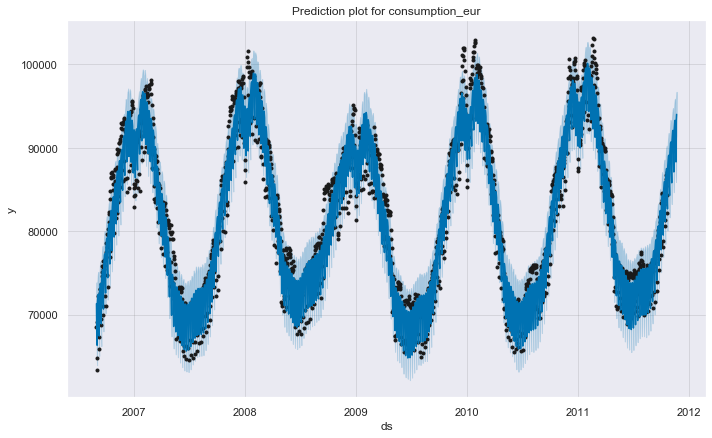

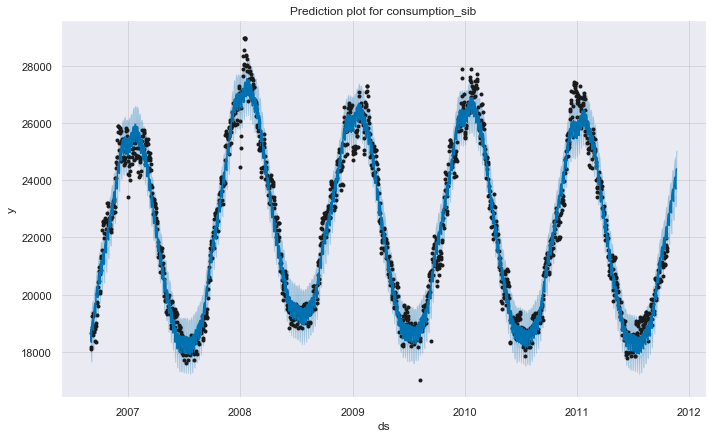

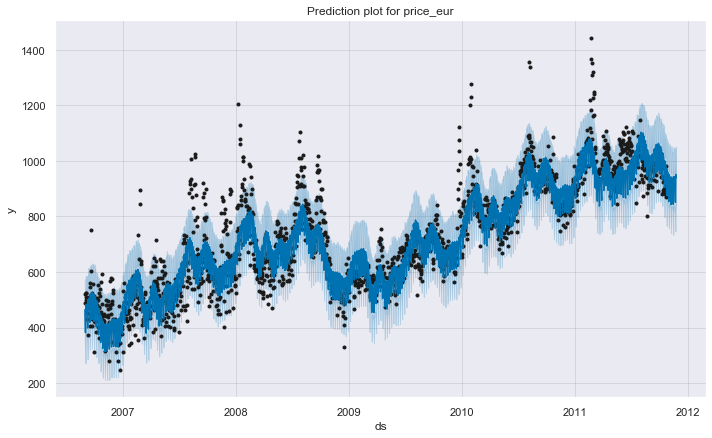

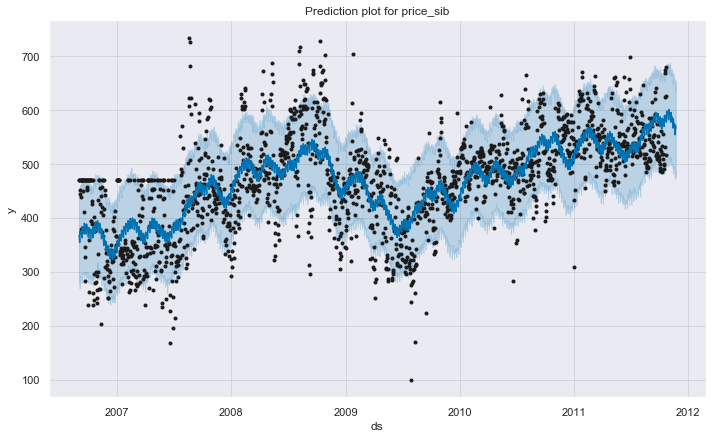

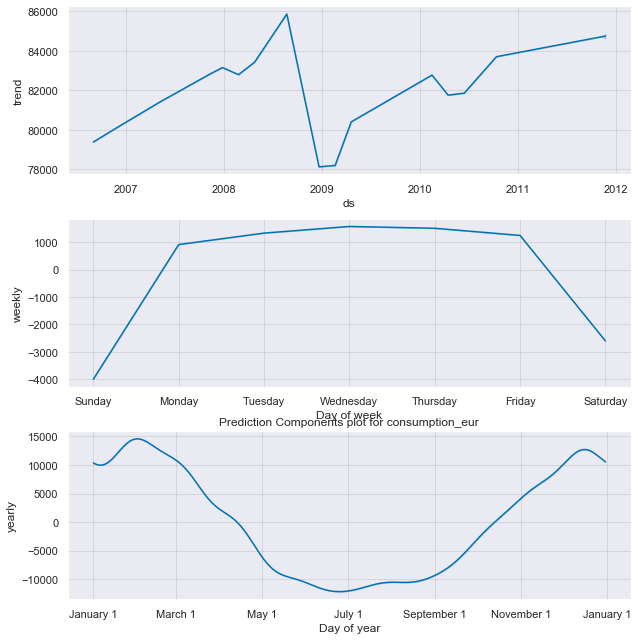

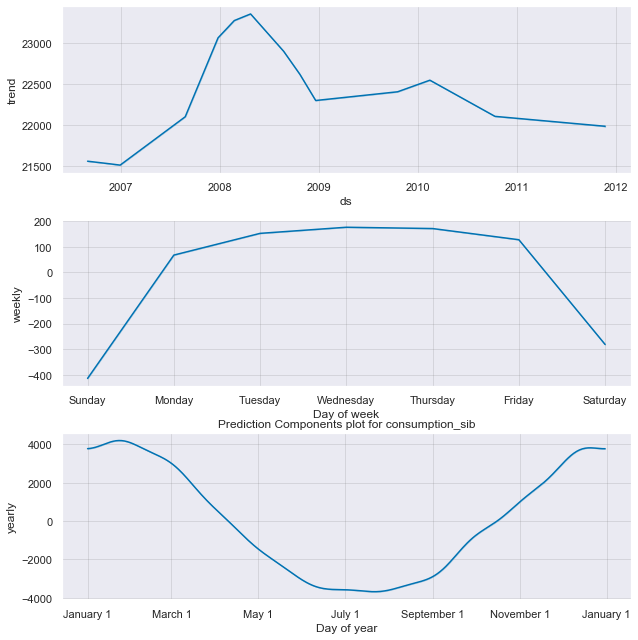

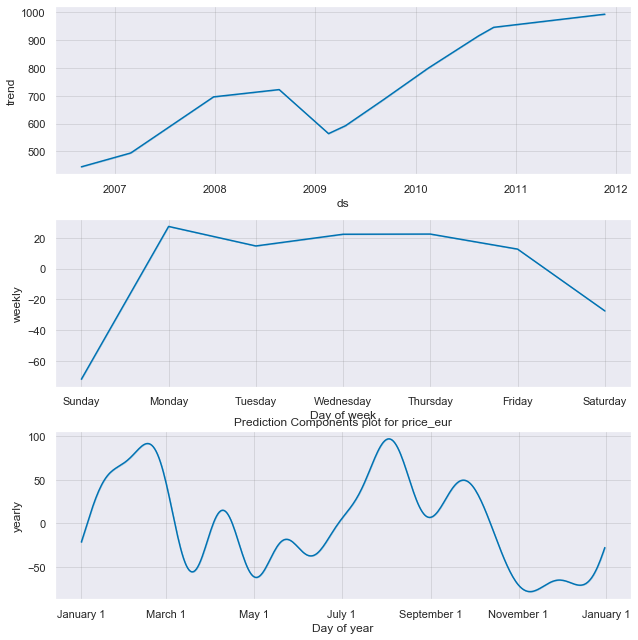

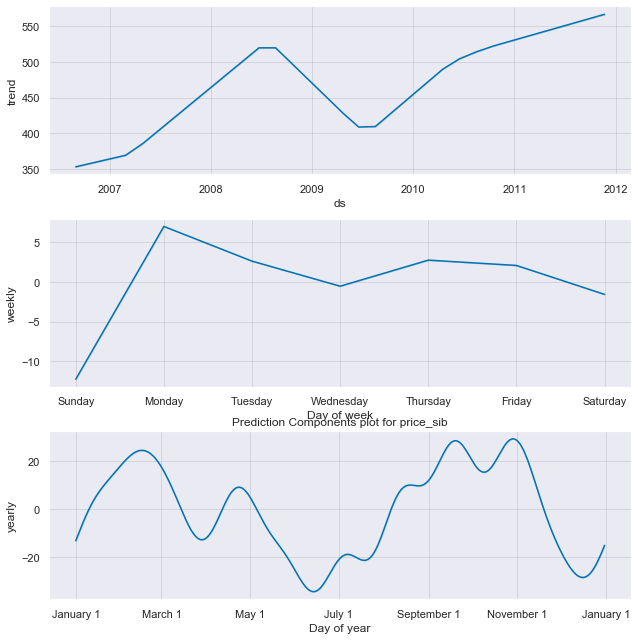

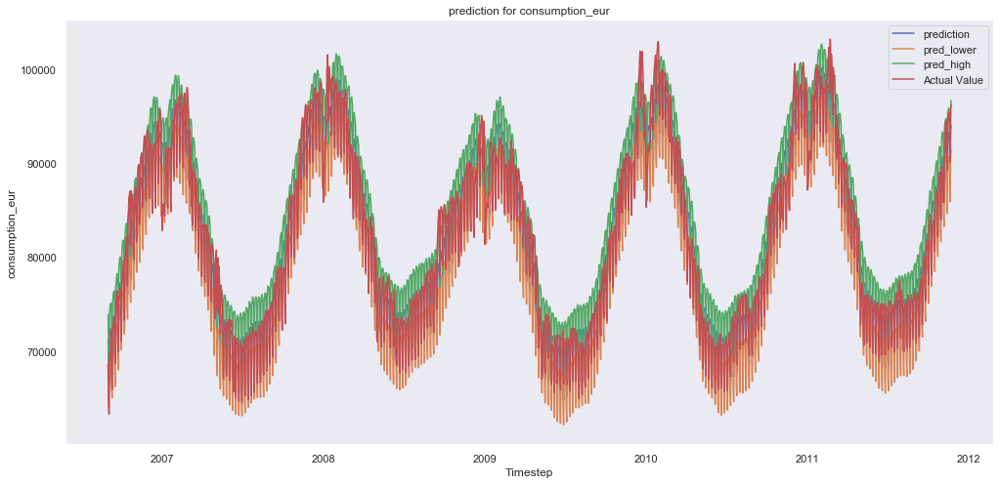

                       y          yhat    yhat_lower    yhat_upper
ds                                                                
2011-11-13  89311.583333  87104.560285  84676.788570  89656.023153
2011-11-14  94329.166667  92194.453965  89466.243885  94856.964334
2011-11-15  94840.041667  92781.369690  90165.104797  95532.680598
2011-11-16  95405.458333  93192.870424  90662.153074  95816.210208
2011-11-17  95449.458333  93295.437969  90777.009406  95897.790604
2011-11-18  95228.000000  93205.044197  90563.888559  95806.024868
2011-11-19  91740.833333  89525.717435  86852.615241  92057.412797
2011-11-20  90162.666667  88303.883856  85907.888248  90856.135315
2011-11-21  95614.500000  93407.244903  90885.359408  95782.557085
2011-11-22  96260.000000  94015.552568  91458.059063  96718.600780


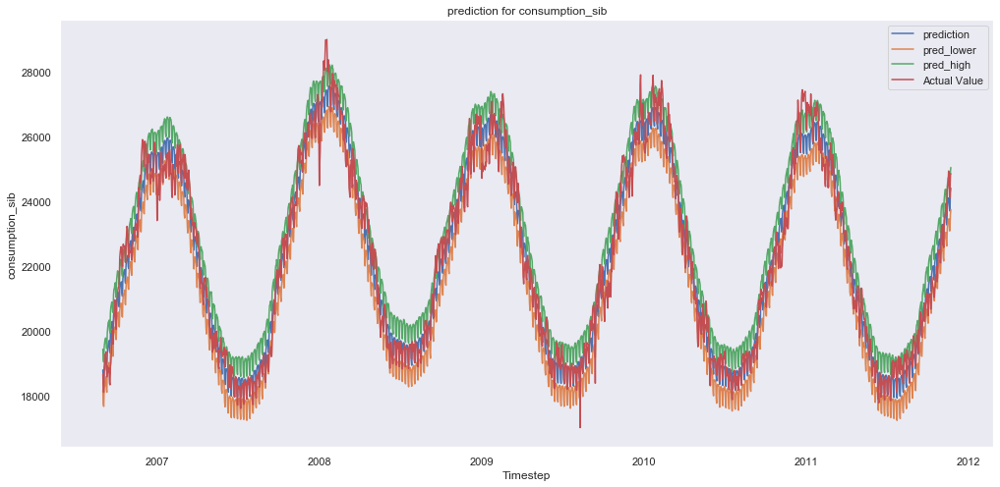

                       y          yhat    yhat_lower    yhat_upper
ds                                                                
2011-11-13  23545.458333  23264.555759  22615.436943  23955.921016
2011-11-14  24351.083333  23803.858760  23140.991831  24456.293540
2011-11-15  24466.000000  23947.251104  23297.517603  24591.309364
2011-11-16  24539.166667  24030.716557  23395.770929  24723.050946
2011-11-17  24926.791667  24086.525170  23443.285256  24722.715465
2011-11-18  24854.791667  24105.265650  23451.917003  24807.618544
2011-11-19  24172.916667  23760.325576  23082.136597  24391.353228
2011-11-20  24094.833333  23693.723474  23084.830134  24314.979162
2011-11-21  24843.541667  24243.066745  23565.081511  24891.812903
2011-11-22  24841.791667  24397.693971  23738.121841  25036.184188


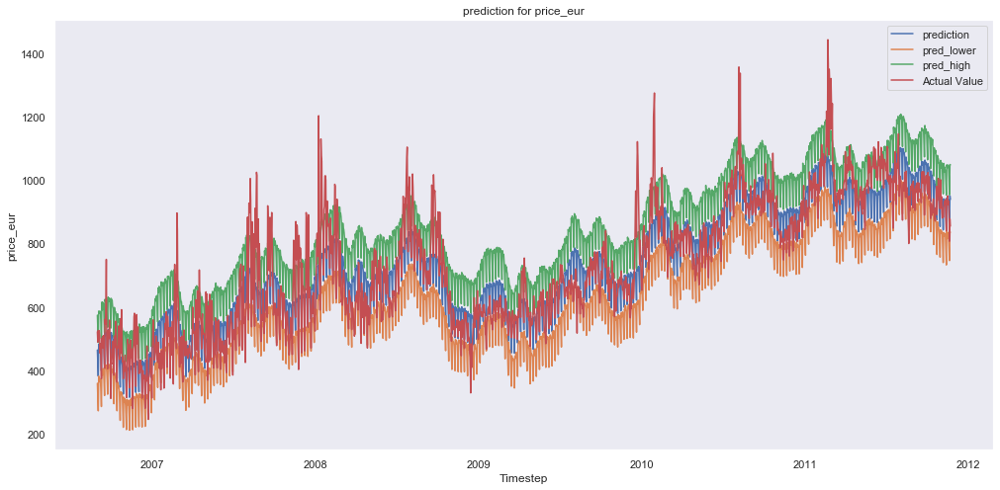

                     y        yhat  yhat_lower   yhat_upper
ds                                                         
2011-11-13  840.422917  843.539430  732.591965   953.195405
2011-11-14  932.984583  943.591697  839.951753  1048.590656
2011-11-15  943.960417  931.801278  815.880592  1038.618186
2011-11-16  950.757500  940.400920  835.309616  1044.842871
2011-11-17  922.378333  941.575832  831.713946  1047.517758
2011-11-18  933.845833  932.906246  821.768328  1043.197522
2011-11-19  904.379167  893.891346  778.596395  1001.941947
2011-11-20  807.442083  850.609788  746.234939   953.885397
2011-11-21  877.415833  950.990578  834.251100  1049.521819
2011-11-22  855.105833  939.367462  835.930625  1048.571975


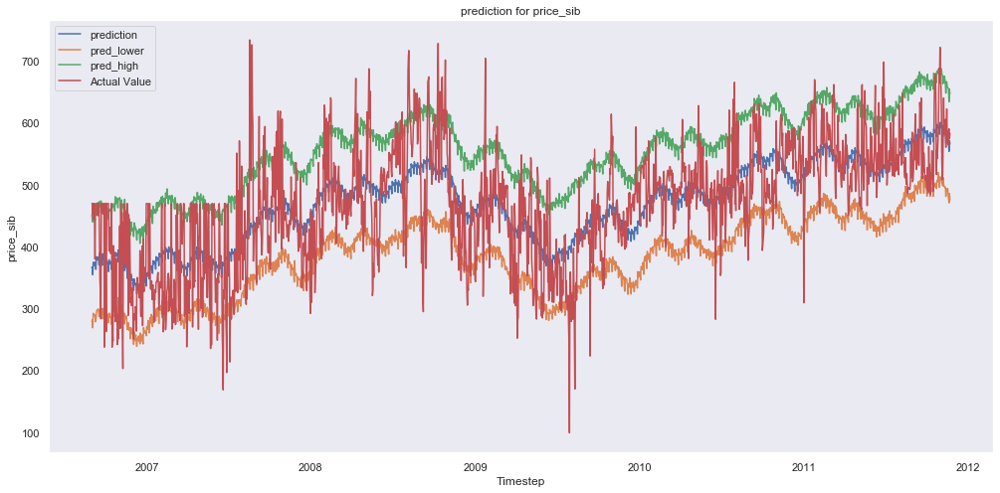

                     y        yhat  yhat_lower  yhat_upper
ds                                                        
2011-11-13  560.267083  565.985797  480.768997  647.738708
2011-11-14  582.992917  583.458597  491.969040  666.321358
2011-11-15  622.199583  577.284854  492.957353  665.908603
2011-11-16  573.540000  572.327798  489.522427  657.613698
2011-11-17  577.347500  573.831371  493.464424  656.980822
2011-11-18  564.751667  571.405543  484.415883  656.020663
2011-11-19  586.387083  566.030889  476.374868  653.247555
2011-11-20  589.934167  553.650449  470.383710  633.816620
2011-11-21  574.187083  571.273907  485.368613  654.111267
2011-11-22  582.542917  565.309894  475.059072  646.576135


In [111]:
# Merge all code in a single run

#resample to weekly data
resample_daily(price_volume)

#plot weekly_data
plot_data(daily_data)

#split dataset into single data in a list
single_data(daily_data) 

#split each dataset into individual datasets 
split(lst)

#train and predicts each dataset
train_predict(split_data)

#plot Prediction
plot_prediction(forcast_lst, daily_data) 

#plot forcast components
plot_pred_comp(forcast_lst, daily_data)    
    
#evaluate data
eval_data = list(map(lambda X: evaluate(X[0],X[1]), list(zip(lst, forcast_lst))))
eval_data
    
#calc prediction error
for it in eval_data:
    pred_error = pred_errors(it, fcst_size)
    print(pred_error)

# Plot forecast with upper and lower bounds
for data, col in zip(eval_data, daily_data):      
    plt.figure(figsize=(17, 8))
    plt.plot(data['yhat'], label = "prediction")
    plt.plot(data['yhat_lower'], label = "pred_lower")
    plt.plot(data['yhat_upper'], label = "pred_high")
    plt.plot(data['y'], label = "Actual Value")
    plt.xlabel('Timestep')
    plt.ylabel(col)
    plt.title(f"prediction for {col}")
    plt.grid(False)
    plt.legend()
    plt.show()
    print(pred_table(data).tail(10))


### Functions for Yearly Prediction

In [142]:
#Functions for Yearly prediction

#import Prophet
from prophet import Prophet
import logging

logging.getLogger().setLevel(logging.ERROR)

#Functions to automate

#resample data by year
def resample_yearly(data):
    
    #Aggregate data
    global yearly_data 
    daily_data = data.groupby("timestep").mean()
    yearly_data = daily_data.resample("Y").mean()
     
    return yearly_data

# Plot the yearly data
def plot_data(data):
    for col in data.columns:
        plt.figure(figsize=(17, 8))
        plt.plot(data[col])
        plt.xlabel('timestep')
        plt.ylabel(col)
        plt.title(f"Weekly Data for {col}")
        plt.grid(False)
        plt.show()
    


#Modeling

#Create single dataset & Change columns
def single_data(data):
    global wd_cons
    global lst
    lst = []
    for col in data:
        wd_con = pd.DataFrame(data[col], index = data.index)
        wd_cons = wd_con.reset_index()
        wd_cons.columns = ["ds", "y"]
        lst.append(wd_cons)

    return lst

#split into test train data (last 30 values), Train & Predict model

def split(lst):
    global my_model
    global fut
    global split_data
    fcst_size = 1
    split_data = []
    for dt in lst:
        data = dt.copy() 
        splited = data[: - fcst_size]
        split_data.append(splited)
        
    return split_data

def train_predict(split_data):
    global model_lst
    global forcast_lst
    global fcst_size
    fcst_size = 2
    forcast_lst = []
    model_lst = []
    for tr in split_data:
        my_model = Prophet().fit(tr)
        model_lst.append(my_model)
        fut = my_model.make_future_dataframe(periods = fcst_size, freq = "Y")
        forcast = my_model.predict(fut)
        forcast_lst.append(forcast)
        
    return forcast_lst
    

#plot Prediction
def plot_prediction(pred_lst, yearly_data):
    for fcst, mod, col in zip(forcast_lst, model_lst, yearly_data):
        mod.plot(fcst)
        plt.title(f"Prediction plot for {col}")

#plot forcast components
def plot_pred_comp(pred_lst, yearly_data):
    for fcst, mod, col in zip(forcast_lst, model_lst, yearly_data):
        mod.plot_components(pd.DataFrame(fcst))
        plt.title(f"Prediction Components plot for {col}")

#evaluate Model
def evaluate(historical, predicted):
        eval_data = predicted.set_index("ds")[["yhat", "yhat_lower", "yhat_upper"]].join(historical.set_index("ds"))
        return eval_data 
    
    
#eval_data = evaluate(wd_cons, prediction)
#eval_data.head()

def pred_errors(df, prediction_size):
    #df = df.copy()
    
    df['e'] = df['y'] - df['yhat']
    df['p'] = 100 * df['e'] / df['y']
    
    predicted_part = df[- fcst_size:]
    
    error_mean = lambda error_name: np.mean(np.abs(predicted_part[error_name]))
    
    return {'MAPE': error_mean('p'), 'MAE': error_mean('e')}

#for err_name, err_value in pred_errors(eval_data, pred_size).items():
   # print(err_name, err_value)


"""# Plot forecast with upper and lower bounds
plt.figure(figsize=(17, 8))
plt.plot(eval_data['yhat'], label = "prediction")
plt.plot(eval_data['yhat_lower'], label = "pred_lower")
plt.plot(eval_data['yhat_upper'], label = "pred_high")
plt.plot(eval_data['y'], label = "Actual Value")
plt.xlabel('Timestep')
plt.ylabel(wd_con.columns.values)
plt.title(f"prediction for {wd_con.columns.values}")
plt.grid(False)
plt.legend()
plt.show()"""

#print Prediction table
def pred_table(data):
    table = pd.DataFrame(data, columns = ["y", "yhat", "yhat_lower", "yhat_upper"], index = data.index)
    return table.tail(fcst_size)

### Prediction for Yearly `PZ_dayahead_price_volume`

In [143]:
price_volume = PZ_dayahead_price_volume.copy()

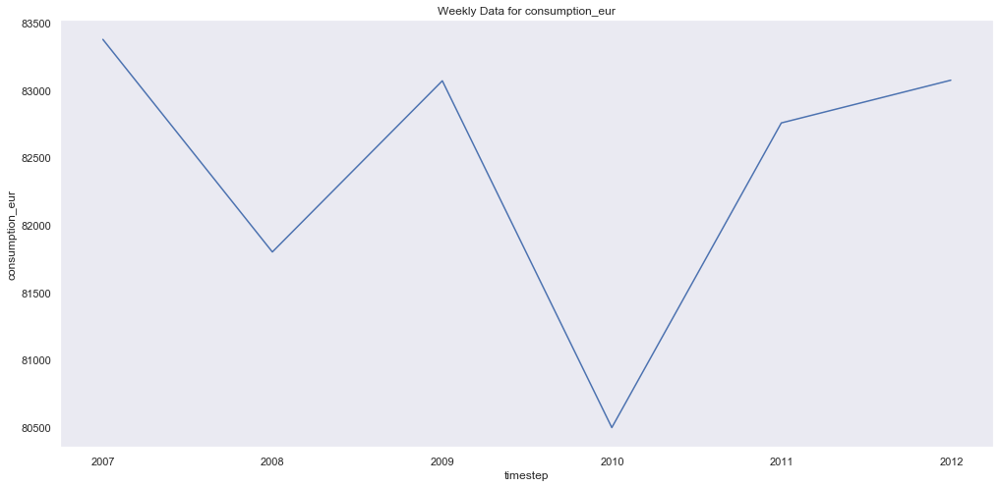

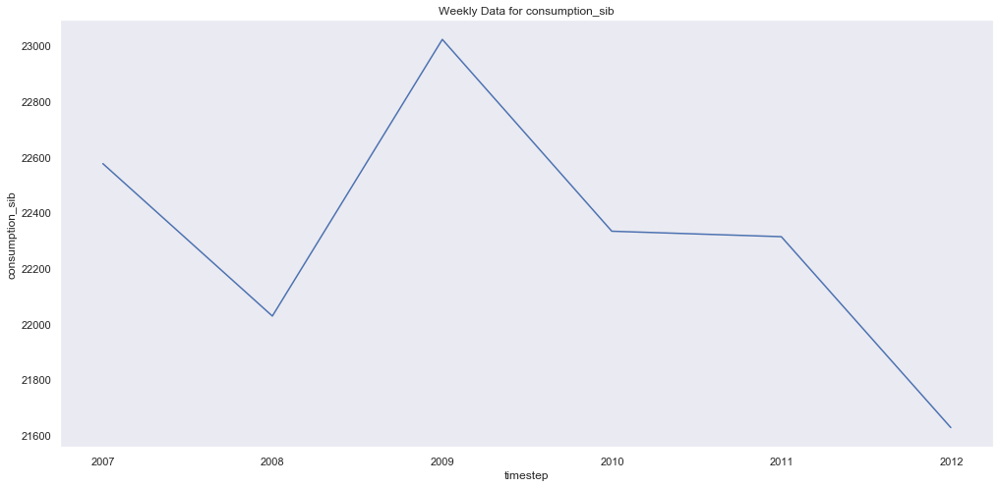

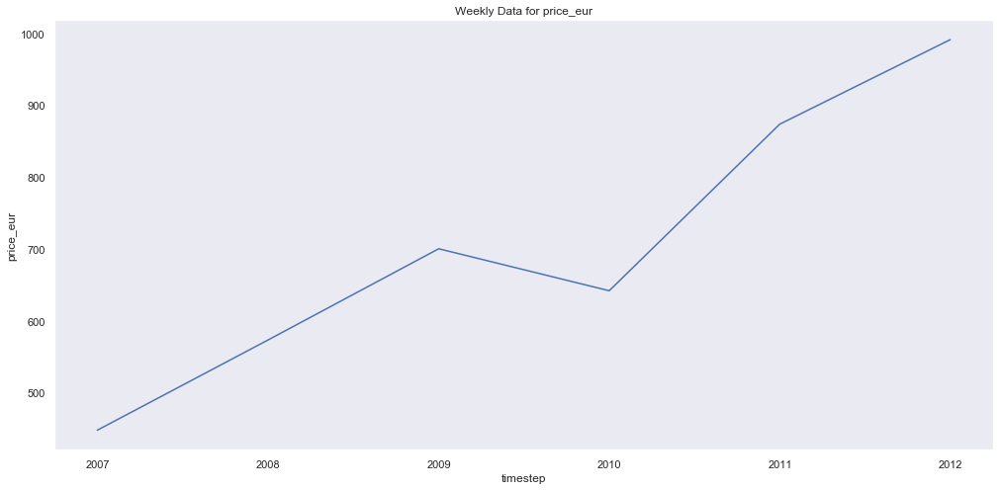

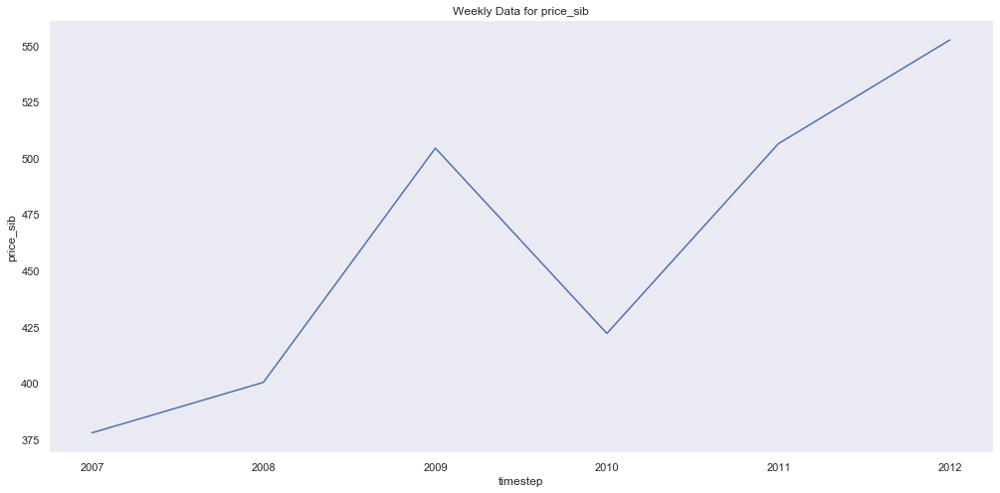

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 3.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 3.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 3.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seaso

{'MAPE': 2.7451541291046464, 'MAE': 2280.4930716831295}
{'MAPE': 3.6375310822205105, 'MAE': 786.6726772475558}
{'MAPE': 5.7531592403709375, 'MAE': 57.02484966705981}
{'MAPE': 10.958242991589788, 'MAE': 60.551595502793134}


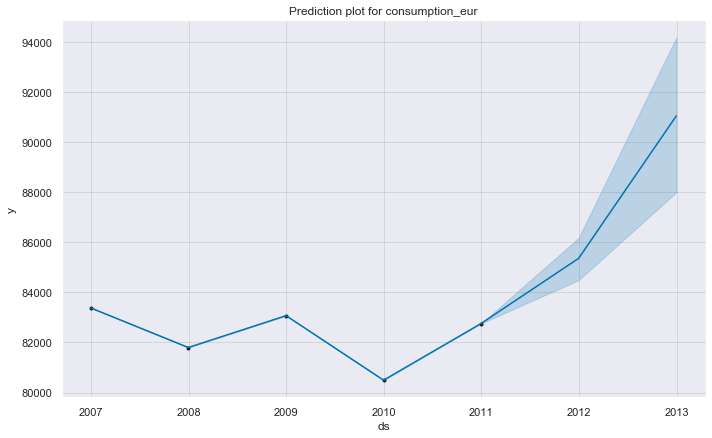

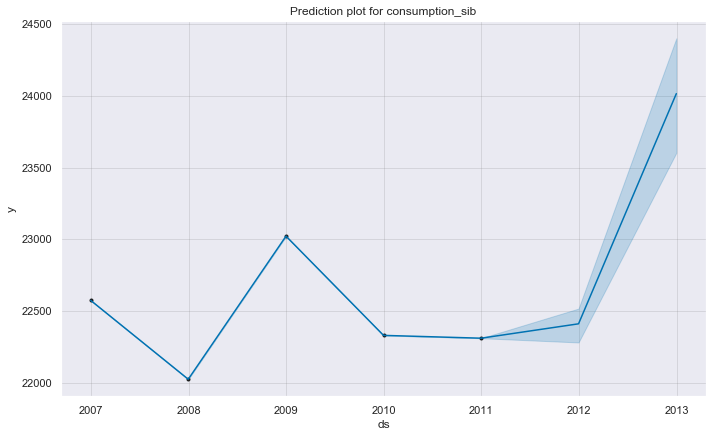

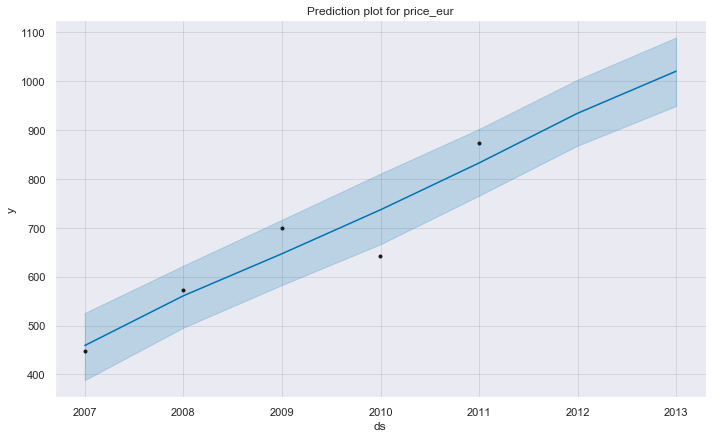

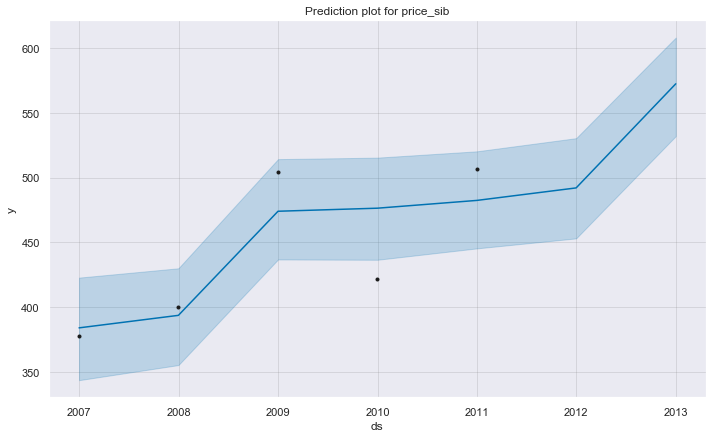

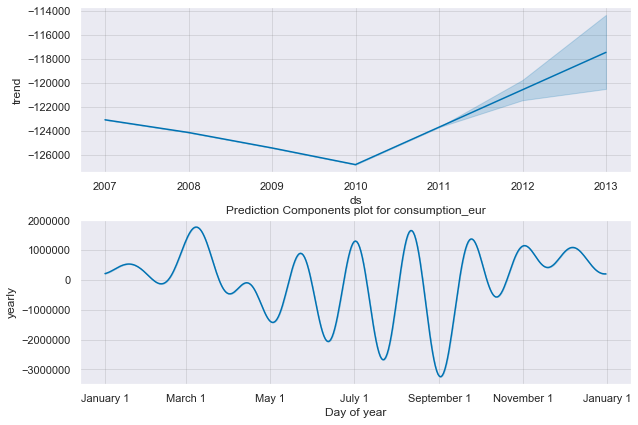

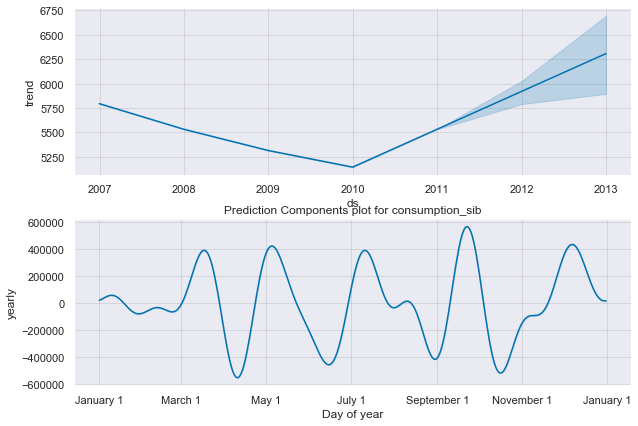

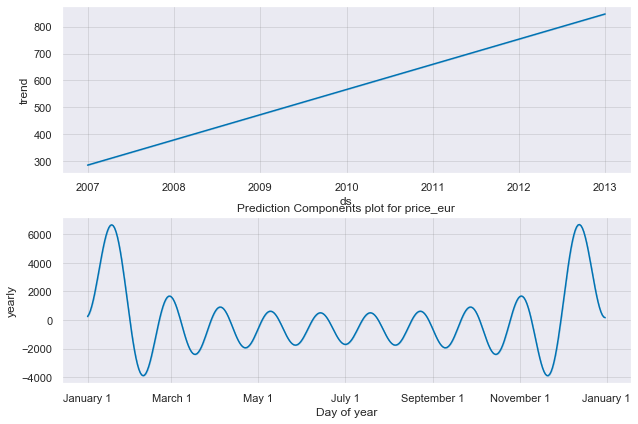

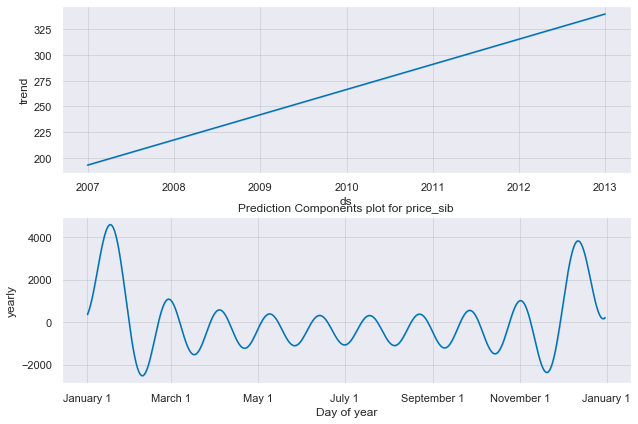

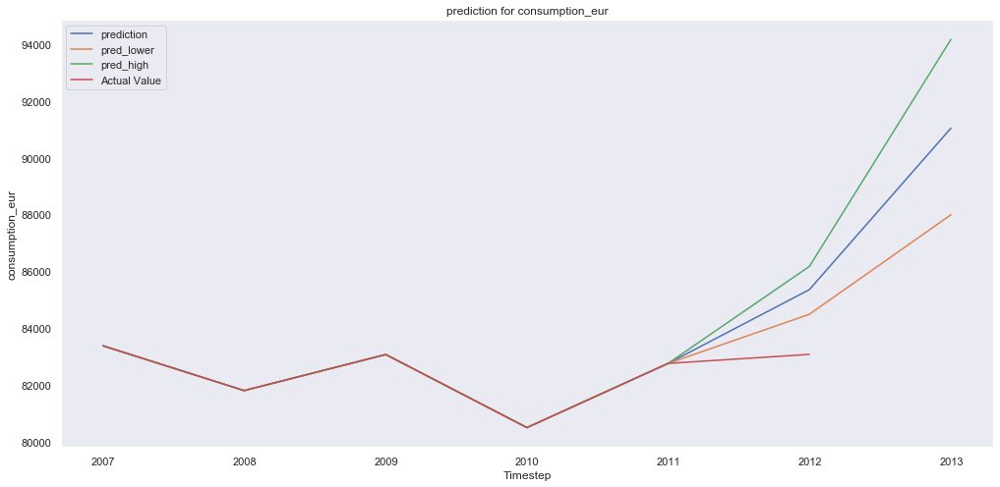

                       y          yhat    yhat_lower    yhat_upper
ds                                                                
2011-12-31  83073.407336  85353.900408  84485.223720  86169.677064
2012-12-31           NaN  91040.932822  87991.114239  94166.991118


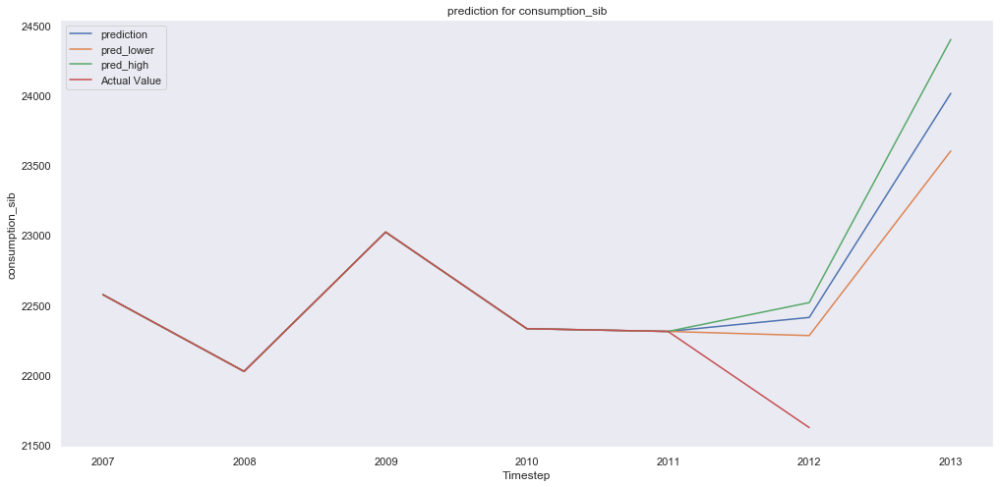

                      y          yhat    yhat_lower    yhat_upper
ds                                                               
2011-12-31  21626.55547  22413.228148  22283.634186  22519.161289
2012-12-31          NaN  24013.676266  23602.289573  24398.718562


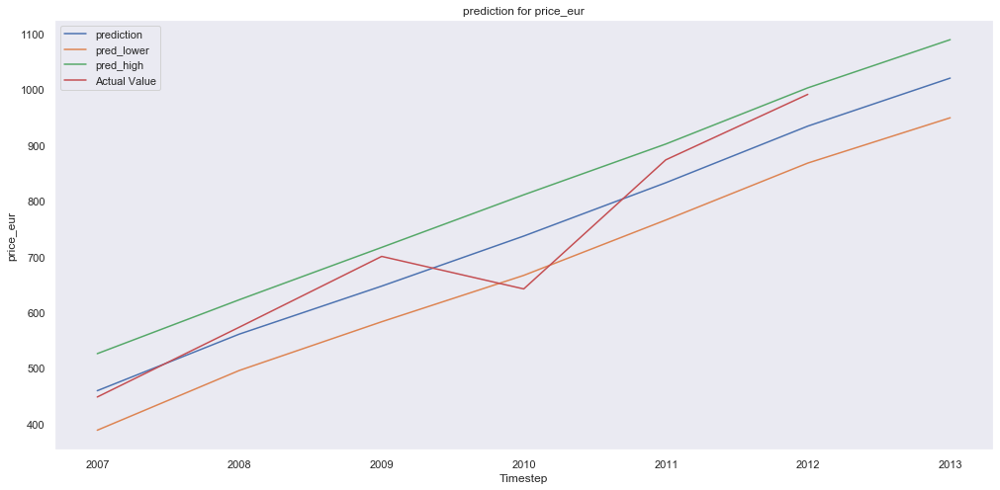

                     y         yhat  yhat_lower   yhat_upper
ds                                                          
2011-12-31  991.191922   934.167073  867.820398  1002.903432
2012-12-31         NaN  1020.388241  949.154717  1089.408354


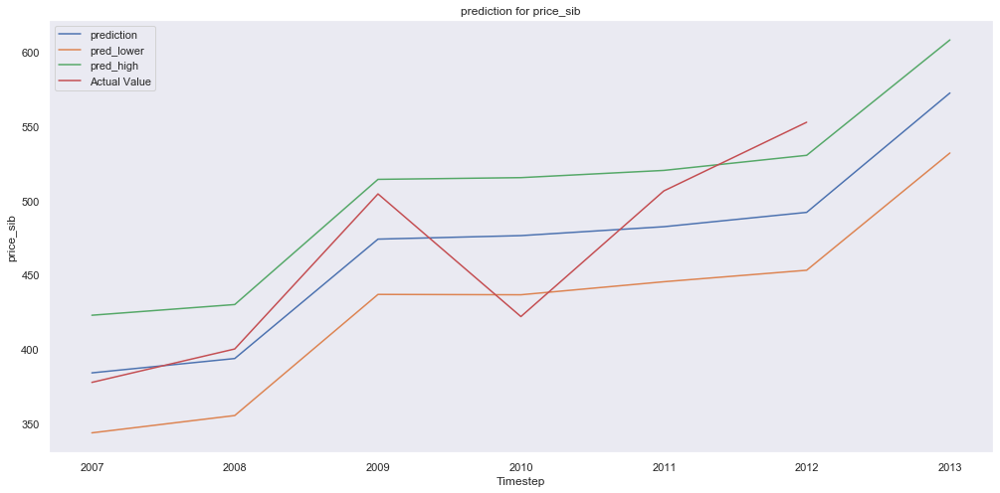

                     y        yhat  yhat_lower  yhat_upper
ds                                                        
2011-12-31  552.566644  492.015048  453.124259  530.343179
2012-12-31         NaN  572.240099  531.906568  607.898477


In [144]:
# Merge all code in a single run

#resample to weekly data
resample_yearly(price_volume)

#plot weekly_data
plot_data(yearly_data)

#split dataset into single data in a list
single_data(yearly_data) 

#split each dataset into individual datasets 
split(lst)

#train and predicts each dataset
train_predict(split_data)

#plot Prediction
plot_prediction(forcast_lst, yearly_data) 

#plot forcast components
plot_pred_comp(forcast_lst, yearly_data)    
    
#evaluate data
eval_data = list(map(lambda X: evaluate(X[0],X[1]), list(zip(lst, forcast_lst))))
eval_data
    
#calc prediction error
for it in eval_data:
    pred_error = pred_errors(it, fcst_size)
    print(pred_error)

# Plot forecast with upper and lower bounds
for data, col in zip(eval_data, yearly_data):      
    plt.figure(figsize=(17, 8))
    plt.plot(data['yhat'], label = "prediction")
    plt.plot(data['yhat_lower'], label = "pred_lower")
    plt.plot(data['yhat_upper'], label = "pred_high")
    plt.plot(data['y'], label = "Actual Value")
    plt.xlabel('Timestep')
    plt.ylabel(col)
    plt.title(f"prediction for {col}")
    plt.grid(False)
    plt.legend()
    plt.show()
    print(pred_table(data).tail(10))



### Prediction for Yearly `UES_dayahead_price`

In [145]:
daily_price = UES_dayahead_price.copy()

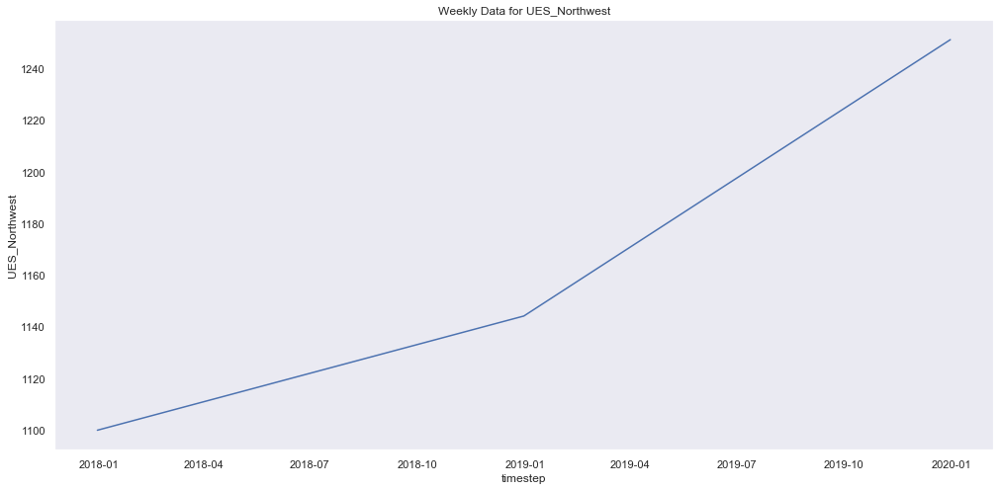

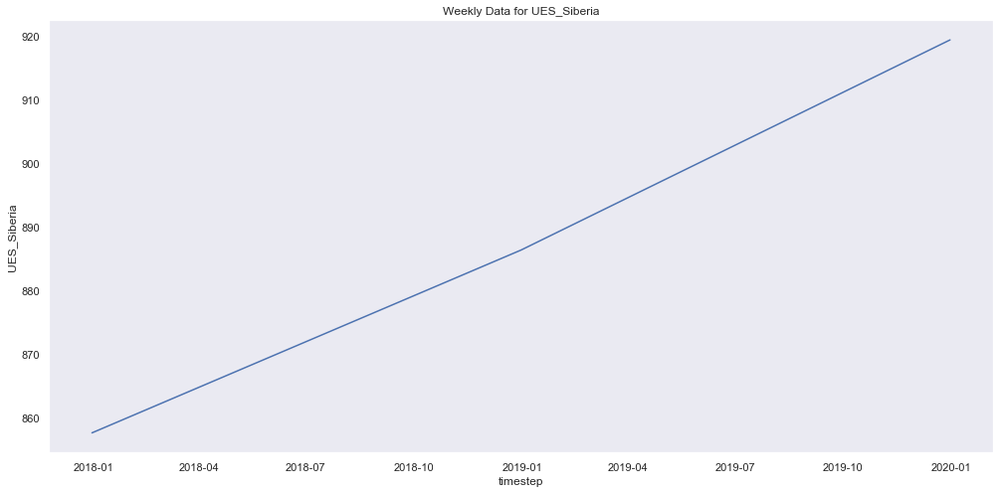

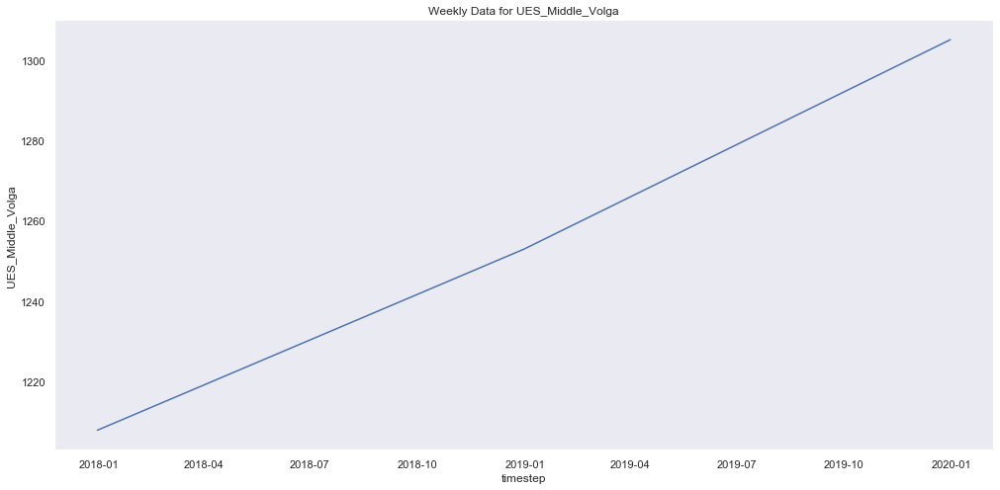

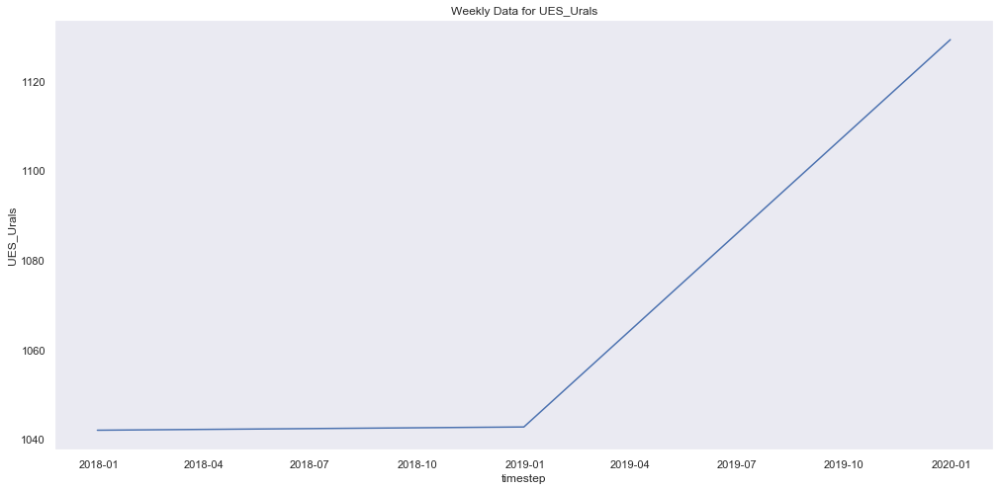

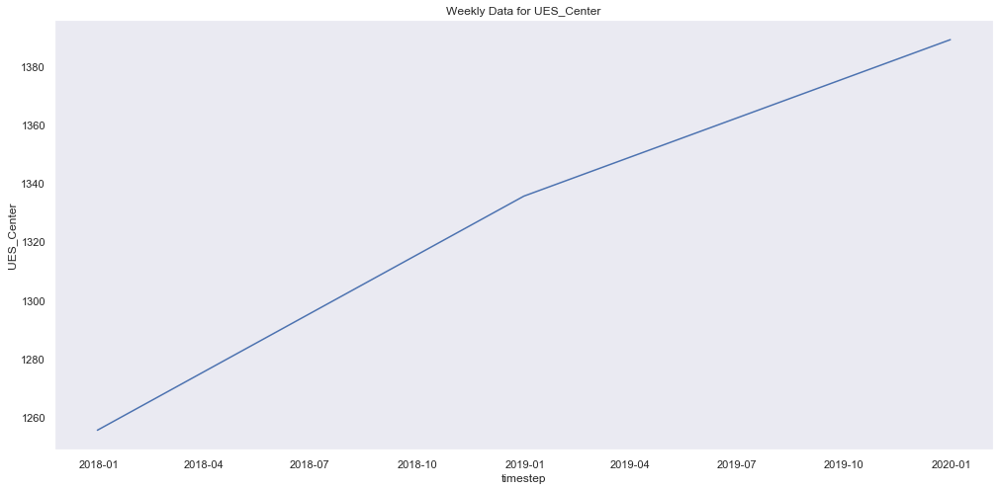

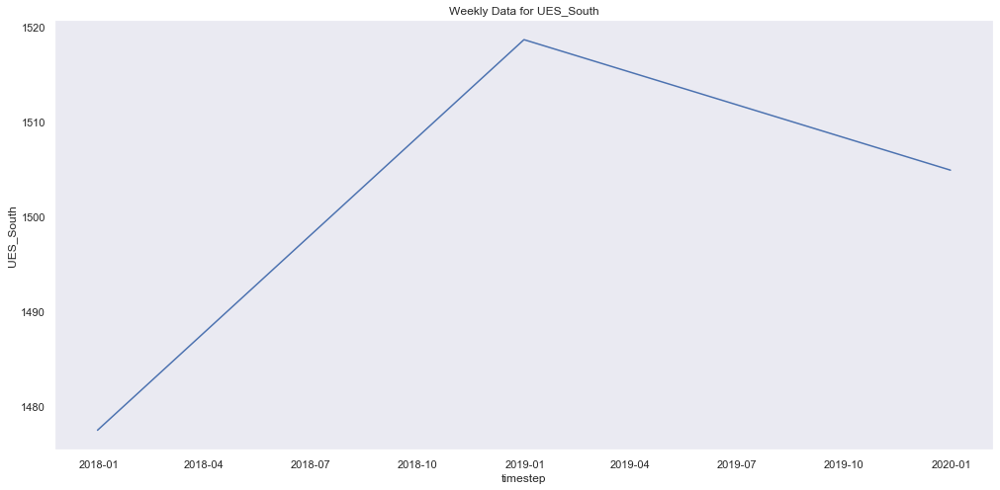

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 0.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 0.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality

{'MAPE': 5.019041449547756, 'MAE': 62.79448467662519}
{'MAPE': 0.4684925026469777, 'MAE': 4.307529616301622}
{'MAPE': 0.5429846809939689, 'MAE': 7.086277025881827}
{'MAPE': 7.599042120552368, 'MAE': 85.8092946360639}
{'MAPE': 1.9099697277557655, 'MAE': 26.52961929196522}
{'MAPE': 3.647878800999744, 'MAE': 54.89523114368558}


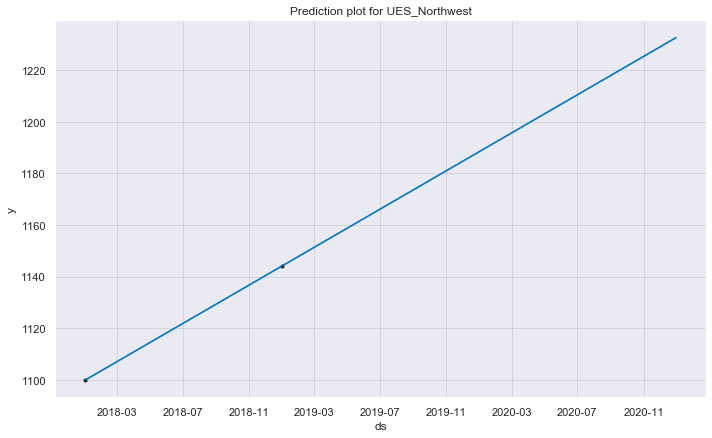

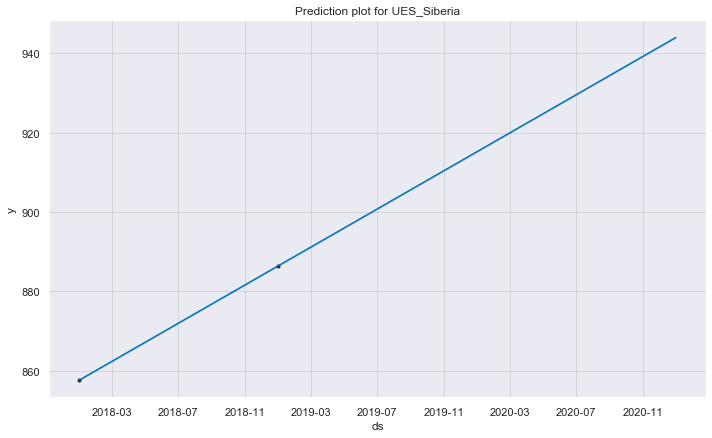

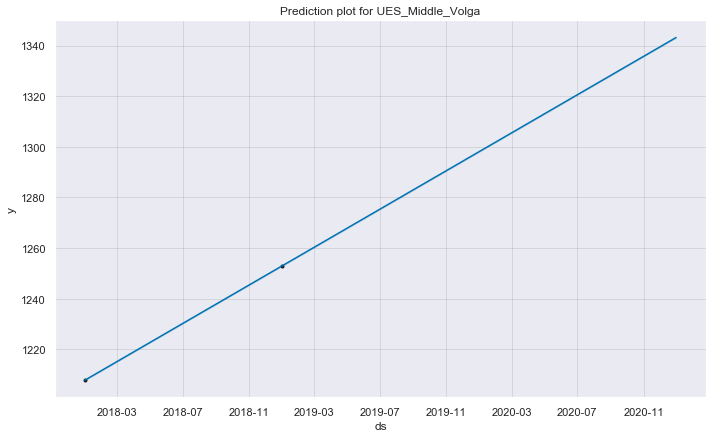

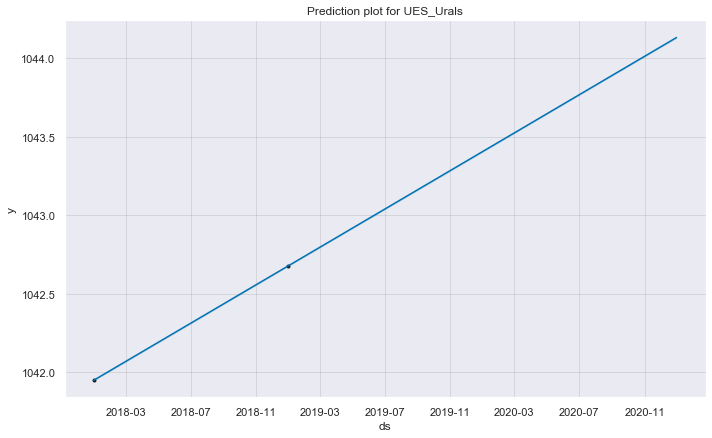

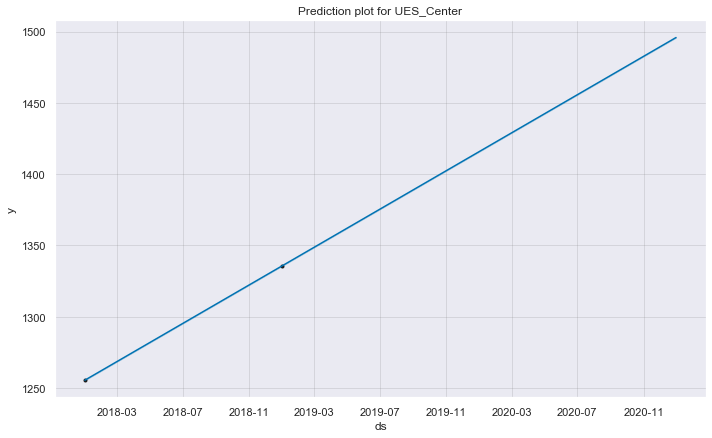

...

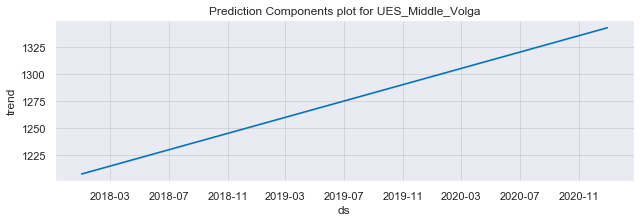

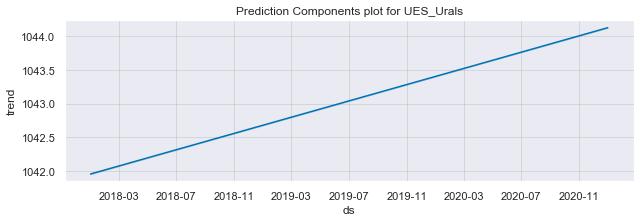

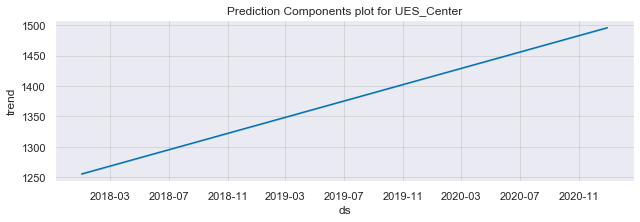

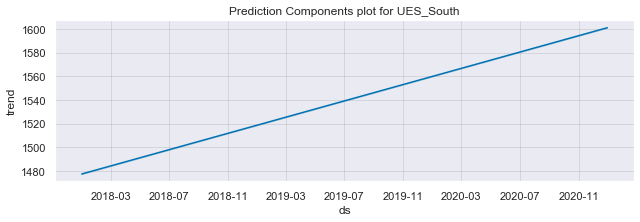

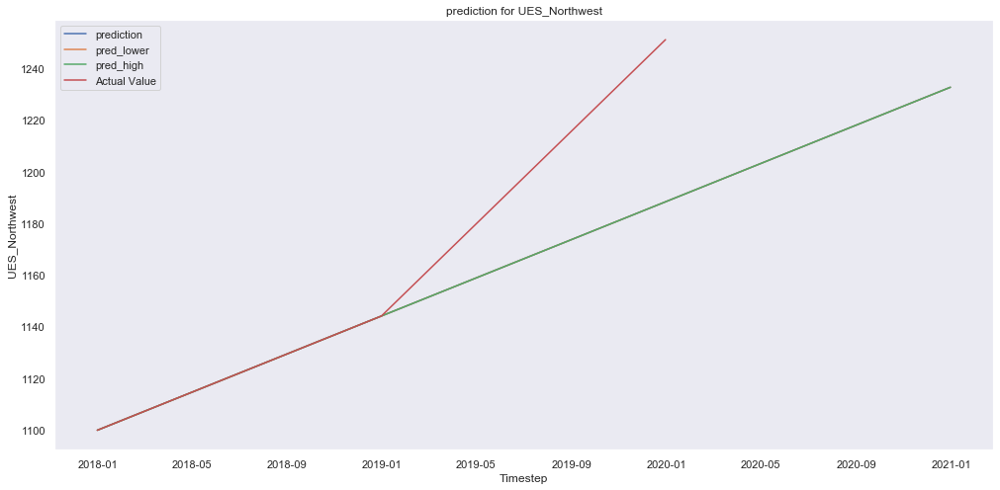

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-12-31  1251.125047  1188.330562  1188.330553  1188.330572
2020-12-31          NaN  1232.682351  1232.682319  1232.682382


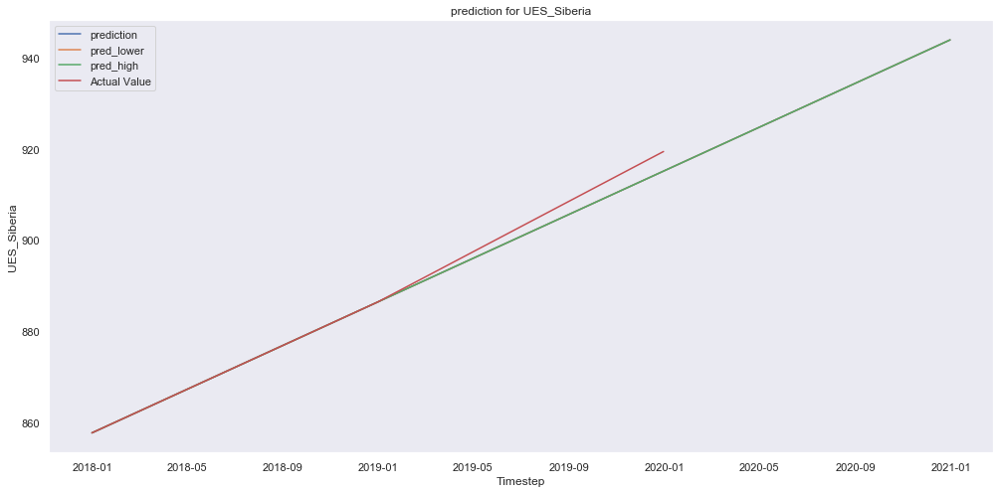

                     y        yhat  yhat_lower  yhat_upper
ds                                                        
2019-12-31  919.444728  915.137198  915.137192  915.137204
2020-12-31         NaN  943.967900  943.967877  943.967921


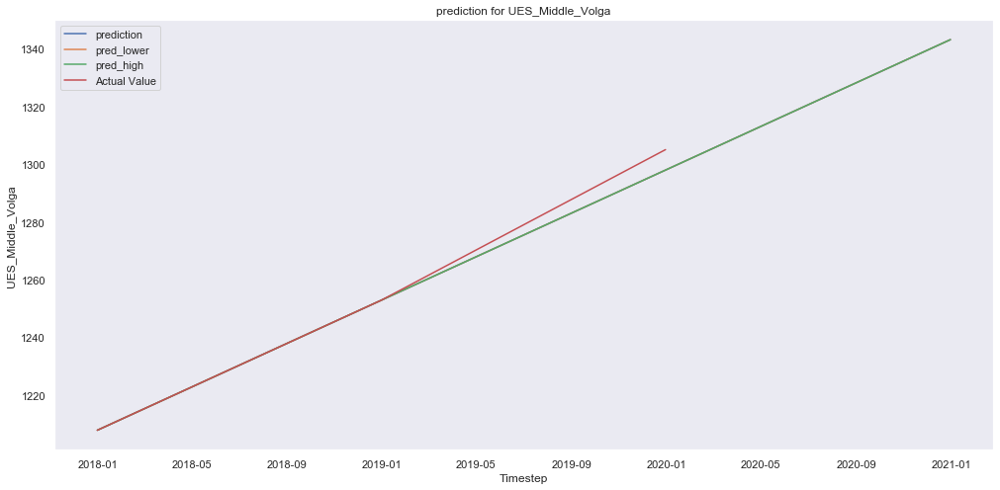

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-12-31  1305.060211  1297.973934  1297.973925  1297.973943
2020-12-31          NaN  1343.150040  1343.150009  1343.150068


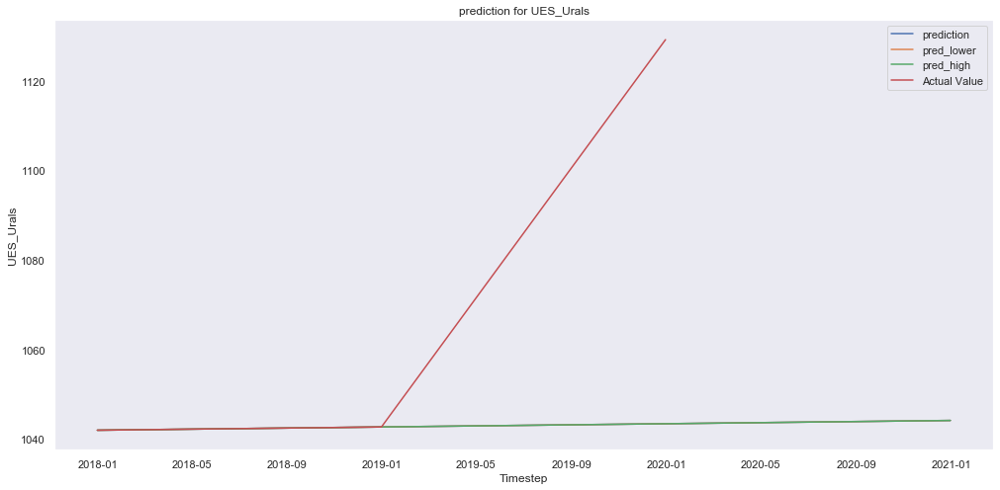

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-12-31  1129.211988  1043.402694  1043.402686  1043.402701
2020-12-31          NaN  1044.130549  1044.130526  1044.130575


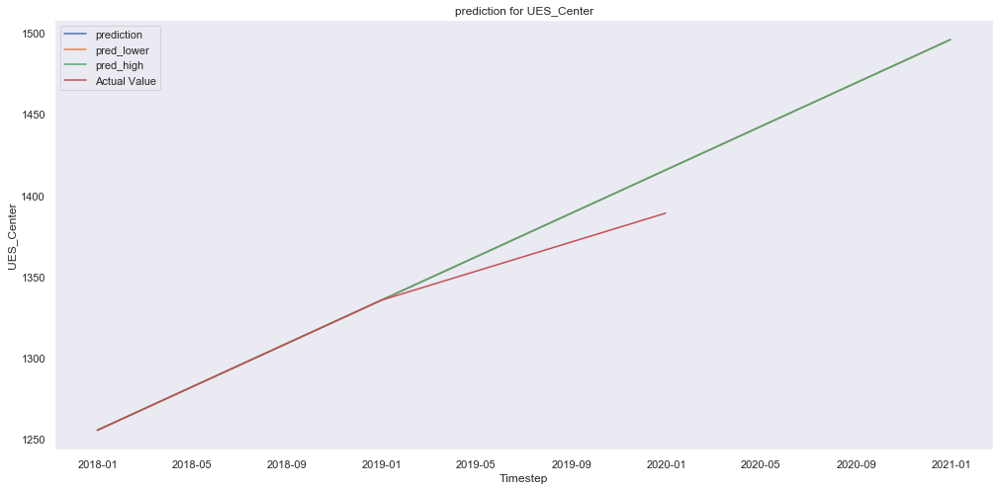

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-12-31  1389.007318  1415.536937  1415.536928  1415.536948
2020-12-31          NaN  1495.779528  1495.779500  1495.779563


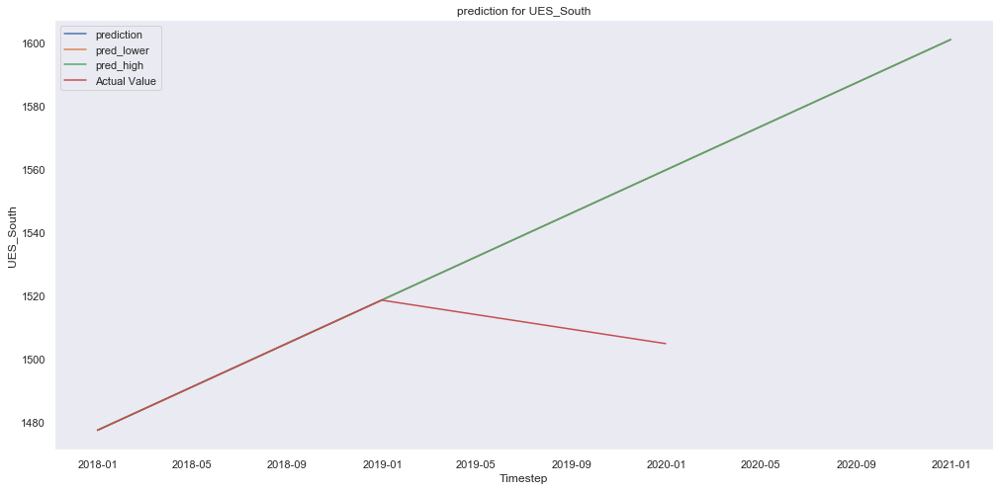

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-12-31  1504.853482  1559.748713  1559.748704  1559.748723
2020-12-31          NaN  1601.008372  1601.008338  1601.008410


In [146]:
# Merge all code in a single run

#resample to weekly data
resample_yearly(daily_price)

#plot weekly_data
plot_data(yearly_data)

#split dataset into single data in a list
single_data(yearly_data) 

#split each dataset into individual datasets 
split(lst)

#train and predicts each dataset
train_predict(split_data)

#plot Prediction
plot_prediction(forcast_lst, yearly_data) 

#plot forcast components
plot_pred_comp(forcast_lst, yearly_data)    
    
#evaluate data
eval_data = list(map(lambda X: evaluate(X[0],X[1]), list(zip(lst, forcast_lst))))
eval_data
    
#calc prediction error
for it in eval_data:
    pred_error = pred_errors(it, fcst_size)
    print(pred_error)

# Plot forecast with upper and lower bounds
for data, col in zip(eval_data, yearly_data):      
    plt.figure(figsize=(17, 8))
    plt.plot(data['yhat'], label = "prediction")
    plt.plot(data['yhat_lower'], label = "pred_lower")
    plt.plot(data['yhat_upper'], label = "pred_high")
    plt.plot(data['y'], label = "Actual Value")
    plt.xlabel('Timestep')
    plt.ylabel(col)
    plt.title(f"prediction for {col}")
    plt.grid(False)
    plt.legend()
    plt.show()
    print(pred_table(data).tail(10))


### Prediction for Daily `UES_intraday_price`

In [147]:
daily_intraday = UES_intraday_price.copy()

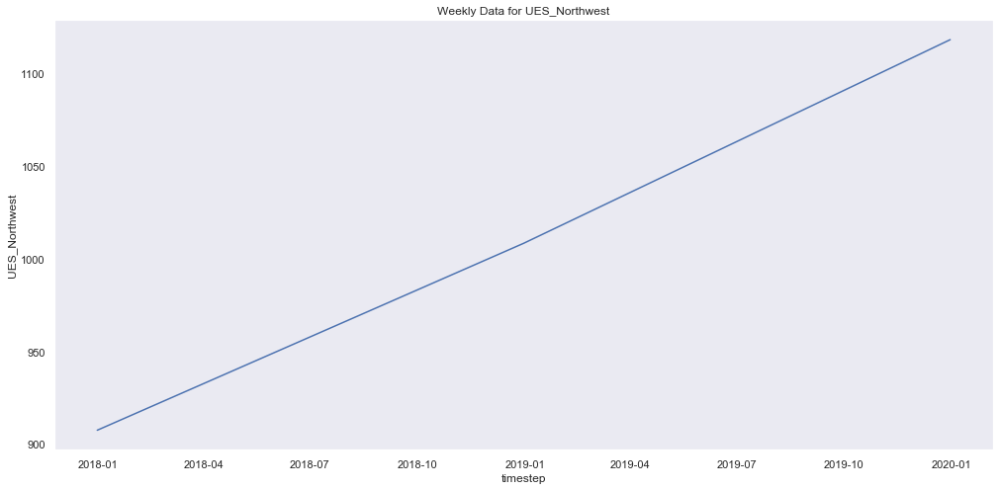

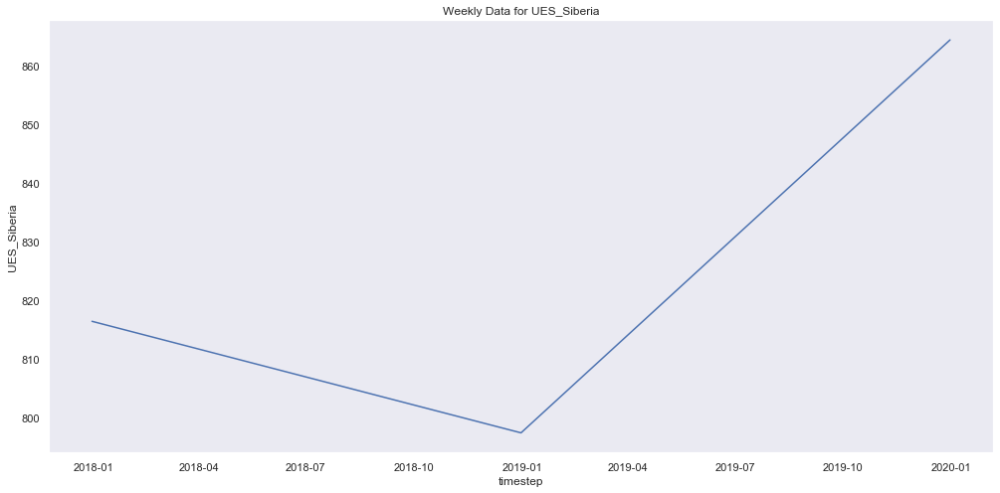

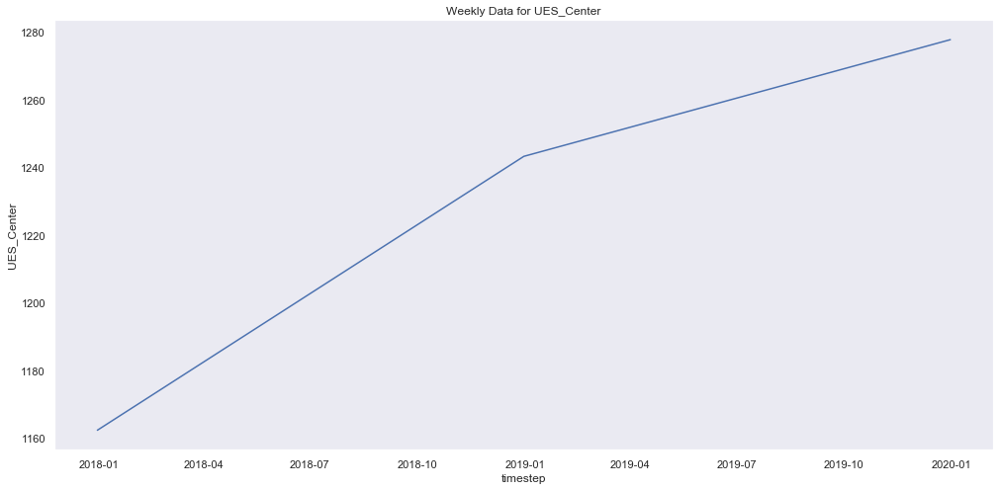

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 0.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 0.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality

{'MAPE': 0.8035674223408923, 'MAE': 8.985681998562086}
{'MAPE': 5.042838442017118, 'MAE': 43.58951140944396}
{'MAPE': 3.63909481912188, 'MAE': 46.4983078621558}


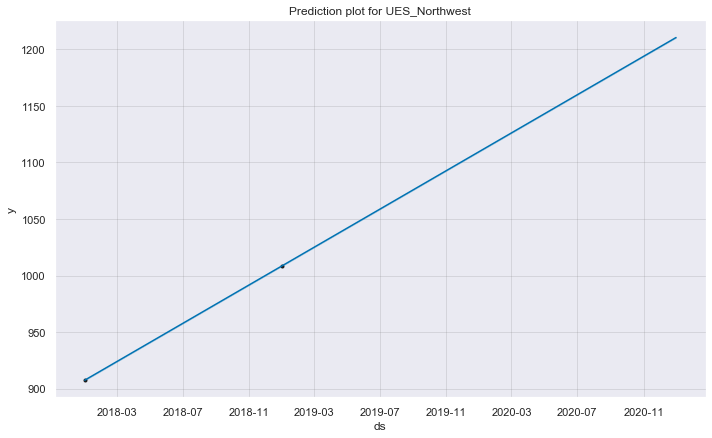

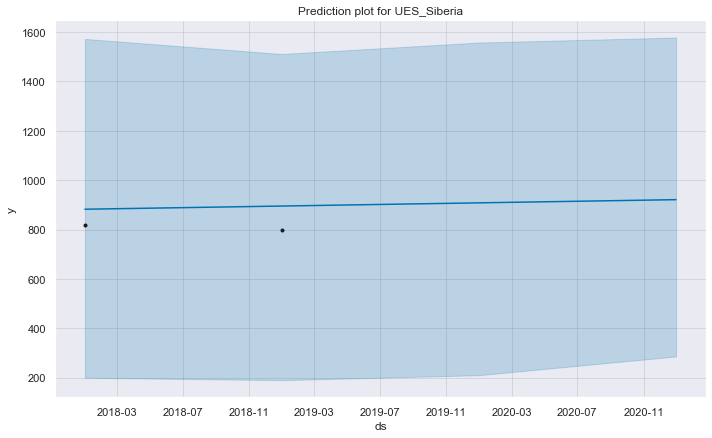

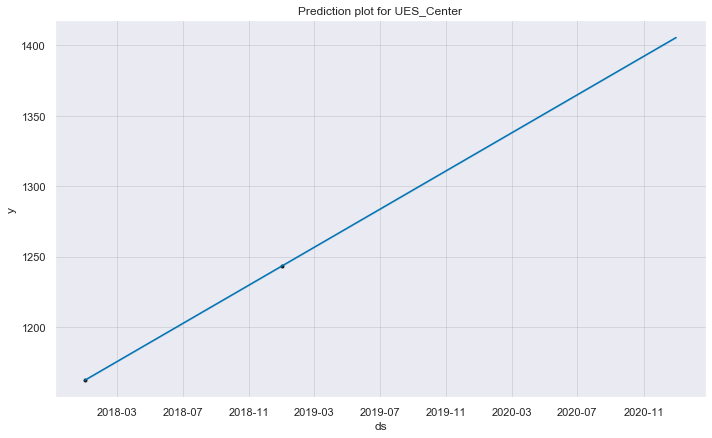

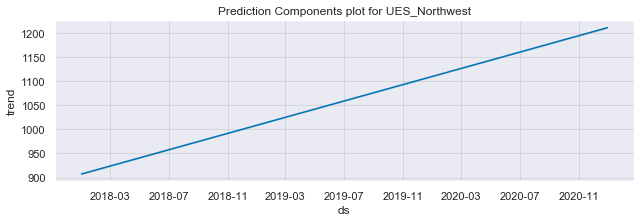

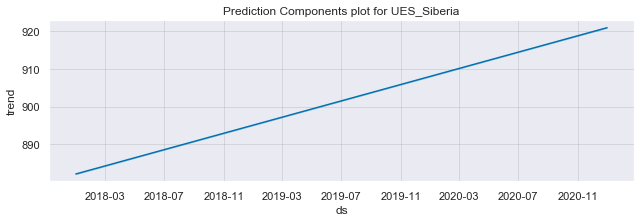

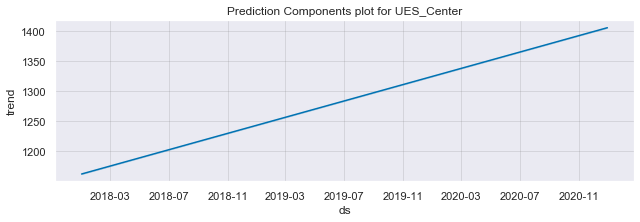

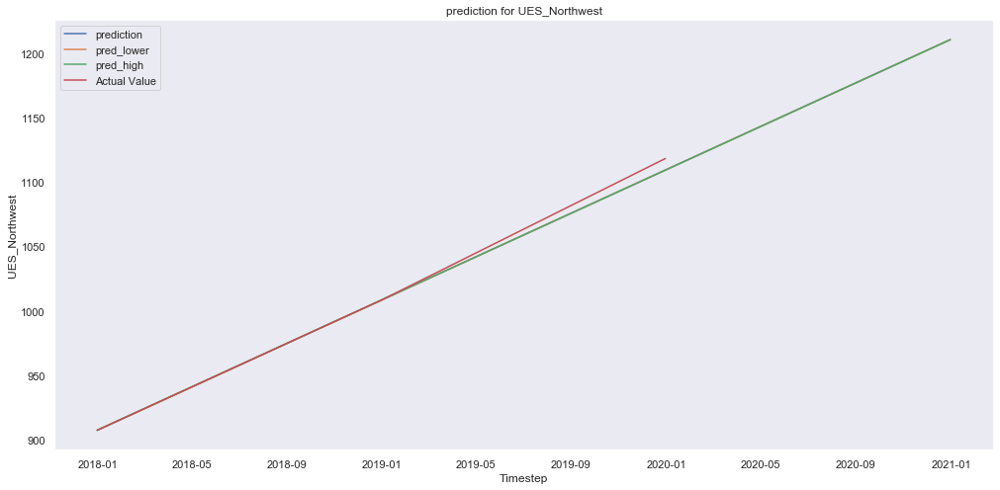

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-12-31  1118.223779  1109.238097  1109.238090  1109.238105
2020-12-31          NaN  1210.393649  1210.393624  1210.393675


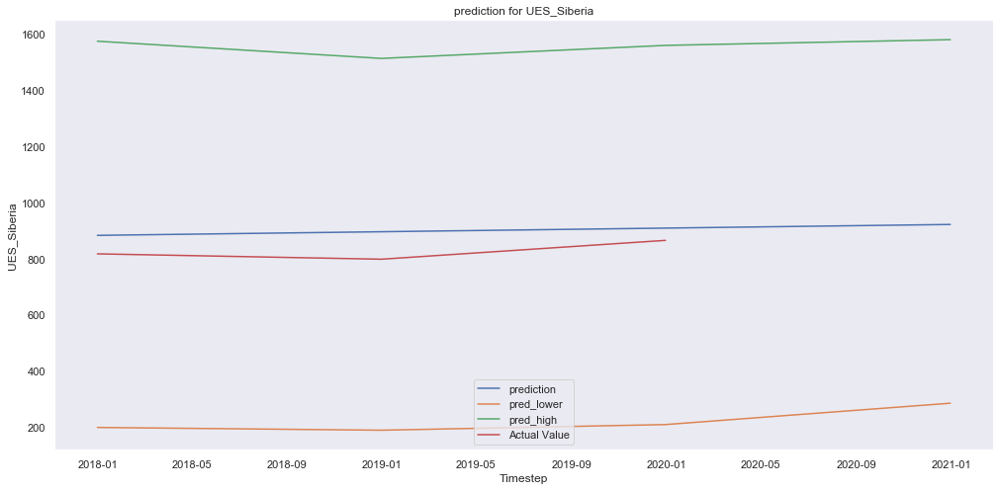

                     y        yhat  yhat_lower   yhat_upper
ds                                                         
2019-12-31  864.384452  907.973963  209.802979  1557.316012
2020-12-31         NaN  920.923852  285.680090  1577.658633


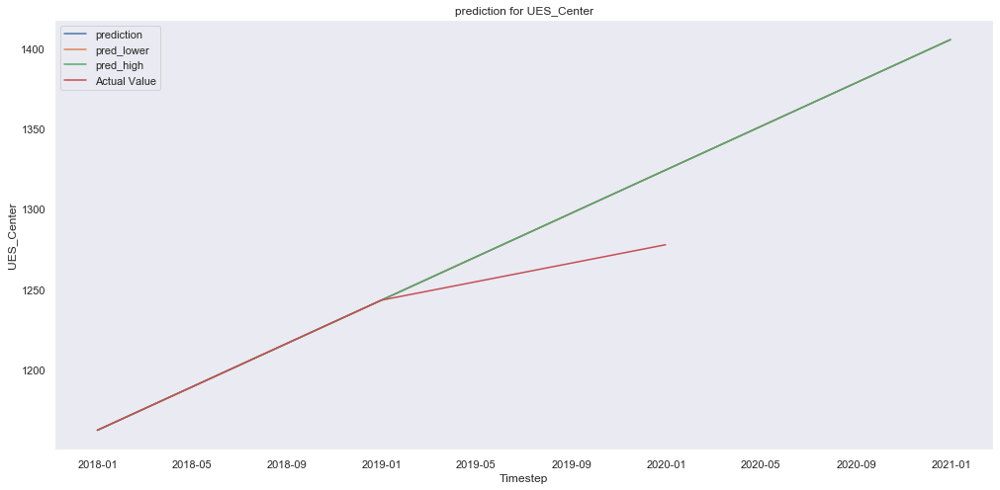

                      y         yhat   yhat_lower   yhat_upper
ds                                                            
2019-12-31  1277.743784  1324.242092  1324.242084  1324.242100
2020-12-31          NaN  1405.476671  1405.476643  1405.476698


In [148]:
# Merge all code in a single run

#resample to weekly data
resample_yearly(daily_intraday)

#plot weekly_data
plot_data(yearly_data)

#split dataset into single data in a list
single_data(yearly_data) 

#split each dataset into individual datasets 
split(lst)

#train and predicts each dataset
train_predict(split_data)

#plot Prediction
plot_prediction(forcast_lst, yearly_data) 

#plot forcast components
plot_pred_comp(forcast_lst, yearly_data)    
    
#evaluate data
eval_data = list(map(lambda X: evaluate(X[0],X[1]), list(zip(lst, forcast_lst))))
eval_data
    
#calc prediction error
for it in eval_data:
    pred_error = pred_errors(it, fcst_size)
    print(pred_error)

# Plot forecast with upper and lower bounds
for data, col in zip(eval_data, yearly_data):      
    plt.figure(figsize=(17, 8))
    plt.plot(data['yhat'], label = "prediction")
    plt.plot(data['yhat_lower'], label = "pred_lower")
    plt.plot(data['yhat_upper'], label = "pred_high")
    plt.plot(data['y'], label = "Actual Value")
    plt.xlabel('Timestep')
    plt.ylabel(col)
    plt.title(f"prediction for {col}")
    plt.grid(False)
    plt.legend()
    plt.show()
    print(pred_table(data).tail(10))


# THANK YOU!